In [157]:
from statsmodels.tsa.stattools import grangercausalitytests
import matplotlib.pyplot as plt
import pandas as pd
import glob,os
import re
from sklearn import preprocessing
import statsmodels.tsa.stattools as stat
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn import metrics

In [4]:
# dataframe에 있는 데이터를 정규화 처리 함수
scaler = preprocessing.MinMaxScaler()

def scaleColumns(df, cols_to_scale):
    for col in cols_to_scale:
        df[col] = scaler.fit_transform(pd.DataFrame(df[col]))
    return df

In [145]:
# Granger causality test matrix
def grangers_causality_matrix(X_train, variables, test = 'ssr_chi2test', verbose=False):
        dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
        for c in dataset.columns:
            for r in dataset.index:
                test_result = grangercausalitytests(X_train[[r,c]], maxlag=maxlag, verbose=False)
                p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
                if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
                min_p_value = np.min(p_values)
                dataset.loc[r,c] = min_p_value
        dataset.columns = [var + '_x' for var in variables]
        dataset.index = [var + '_y' for var in variables]
        return dataset

In [150]:
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [155]:
def split_xy5(dataset, time_steps, y_column):
    x, y = list(), list()
    for i in range(len(dataset)):
        x_end_number = i + time_steps
        y_end_number = x_end_number + y_column # 수정

        if y_end_number > len(dataset):  # 수정
            break
        tmp_x = dataset[i:x_end_number, :]  # 수정
        tmp_y = dataset[x_end_number:y_end_number,1]    # 수정
        x.append(tmp_x)
        y.append(tmp_y)
    return np.array(x), np.array(y)

# 키워드

## 4차산업

### 일별

#### 복합

- Naver

In [85]:
industry_keyword_complex = pd.read_csv("./키워드 검색량 데이터/복합키워드_일별_네이버/4차산업_복합.csv")

In [86]:
industry_keyword_complex.rename(columns={'날짜':'Date'}, inplace = True)

In [87]:
industry_keyword_complex.dropna(axis=0,how='any')

,Date,4차산업
0,2016-01-01,0.49145
1,2016-01-02,0.55130
2,2016-01-03,0.63762
3,2016-01-04,1.16906
4,2016-01-05,1.17250
...,...,...
1456,2019-12-27,1.28478
1457,2019-12-28,0.94557
1458,2019-12-29,1.03666
1459,2019-12-30,1.32079


In [88]:
scaleColumns(industry_keyword_complex,['4차산업'])

,Date,4차산업
0,2016-01-01,0.000928
1,2016-01-02,0.001529
2,2016-01-03,0.002395
3,2016-01-04,0.007731
4,2016-01-05,0.007766
...,...,...
1456,2019-12-27,0.008893
1457,2019-12-28,0.005487
1458,2019-12-29,0.006402
1459,2019-12-30,0.009254


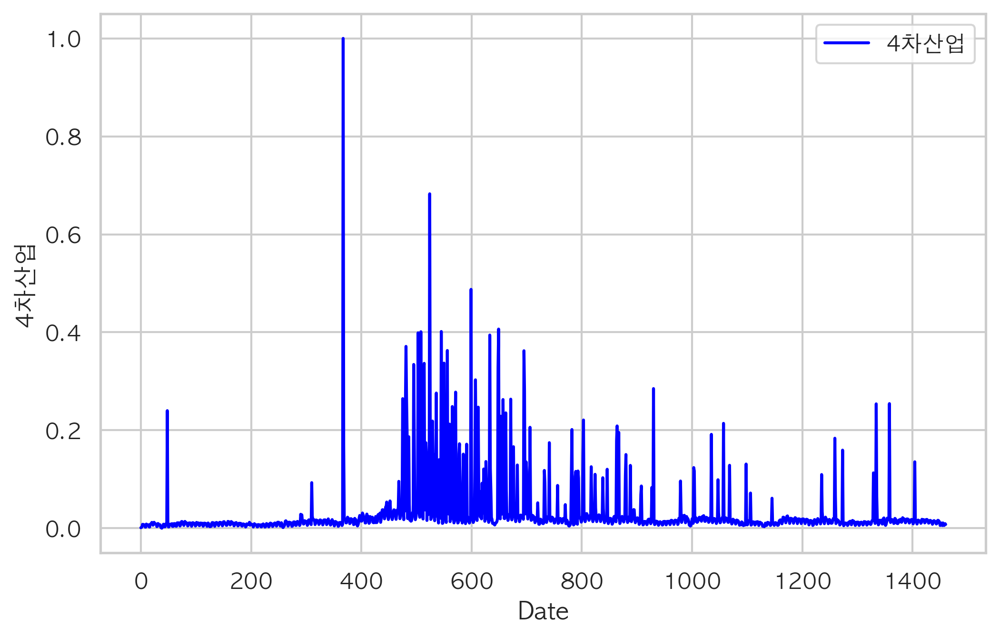

In [89]:
ax = industry_keyword_complex.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('4차산업') 
plt.show()

#### 단일

- Naver

In [90]:
industry_keyword_sigle_naver= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/4차산업_단일.csv")

In [91]:
industry_keyword_sigle_naver.dropna(axis=0,how='any')

,날짜,4차산업
0,2016-01-01,0.37878
1,2016-01-02,0.73051
2,2016-01-03,0.67640
3,2016-01-04,0.89285
4,2016-01-05,0.67640
...,...,...
1456,2019-12-27,8.73917
1457,2019-12-28,6.08766
1458,2019-12-29,6.46645
1459,2019-12-30,11.49891


In [92]:
industry_keyword_sigle_naver.rename(columns={'날짜':'Date'}, inplace = True)
industry_keyword_sigle_naver

,Date,4차산업
0,2016-01-01,0.37878
1,2016-01-02,0.73051
2,2016-01-03,0.67640
3,2016-01-04,0.89285
4,2016-01-05,0.67640
...,...,...
1456,2019-12-27,8.73917
1457,2019-12-28,6.08766
1458,2019-12-29,6.46645
1459,2019-12-30,11.49891


In [93]:
scaleColumns(industry_keyword_sigle_naver,['4차산업'])

,Date,4차산업
0,2016-01-01,0.000814
1,2016-01-02,0.004342
2,2016-01-03,0.003799
3,2016-01-04,0.005970
4,2016-01-05,0.003799
...,...,...
1456,2019-12-27,0.084668
1457,2019-12-28,0.058073
1458,2019-12-29,0.061873
1459,2019-12-30,0.112347


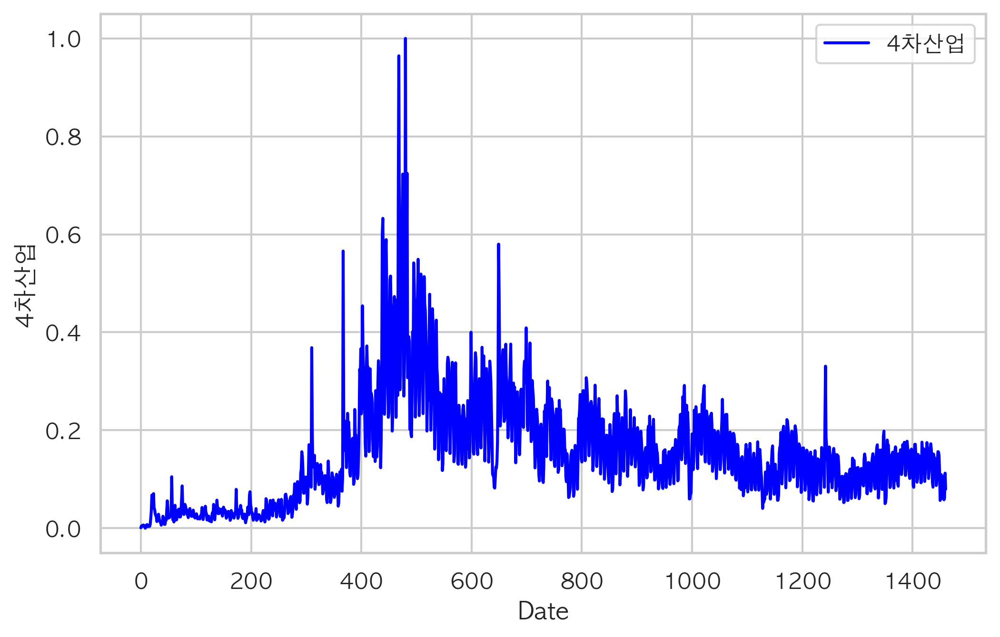

In [94]:
ax = industry_keyword_sigle_naver.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('4차산업') 
plt.show()

- Google Trend

In [95]:
industry_keyword_sigle_google= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/4차산업_Trends.csv")

In [96]:
industry_keyword_sigle_google.dropna(axis=0,how='any')

,Date,4차산업
0,2016-01-01,0
1,2016-01-02,0
2,2016-01-03,0
3,2016-01-04,0
4,2016-01-05,41
...,...,...
1456,2019-12-27,19
1457,2019-12-28,10
1458,2019-12-29,24
1459,2019-12-30,54


In [97]:
scaleColumns(industry_keyword_sigle_google,['4차산업'])

,Date,4차산업
0,2016-01-01,0.00
1,2016-01-02,0.00
2,2016-01-03,0.00
3,2016-01-04,0.00
4,2016-01-05,0.41
...,...,...
1456,2019-12-27,0.19
1457,2019-12-28,0.10
1458,2019-12-29,0.24
1459,2019-12-30,0.54


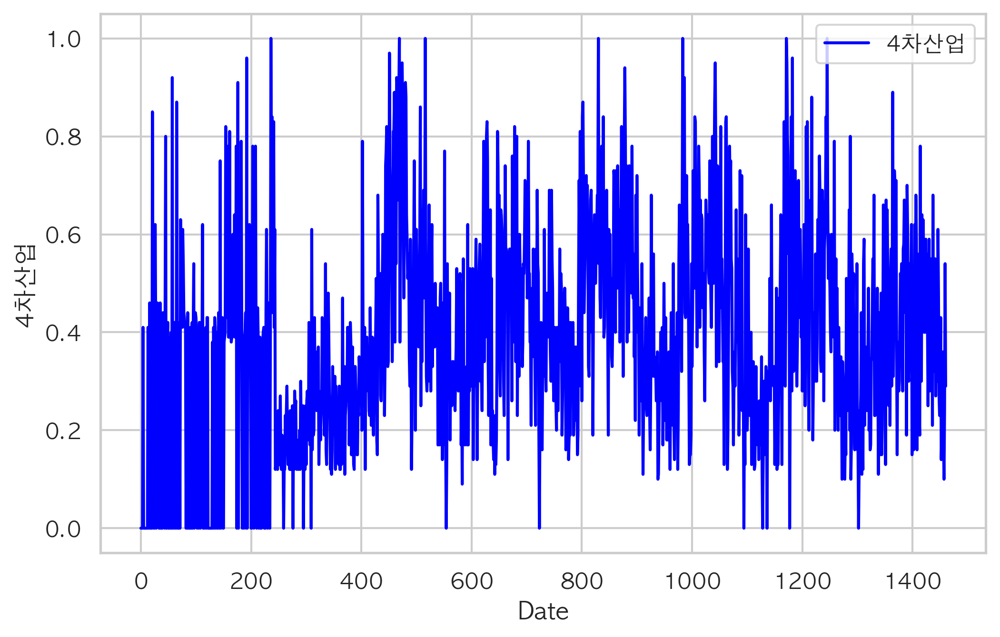

In [98]:
ax = industry_keyword_sigle_google.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('4차산업') 
plt.show()

## IOT

### 일별

#### 복합

- Naver

In [67]:
iot_keyword_complex = pd.read_csv("./키워드 검색량 데이터/복합키워드_일별_네이버/사물인터넷_복합.csv")

In [68]:
iot_keyword_complex.rename(columns={'날짜':'Date'}, inplace = True)

In [69]:
iot_keyword_complex.dropna(axis=0,how='any')

,Date,사물인터넷
0,2016-01-01,2.33044
1,2016-01-02,2.37738
2,2016-01-03,2.71977
3,2016-01-04,5.48993
4,2016-01-05,5.82128
...,...,...
1456,2019-12-27,3.02902
1457,2019-12-28,2.12818
1458,2019-12-29,2.27177
1459,2019-12-30,3.07320


In [70]:
scaleColumns(iot_keyword_complex,['사물인터넷'])

,Date,사물인터넷
0,2016-01-01,0.006788
1,2016-01-02,0.007265
2,2016-01-03,0.010747
3,2016-01-04,0.038917
4,2016-01-05,0.042287
...,...,...
1456,2019-12-27,0.013892
1457,2019-12-28,0.004731
1458,2019-12-29,0.006191
1459,2019-12-30,0.014341


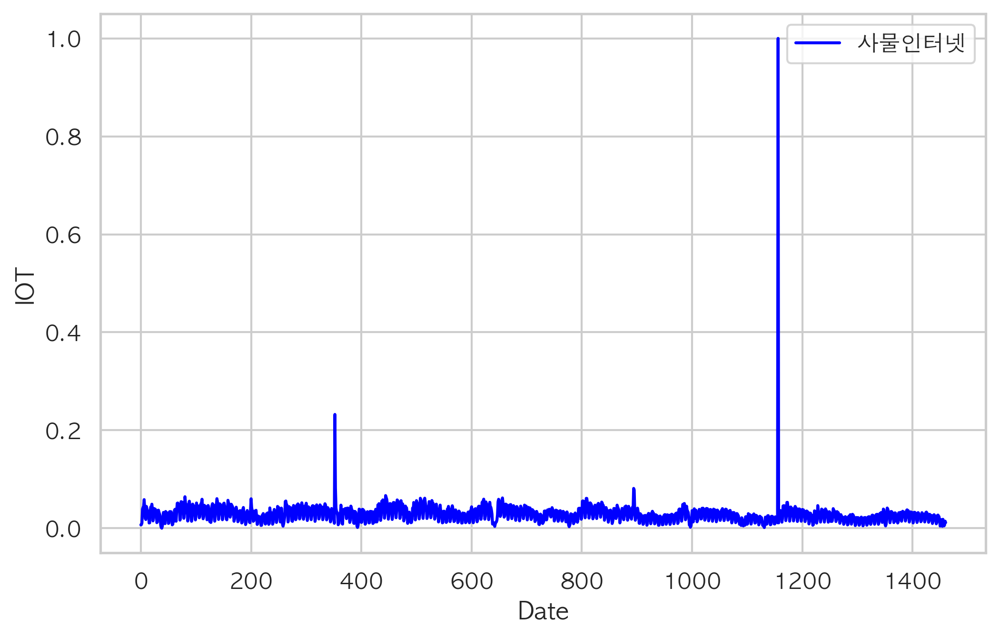

In [71]:
ax = iot_keyword_complex.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('IOT') 
plt.show()

#### 단일

- Naver

In [74]:
iot_keyword_sigle_naver= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/사물인터넷_단일.csv")

In [75]:
iot_keyword_sigle_naver.dropna(axis=0,how='any')

,날짜,사물인터넷
0,2016-01-01,0.63890
1,2016-01-02,0.51552
2,2016-01-03,0.62543
3,2016-01-04,1.07004
4,2016-01-05,1.13315
...,...,...
1456,2019-12-27,0.32831
1457,2019-12-28,0.18224
1458,2019-12-29,0.24109
1459,2019-12-30,0.31909


In [76]:
iot_keyword_sigle_naver.rename(columns={'날짜':'Date'}, inplace = True)
ai_keyword_sigle_naver

,Date,인공지능
0,2016-01-01,0.000049
1,2016-01-02,0.000000
2,2016-01-03,0.000713
3,2016-01-04,0.005654
4,2016-01-05,0.005629
...,...,...
1456,2019-12-27,0.018829
1457,2019-12-28,0.010398
1458,2019-12-29,0.016322
1459,2019-12-30,0.017797


In [77]:
scaleColumns(iot_keyword_sigle_naver,['사물인터넷'])

,Date,사물인터넷
0,2016-01-01,0.004794
1,2016-01-02,0.003558
2,2016-01-03,0.004659
3,2016-01-04,0.009113
4,2016-01-05,0.009745
...,...,...
1456,2019-12-27,0.001683
1457,2019-12-28,0.000220
1458,2019-12-29,0.000810
1459,2019-12-30,0.001591


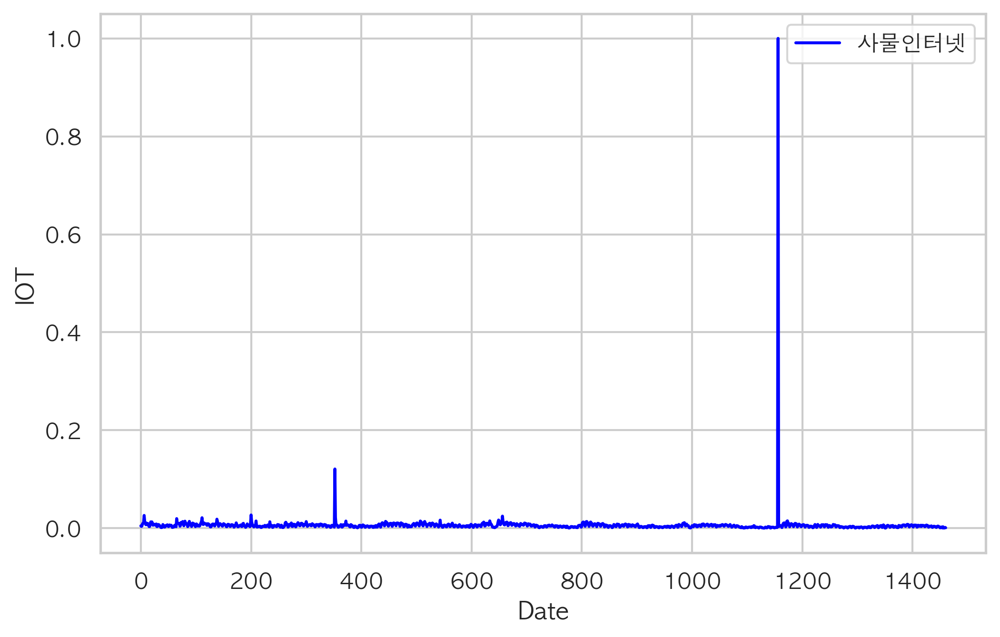

In [78]:
ax = iot_keyword_sigle_naver.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('IOT') 
plt.show()

- Google Trend

In [81]:
iot_keyword_sigle_google= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/사물인터넷_Trends.csv")

In [82]:
iot_keyword_sigle_google.dropna(axis=0,how='any')

,Date,사물인터넷
0,2016-01-01,0
1,2016-01-02,0
2,2016-01-03,37
3,2016-01-04,33
4,2016-01-05,33
...,...,...
1456,2019-12-27,0
1457,2019-12-28,0
1458,2019-12-29,0
1459,2019-12-30,29


In [83]:
scaleColumns(iot_keyword_sigle_google,['사물인터넷'])

,Date,사물인터넷
0,2016-01-01,0.00
1,2016-01-02,0.00
2,2016-01-03,0.37
3,2016-01-04,0.33
4,2016-01-05,0.33
...,...,...
1456,2019-12-27,0.00
1457,2019-12-28,0.00
1458,2019-12-29,0.00
1459,2019-12-30,0.29


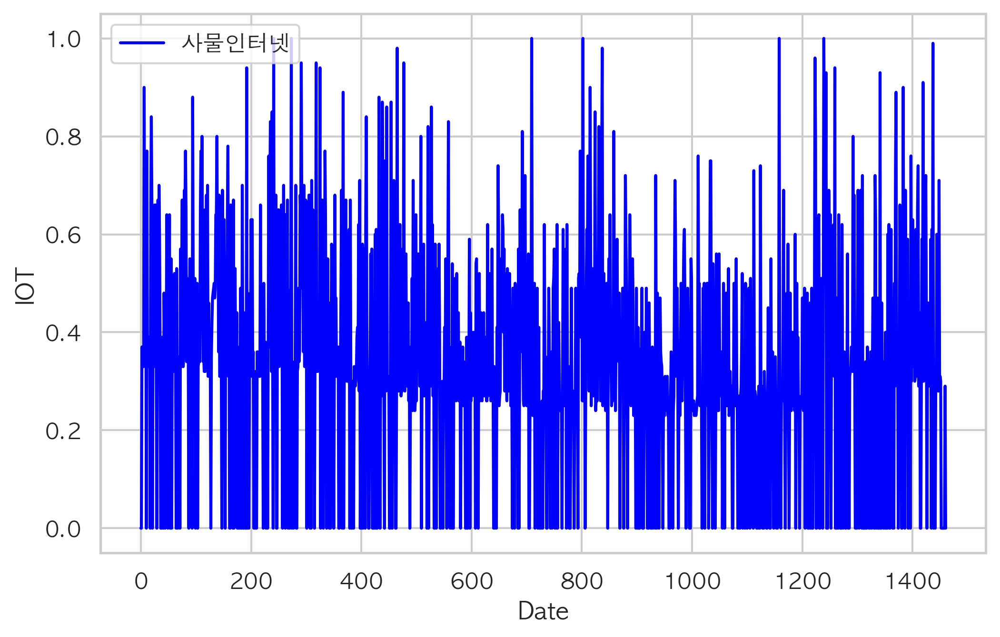

In [84]:
ax = iot_keyword_sigle_google.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('IOT') 
plt.show()

## AI

### 일별

#### 복합

- Naver

In [6]:
ai_keyword_complex = pd.read_csv("./키워드 검색량 데이터/복합키워드_일별_네이버/인공지능_복합.csv")

In [7]:
ai_keyword_complex.rename(columns={'날짜':'Date'}, inplace = True)

In [8]:
ai_keyword_complex.dropna(axis=0,how='any')

,Date,인공지능
0,2016-01-01,0.61209
1,2016-01-02,0.66938
2,2016-01-03,0.81490
3,2016-01-04,1.43181
4,2016-01-05,1.40317
...,...,...
1456,2019-12-27,1.27850
1457,2019-12-28,0.94323
1458,2019-12-29,1.21892
1459,2019-12-30,1.24756


In [65]:
scaleColumns(ai_keyword_complex,['인공지능'])

,Date,인공지능
0,2016-01-01,0.001414
1,2016-01-02,0.001989
2,2016-01-03,0.003451
3,2016-01-04,0.009650
4,2016-01-05,0.009362
...,...,...
1456,2019-12-27,0.008109
1457,2019-12-28,0.004741
1458,2019-12-29,0.007511
1459,2019-12-30,0.007798


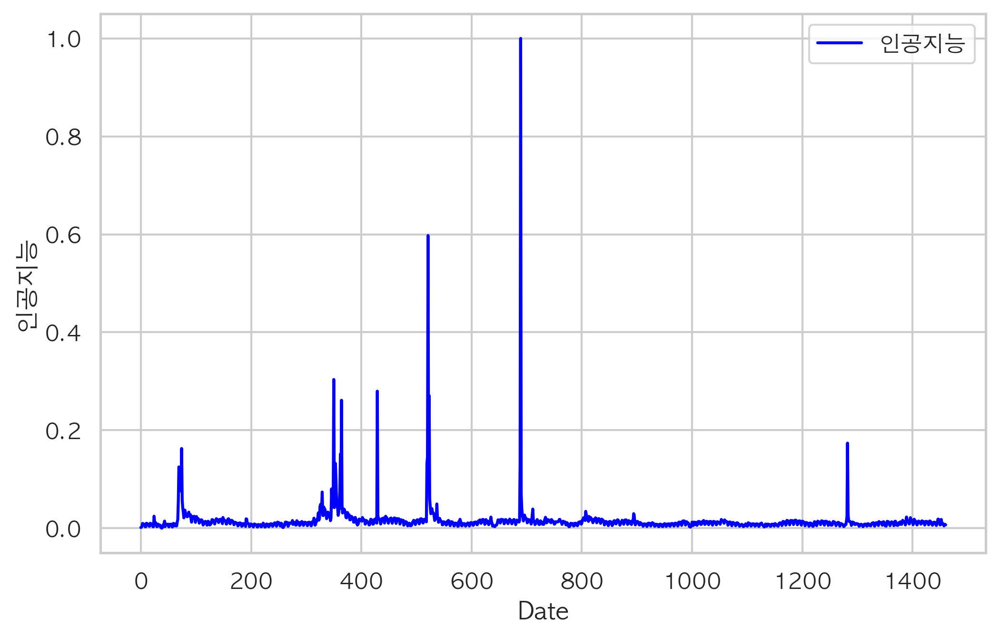

In [64]:
ax = ai_keyword_complex.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('인공지능') 
plt.show()

#### 단일

- Naver

In [10]:
ai_keyword_sigle_naver= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/인공지능_단일.csv")

In [11]:
ai_keyword_sigle_naver.dropna(axis=0,how='any')

,날짜,인공지능
0,2016-01-01,0.47462
1,2016-01-02,0.46973
2,2016-01-03,0.54068
3,2016-01-04,1.03244
4,2016-01-05,1.02999
...,...,...
1456,2019-12-27,2.34378
1457,2019-12-28,1.50462
1458,2019-12-29,2.09424
1459,2019-12-30,2.24103


In [12]:
ai_keyword_sigle_naver.rename(columns={'날짜':'Date'}, inplace = True)
ai_keyword_sigle_naver

,Date,인공지능
0,2016-01-01,0.47462
1,2016-01-02,0.46973
2,2016-01-03,0.54068
3,2016-01-04,1.03244
4,2016-01-05,1.02999
...,...,...
1456,2019-12-27,2.34378
1457,2019-12-28,1.50462
1458,2019-12-29,2.09424
1459,2019-12-30,2.24103


In [60]:
scaleColumns(ai_keyword_sigle_naver,['인공지능'])

,Date,인공지능
0,2016-01-01,0.000049
1,2016-01-02,0.000000
2,2016-01-03,0.000713
3,2016-01-04,0.005654
4,2016-01-05,0.005629
...,...,...
1456,2019-12-27,0.018829
1457,2019-12-28,0.010398
1458,2019-12-29,0.016322
1459,2019-12-30,0.017797


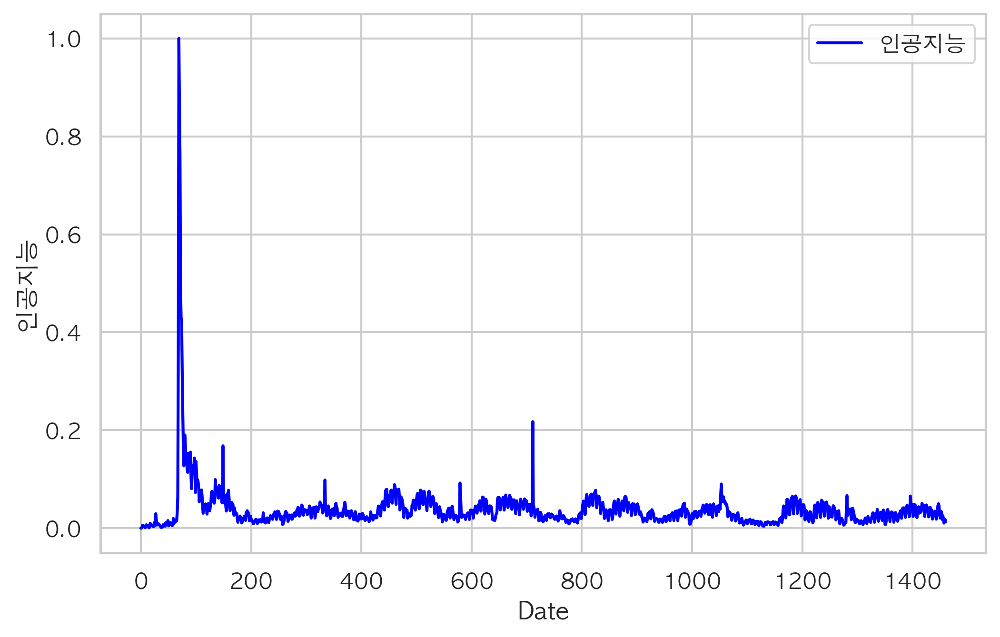

In [61]:
ax = ai_keyword_sigle_naver.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('인공지능') 
plt.show()

- Google Trend

In [31]:
ai_keyword_sigle_google= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/인공지능_Trends.csv",encoding='CP949')

In [32]:
ai_keyword_sigle_google.dropna(axis=0,how='any')

,Date,인공지능
0,2016-01-01,6
1,2016-01-02,0
2,2016-01-03,5
3,2016-01-04,9
4,2016-01-05,5
...,...,...
1456,2019-12-27,49
1457,2019-12-28,31
1458,2019-12-29,42
1459,2019-12-30,43


In [62]:
scaleColumns(ai_keyword_sigle_google,['인공지능'])

,Date,인공지능
0,2016-01-01,0.06
1,2016-01-02,0.00
2,2016-01-03,0.05
3,2016-01-04,0.09
4,2016-01-05,0.05
...,...,...
1456,2019-12-27,0.49
1457,2019-12-28,0.31
1458,2019-12-29,0.42
1459,2019-12-30,0.43


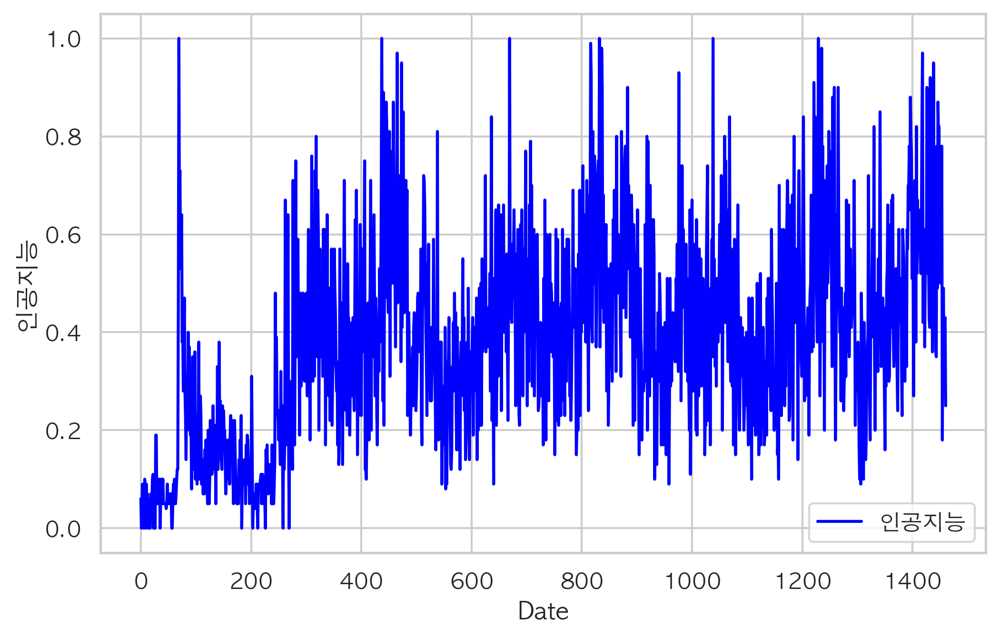

In [63]:
ax = ai_keyword_sigle_google.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('인공지능') 
plt.show()

## Cloud Computing

### 일별

#### 복합

- Naver

In [39]:
cloud_keyword_complex = pd.read_csv("./키워드 검색량 데이터/복합키워드_일별_네이버/클라우드컴퓨팅_복합.csv")

In [40]:
cloud_keyword_complex.rename(columns={'날짜':'Date'}, inplace = True)

In [41]:
cloud_keyword_complex.dropna(axis=0,how='any')

,Date,클라우드 컴퓨팅
0,2016-01-01,30.47580
1,2016-01-02,33.06645
2,2016-01-03,35.66281
3,2016-01-04,54.08326
4,2016-01-05,55.41576
...,...,...
1456,2019-12-27,36.88665
1457,2019-12-28,29.94967
1458,2019-12-29,31.20782
1459,2019-12-30,38.83106


In [42]:
scaleColumns(cloud_keyword_complex,['클라우드 컴퓨팅'])

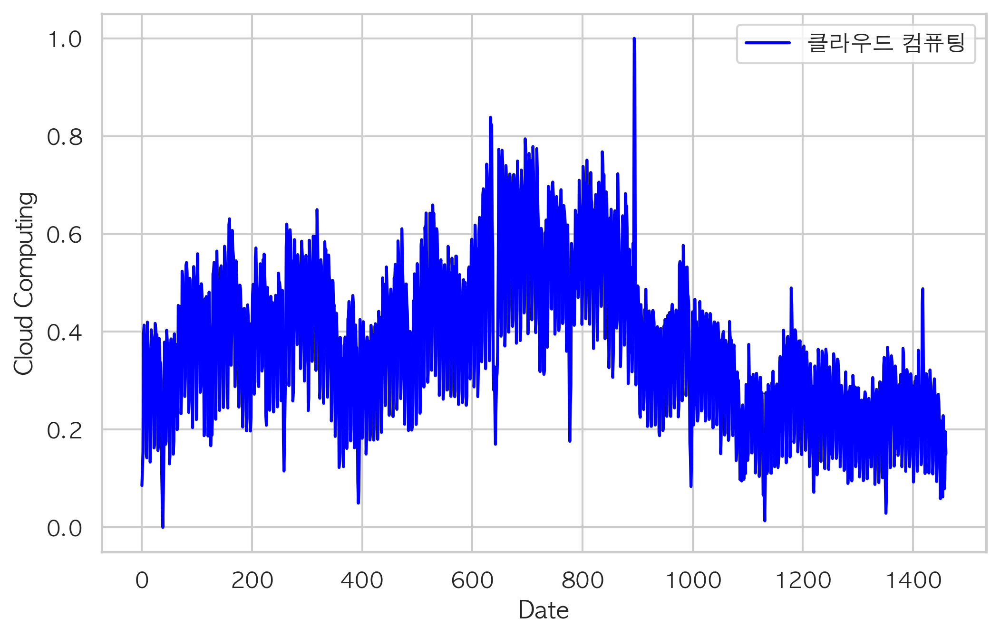

In [59]:
ax = cloud_keyword_complex.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('Cloud Computing') 
plt.show()

#### 단일

- Naver

In [45]:
cloud_keyword_sigle_naver= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/클라우드컴퓨팅_단일.csv")

In [46]:
cloud_keyword_sigle_naver.dropna(axis=0,how='any')

,날짜,클라우드 컴퓨팅
0,2016.1.1,4.17439
1,2016.1.2,5.75139
2,2016.1.3,6.86456
3,2016.1.4,13.82189
4,2016.1.5,15.49165
...,...,...
1456,2019.12.27,5.28756
1457,2019.12.28,5.56586
1458,2019.12.29,3.89610
1459,2019.12.30,9.64749


In [47]:
cloud_keyword_sigle_naver.rename(columns={'날짜':'Date'}, inplace = True)
cloud_keyword_sigle_naver

,Date,클라우드 컴퓨팅
0,2016.1.1,4.17439
1,2016.1.2,5.75139
2,2016.1.3,6.86456
3,2016.1.4,13.82189
4,2016.1.5,15.49165
...,...,...
1456,2019.12.27,5.28756
1457,2019.12.28,5.56586
1458,2019.12.29,3.89610
1459,2019.12.30,9.64749


In [51]:
scaleColumns(cloud_keyword_sigle_naver,['클라우드 컴퓨팅'])

,Date,클라우드 컴퓨팅
0,2016.1.1,0.030957
1,2016.1.2,0.046904
2,2016.1.3,0.058161
3,2016.1.4,0.128518
4,2016.1.5,0.145403
...,...,...
1456,2019.12.27,0.042214
1457,2019.12.28,0.045028
1458,2019.12.29,0.028143
1459,2019.12.30,0.086304


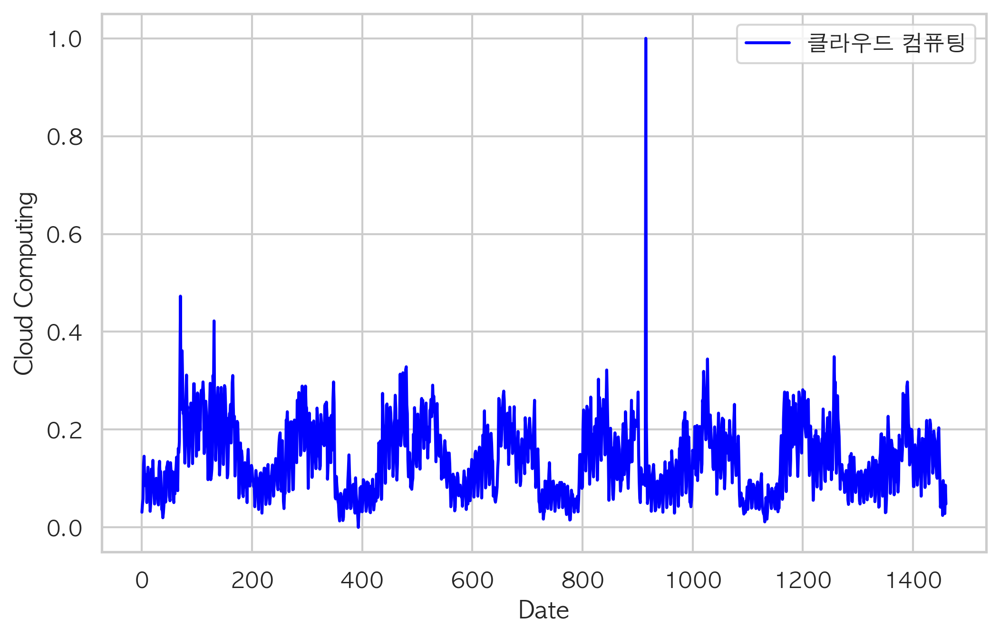

In [52]:
ax = cloud_keyword_sigle_naver.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('Cloud Computing') 
plt.show()

- Google Trend

In [54]:
cloud_keyword_sigle_google= pd.read_csv("./키워드 검색량 데이터/단일키워드_일별_네이버_구글/클라우드컴퓨팅_Trends.csv")

In [55]:
cloud_keyword_sigle_google.dropna(axis=0,how='any')

,Date,클라우드 컴퓨팅
0,2016.1.1,0
1,2016.1.2,0
2,2016.1.3,0
3,2016.1.4,0
4,2016.1.5,0
...,...,...
1456,2019.12.27,0
1457,2019.12.28,0
1458,2019.12.29,43
1459,2019.12.30,41


In [56]:
cloud_keyword_sigle_google.rename(columns={'날짜':'Date'}, inplace = True)
cloud_keyword_sigle_google

,Date,클라우드 컴퓨팅
0,2016.1.1,0
1,2016.1.2,0
2,2016.1.3,0
3,2016.1.4,0
4,2016.1.5,0
...,...,...
1456,2019.12.27,0
1457,2019.12.28,0
1458,2019.12.29,43
1459,2019.12.30,41


In [57]:
scaleColumns(cloud_keyword_sigle_google,['클라우드 컴퓨팅'])

,Date,클라우드 컴퓨팅
0,2016.1.1,0.00
1,2016.1.2,0.00
2,2016.1.3,0.00
3,2016.1.4,0.00
4,2016.1.5,0.00
...,...,...
1456,2019.12.27,0.00
1457,2019.12.28,0.00
1458,2019.12.29,0.43
1459,2019.12.30,0.41


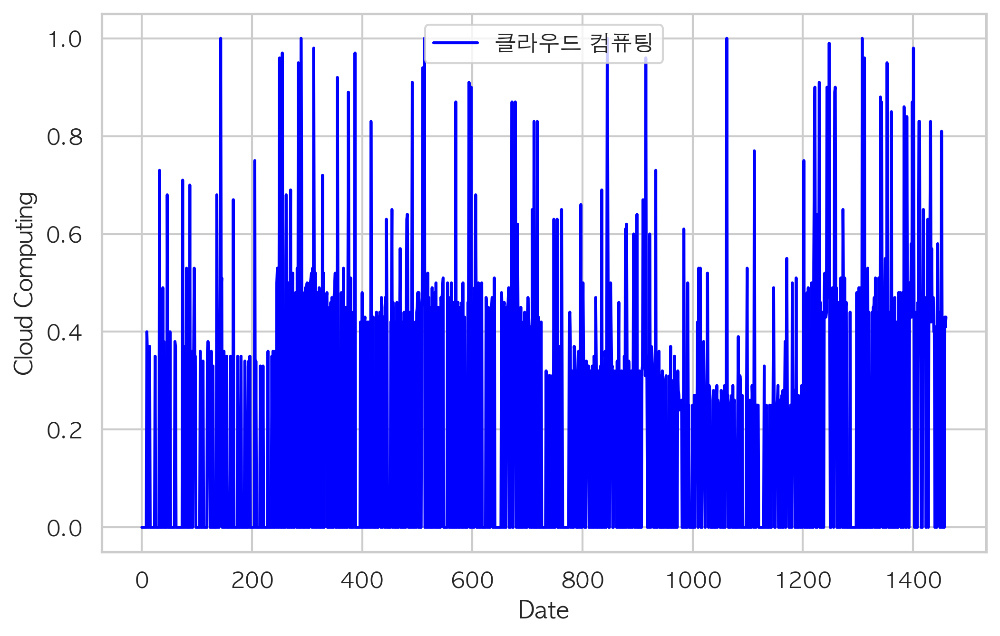

In [58]:
ax = cloud_keyword_sigle_google.plot(color='blue') 
ax.set_xlabel('Date') 
ax.set_ylabel('Cloud Computing') 
plt.show()

# 회사: 

## 4차산업

In [191]:
industry_company_list = pd.read_csv("./주가 데이터/일별/4차산업수혜주_종목코드.csv")["기업명"]
industry_company_list.head()

0      SGA솔루션즈
1    SBI인베스트먼트
2        셀바스AI
3         알서포트
4         로보스타
Name: 기업명, dtype: object

## IOT

In [193]:
iot_company_list = pd.read_csv("./주가 데이터/일별/사물인터넷_종목코드.csv")["기업명"]
iot_company_list.head()

0    SGA솔루션즈
1     다산네트웍스
2        링네트
3        SGA
4       유비쿼스
Name: 기업명, dtype: object

## AI

In [17]:
ai_company_list = pd.read_csv("./주가 데이터/일별/지능형로봇_인공지능(AI)_종목코드.csv")["기업명"]
ai_company_list.head()

0     셀바스AI
1    신테카바이오
2    데이타솔루션
3      줌인터넷
4      로보스타
Name: 기업명, dtype: object

## 클라우드컴퓨팅

In [195]:
cloud_company_list = pd.read_csv("./주가 데이터/일별/클라우드컴퓨팅_종목코드.csv")["기업명"]
cloud_company_list.head()

0    케이아이엔엑스
1      파이오링크
2     한글과컴퓨터
3    SGA솔루션즈
4     한일네트웍스
Name: 기업명, dtype: object

# granger causality test결과:

## 4차산업

In [472]:
# 폴더에 있는 모든 주식데이터 파일를 불어오기

path = r'./주가 데이터/일별/4차산업수혜주'
file = sorted(glob.glob(os.path.join(path, "*.csv")))


# 주식데이터 처리

for i in range(len(file)):
    n = file[i]
    f = pd.read_csv(n)
    for x in range(0,len(f['Date'])):
        f['Date'][x] = f['Date'][x][:10]
    f = f.dropna(axis=0, how='any')[['Date','Close']]
    f_scale = scaleColumns(f,['Close'])
    df_complex = pd.merge(industry_keyword_complex,f_scale,on="Date", how="inner")
    df_sigle_google = pd.merge(industry_keyword_sigle_google,f_scale[['Date','Close']],on="Date", how="inner")
    df_sigle_naver = pd.merge(industry_keyword_sigle_naver,f_scale[['Date','Close']],on="Date", how="inner")
    # 회사명 출력
    begin=n.rfind('/')
    end=n.rfind('.')
    print("회사:",n[begin+1:end])
    # granger causality tests 결과 출력
    print("1.복합키워드_일별_네이버의 granger causality test결과:")
    print('4차산업 -> Close')
    print(grangercausalitytests(df_complex[['4차산업', 'Close']], [2]))
    print('Close -> 4차산업')
    print(grangercausalitytests(df_complex[['Close','4차산업']], [2]))
    print("2.단일키워드_일별_구글의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_google[['4차산업', 'Close']], [2]))
    print("3.단일키워드_일별_네이버의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_naver[['4차산업', 'Close']], [2]))

회사: DSC인베스트먼트
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.3860 , p=0.0000  , df_denom=734, df_num=2
ssr based chi2 test:   chi2=22.9272 , p=0.0000  , df=2
likelihood ratio test: chi2=22.5787 , p=0.0000  , df=2
parameter F test:         F=11.3860 , p=0.0000  , df_denom=734, df_num=2
{2: ({'ssr_ftest': (11.386027427323913, 1.3497931116214143e-05, 734.0, 2), 'ssr_chi2test': (22.927177844120905, 1.0505738544340163e-05, 2), 'lrtest': (22.578713585018704, 1.2505315144043338e-05, 2), 'params_ftest': (11.386027427323807, 1.3497931116215895e-05, 734.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9bd29d0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab3642050>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7242  , p=0.1790  , df_

회사: NAVER
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.4036  , p=0.0001  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=18.9039 , p=0.0001  , df=2
likelihood ratio test: chi2=18.7233 , p=0.0001  , df=2
parameter F test:         F=9.4036  , p=0.0001  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (9.403562344962523, 9.017621913010348e-05, 972.0, 2), 'ssr_chi2test': (18.90386915849462, 7.85374812285894e-05, 2), 'lrtest': (18.7233100432004, 8.595771904639928e-05, 2), 'params_ftest': (9.403562344962724, 9.017621913008971e-05, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2c52610>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab364af50>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0956  , p=0.1236  , df_denom=972, df_

회사: SK텔레콤
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.4462  , p=0.0006  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=14.9691 , p=0.0006  , df=2
likelihood ratio test: chi2=14.8555 , p=0.0006  , df=2
parameter F test:         F=7.4462  , p=0.0006  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (7.446226876407315, 0.0006175445114691716, 972.0, 2), 'ssr_chi2test': (14.969061025205653, 0.000561706822350245, 2), 'lrtest': (14.855545148782767, 0.0005945102655829315, 2), 'params_ftest': (7.446226876407518, 0.0006175445114690466, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bb4a10>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bb4b90>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4276  , p=0.2404  , df_denom=972, 

회사: 대성엘텍
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.8888 , p=0.0000  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=33.9514 , p=0.0000  , df=2
likelihood ratio test: chi2=33.3748 , p=0.0000  , df=2
parameter F test:         F=16.8888 , p=0.0000  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (16.88881906884119, 6.163744647649056e-08, 972.0, 2), 'ssr_chi2test': (33.95139142028363, 4.2417886589327104e-08, 2), 'lrtest': (33.37479493810588, 5.659204161948947e-08, 2), 'params_ftest': (16.888819068840405, 6.163744647653523e-08, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bb7cd0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bb7650>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2741  , p=0.2801  , df_denom=972, 

회사: 디지탈옵틱
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1111  , p=0.0450  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=6.2542  , p=0.0438  , df=2
likelihood ratio test: chi2=6.2343  , p=0.0443  , df=2
parameter F test:         F=3.1111  , p=0.0450  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (3.1111005881887777, 0.044995845443007436, 972.0, 2), 'ssr_chi2test': (6.254208384074971, 0.04384457907745157, 2), 'lrtest': (6.234275430600974, 0.04428373986257335, 2), 'params_ftest': (3.111100588188001, 0.044995845443044066, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4757cd0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4757e50>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0724  , p=0.9301  , df_denom=972, df_num

회사: 모비스
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0149  , p=0.3629  , df_denom=802, df_num=2
ssr based chi2 test:   chi2=2.0425  , p=0.3601  , df=2
likelihood ratio test: chi2=2.0399  , p=0.3606  , df=2
parameter F test:         F=1.0149  , p=0.3629  , df_denom=802, df_num=2
{2: ({'ssr_ftest': (1.0149186434396602, 0.3628969234236718, 802.0, 2), 'ssr_chi2test': (2.042492132807496, 0.36014589476107, 2), 'lrtest': (2.039911743488119, 0.36061085294998824, 2), 'params_ftest': (1.014918643439706, 0.36289692342366786, 802.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab476e810>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab476ed90>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5349  , p=0.2161  , df_denom=802, df_num=2
ssr b

회사: 삼익THK
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=21.2396 , p=0.0000  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=42.6977 , p=0.0000  , df=2
likelihood ratio test: chi2=41.7911 , p=0.0000  , df=2
parameter F test:         F=21.2396 , p=0.0000  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (21.23961458641838, 9.367618843602833e-10, 972.0, 2), 'ssr_chi2test': (42.69774372619497, 5.349371443679096e-10, 2), 'lrtest': (41.79105838627402, 8.417574619366864e-10, 2), 'params_ftest': (21.23961458641864, 9.36761884360067e-10, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bd89d0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bd8790>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8021  , p=0.4487  , df_denom=972, df

회사: 알서포트
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0271  , p=0.9733  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=0.0544  , p=0.9732  , df=2
likelihood ratio test: chi2=0.0544  , p=0.9732  , df=2
parameter F test:         F=0.0271  , p=0.9733  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (0.02707234156984026, 0.973291563449014, 972.0, 2), 'ssr_chi2test': (0.05442320517229205, 0.9731552975582822, 2), 'lrtest': (0.05442168942226999, 0.9731560350886437, 2), 'params_ftest': (0.027072341569783838, 0.9732915634490666, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4757610>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4757e50>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1794  , p=0.8358  , df_denom=972, df_num

회사: 에이디칩스
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=22.7956 , p=0.0000  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=45.8257 , p=0.0000  , df=2
likelihood ratio test: chi2=44.7834 , p=0.0000  , df=2
parameter F test:         F=22.7956 , p=0.0000  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (22.795569688731334, 2.1143302645846197e-10, 972.0, 2), 'ssr_chi2test': (45.8256616993632, 1.1196544156733498e-10, 2), 'lrtest': (44.7834140582936, 1.8854073546085773e-10, 2), 'params_ftest': (22.795569688731973, 2.1143302645833125e-10, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab475a290>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab475ae50>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3169  , p=0.7285  , df_denom=97

회사: 우리기술투자
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5102  , p=0.0818  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=5.0461  , p=0.0802  , df=2
likelihood ratio test: chi2=5.0331  , p=0.0807  , df=2
parameter F test:         F=2.5102  , p=0.0818  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (2.5101536400677213, 0.08178237715819564, 972.0, 2), 'ssr_chi2test': (5.046131906062066, 0.08021329915104934, 2), 'lrtest': (5.033145157040963, 0.08073584886259236, 2), 'params_ftest': (2.510153640067694, 0.08178237715819564, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2bb2c10>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab350fb90>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8511  , p=0.4273  , df_denom=972, df_num=

회사: 지엔씨에너지
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3551  , p=0.0018  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=12.7755 , p=0.0017  , df=2
likelihood ratio test: chi2=12.6927 , p=0.0018  , df=2
parameter F test:         F=6.3551  , p=0.0018  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (6.35508350720736, 0.0018109717321252593, 972.0, 2), 'ssr_chi2test': (12.775548531978583, 0.0016819957133310567, 2), 'lrtest': (12.692741152010967, 0.0017530983408651265, 2), 'params_ftest': (6.355083507207315, 0.0018109717321253605, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab475a990>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab475ae50>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1461  , p=0.3183  , df_denom=972,

회사: 한컴MDS
1.복합키워드_일별_네이버의 granger causality test결과:
4차산업 -> Close

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9859  , p=0.0010  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=14.0437 , p=0.0009  , df=2
likelihood ratio test: chi2=13.9437 , p=0.0009  , df=2
parameter F test:         F=6.9859  , p=0.0010  , df_denom=972, df_num=2
{2: ({'ssr_ftest': (6.985923894959315, 0.0009719648375416548, 972.0, 2), 'ssr_chi2test': (14.043719434928501, 0.000892164774681778, 2), 'lrtest': (13.94374184804019, 0.0009378965301790459, 2), 'params_ftest': (6.985923894958842, 0.000971964837542108, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4778c10>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4778910>, array([[0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.]])])}
Close -> 4차산업

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7246  , p=0.4848  , df_denom=972, df

## IOT

In [473]:
# 폴더에 있는 모든 주식데이터 파일를 불어오기

path = r'./주가 데이터/일별/사물인터넷'
file = sorted(glob.glob(os.path.join(path, "*.csv")))

# 주식데이터 처리

for i in range(len(file)):
    n = file[i]
    f = pd.read_csv(n)
    f = f.dropna(axis=0, how='any')[['Date','Close']]
    f_scale = scaleColumns(f,['Close'])
    df_complex = pd.merge(iot_keyword_complex,f_scale,on="Date", how="inner")
    df_sigle_google = pd.merge(iot_keyword_sigle_google,f_scale[['Date','Close']],on="Date", how="inner")
    df_sigle_naver = pd.merge(iot_keyword_sigle_naver,f_scale[['Date','Close']],on="Date", how="inner")
    
    # 회사명 출력
    begin=n.rfind('/')
    end=n.rfind('.')
    print("회사:",n[begin+1:end])
    # granger causality tests 결과 출력
    print("1.복합키워드_일별_네이버의 granger causality test결과:")
    print(grangercausalitytests(df_complex[['사물인터넷', 'Close']], maxlag=2))
    print("2.단일키워드_일별_구글의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_google[['사물인터넷', 'Close']], maxlag=2))
    print("3.단일키워드_일별_네이버의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_naver[['사물인터넷', 'Close']], maxlag=2))

회사: LG유플러스
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.0807  , p=0.0026  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=9.1086  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0665  , p=0.0026  , df=1
parameter F test:         F=9.0807  , p=0.0026  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4161  , p=0.0332  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=6.8672  , p=0.0323  , df=2
likelihood ratio test: chi2=6.8432  , p=0.0327  , df=2
parameter F test:         F=3.4161  , p=0.0332  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (9.080702592545663, 0.0026499729106504704, 975.0, 1), 'ssr_chi2test': (9.108643215907342, 0.002544045040015932, 1), 'lrtest': (9.066487895730916, 0.0026033661123112295, 1), 'params_ftest': (9.080702592545828, 0.002649972910650301, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faa

ssr based F test:         F=8.8149  , p=0.0031  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=8.8421  , p=0.0029  , df=1
likelihood ratio test: chi2=8.8023  , p=0.0030  , df=1
parameter F test:         F=8.8149  , p=0.0031  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2625  , p=0.0144  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=8.5689  , p=0.0138  , df=2
likelihood ratio test: chi2=8.5316  , p=0.0140  , df=2
parameter F test:         F=4.2625  , p=0.0144  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (8.814931746241069, 0.003060866399371534, 975.0, 1), 'ssr_chi2test': (8.84205461315258, 0.0029436756865970116, 1), 'lrtest': (8.802323592775792, 0.003008471450727512, 1), 'params_ftest': (8.814931746241012, 0.003060866399371749, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab47789d0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab475eb90>, a

회사: 드림어스컴퍼니
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4998  , p=0.0036  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=8.5260  , p=0.0035  , df=1
likelihood ratio test: chi2=8.4890  , p=0.0036  , df=1
parameter F test:         F=8.4998  , p=0.0036  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7247  , p=0.0661  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=5.4775  , p=0.0647  , df=2
likelihood ratio test: chi2=5.4622  , p=0.0651  , df=2
parameter F test:         F=2.7247  , p=0.0661  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (8.499841416340132, 0.00363307482403667, 975.0, 1), 'ssr_chi2test': (8.525994774544255, 0.003501093308420039, 1), 'lrtest': (8.489045464149513, 0.0035729121298067675, 1), 'params_ftest': (8.49984141634058, 0.0036330748240357763, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab

parameter F test:         F=2.1201  , p=0.1206  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (4.846879540600746, 0.02792981810085191, 975.0, 1), 'ssr_chi2test': (4.861793016110287, 0.027457786130265886, 1), 'lrtest': (4.849748544423619, 0.02765016284975163, 1), 'params_ftest': (4.846879540600674, 0.0279298181008545, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab47b6350>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4786390>, array([[0., 1., 0.]])]), 2: ({'ssr_ftest': (2.1201080881513796, 0.12057333123506749, 972.0, 2), 'ssr_chi2test': (4.262027987909255, 0.11871685462750148, 2), 'lrtest': (4.252758680364423, 0.11926834313763736, 2), 'params_ftest': (2.1201080881513943, 0.12057333123506749, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab350f650>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab350f450>, array([[0., 0., 1., 0., 0.]

likelihood ratio test: chi2=12.3314 , p=0.0021  , df=2
parameter F test:         F=6.1730  , p=0.0022  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (23.225613303497894, 1.6700233203997004e-06, 975.0, 1), 'ssr_chi2test': (23.29707672904712, 1.3881082018876665e-06, 1), 'lrtest': (23.023924604665126, 1.5999786425357684e-06, 1), 'params_ftest': (23.225613303498513, 1.6700233203990211e-06, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4780510>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab47804d0>, array([[0., 1., 0.]])]), 2: ({'ssr_ftest': (6.1730057172774995, 0.002167608373162648, 972.0, 2), 'ssr_chi2test': (12.409519723827401, 0.0020197937799508814, 2), 'lrtest': (12.331370044906407, 0.002100279133328713, 2), 'params_ftest': (6.173005717277554, 0.002167608373162513, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab47807d0>, <statsmodels.regression.linear_model.Reg

ssr based F test:         F=2.9357  , p=0.0536  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=5.9017  , p=0.0523  , df=2
likelihood ratio test: chi2=5.8839  , p=0.0528  , df=2
parameter F test:         F=2.9357  , p=0.0536  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (8.639278675804574, 0.0033675025840947397, 975.0, 1), 'ssr_chi2test': (8.665861071730127, 0.0032422676024176046, 1), 'lrtest': (8.627693146554066, 0.003310905831943818, 1), 'params_ftest': (8.639278675804514, 0.0033675025840948533, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4780650>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4780550>, array([[0., 1., 0.]])]), 2: ({'ssr_ftest': (2.935724933705788, 0.05356316165519968, 972.0, 2), 'ssr_chi2test': (5.9016527988283025, 0.052296470313512054, 2), 'lrtest': (5.8838995348974095, 0.05276275328302224, 2), 'params_ftest': (2.9357249337058997, 0.053563161655195465, 972.0, 2.0)}, [<statsmodels


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.4993  , p=0.0021  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=9.5285  , p=0.0020  , df=1
likelihood ratio test: chi2=9.4824  , p=0.0021  , df=1
parameter F test:         F=9.4993  , p=0.0021  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1697  , p=0.0424  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=6.3721  , p=0.0413  , df=2
likelihood ratio test: chi2=6.3514  , p=0.0418  , df=2
parameter F test:         F=3.1697  , p=0.0424  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (9.499299800446614, 0.0021132412700867417, 975.0, 1), 'ssr_chi2test': (9.528528415217218, 0.0020230226837463575, 1), 'lrtest': (9.482410108696513, 0.002074512599115574, 1), 'params_ftest': (9.49929980044698, 0.0021132412700862143, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab364a190>, <statsmodels.regression.linear_model.Regre

parameter F test:         F=4.2332  , p=0.0399  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5505  , p=0.0786  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=5.1272  , p=0.0770  , df=2
likelihood ratio test: chi2=5.1138  , p=0.0775  , df=2
parameter F test:         F=2.5505  , p=0.0786  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (4.233156225302309, 0.039907136458222185, 975.0, 1), 'ssr_chi2test': (4.2461813213801625, 0.03933869240495785, 1), 'lrtest': (4.236990095520014, 0.03955222853757058, 1), 'params_ftest': (4.233156225302164, 0.03990713645822265, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9bb6e50>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9bb6590>, array([[0., 1., 0.]])]), 2: ({'ssr_ftest': (2.550479533589221, 0.0785664492903002, 972.0, 2), 'ssr_chi2test': (5.127198568552816, 0.07702699884186145, 2), 'lrtest': (5.113791939143994, 0

parameter F test:         F=8.6205  , p=0.0002  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (17.20136229952581, 3.6549425537258254e-05, 975.0, 1), 'ssr_chi2test': (17.25428956813974, 3.269585466768246e-05, 1), 'lrtest': (17.103852635857038, 3.539044123126907e-05, 1), 'params_ftest': (17.20136229952569, 3.6549425537259684e-05, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4860c10>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9ade850>, array([[0., 1., 0.]])]), 2: ({'ssr_ftest': (8.620511163673548, 0.00019452507968802826, 972.0, 2), 'ssr_chi2test': (17.329710713804644, 0.0001725445046319306, 2), 'lrtest': (17.17780992027474, 0.00018615982851560565, 2), 'params_ftest': (8.62051116367343, 0.00019452507968805005, 972.0, 2.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9adeed0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faac9adeb50>, array([

## AI

In [102]:
# Check for stationarity

from statsmodels.tsa.stattools import adfuller
def adf_test(ts, signif=0.05):
    dftest = adfuller(ts, autolag='AIC')
    adf = pd.Series(dftest[0:4], index=['Test Statistic','p-value','# Lags','# Observations'])
    for key,value in dftest[4].items():
       adf['Critical Value (%s)'%key] = value
    print (adf)
    
    p = adf['p-value']
    if p <= signif:
        print(f" Series is Stationary")
    else:
        print(f" Series is Non-Stationary")

회사: LG전자


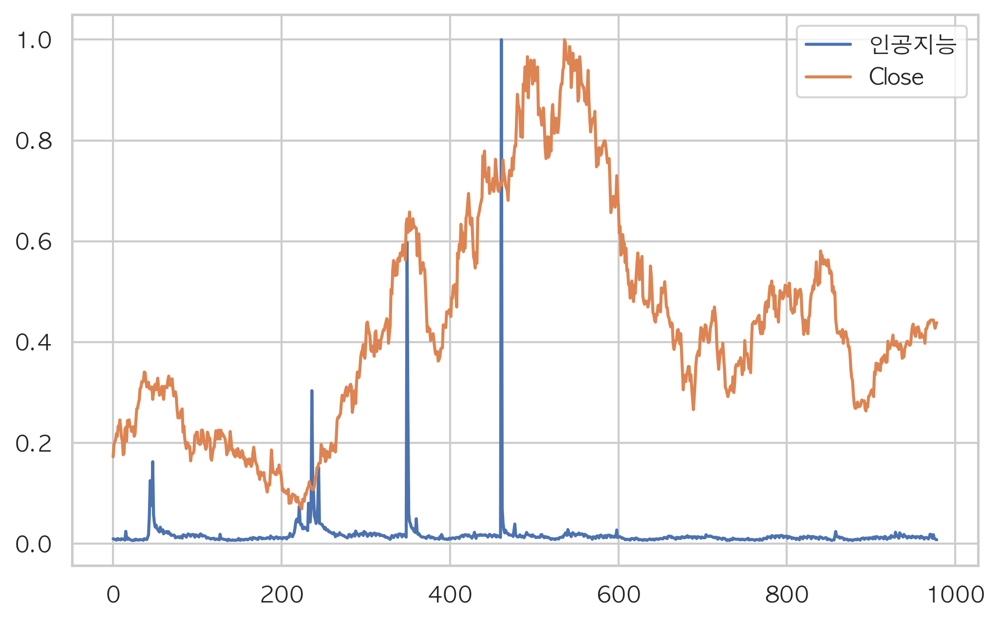

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.013076
Close  0.013076  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.1179
Close_y  0.0451   1.0000
------------------------------
Test Statistic           -1.509987
p-value                   0.528565
# Lags                    4.000000
# Observations          954.000000
Critical Value (1%)      -3.437223
Critical Value (5%)      -2.864574
Critical Value (10%)     -2.568386
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.590184e+01
p-value                 8.311882e-29
# Lags                  3.000000e+00
# Observations          9.540000e+02
Critical Value (1%)    -3.437223e+00
Critical Value (5%)    -2.864574e+00
Critical Value (10%)   -2.568386e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.022232583405068885
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0093 - mse: 0.0093 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 5.8471e-04 - val_mse: 5.8471e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 8.8111e-04 - val_mse: 8.8111e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 9.7245e-04 - val_mse: 9.7245e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 4.7136e-04 - val_mse: 4.7136e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 5.1409e-04 - val_mse: 5.1409e-0

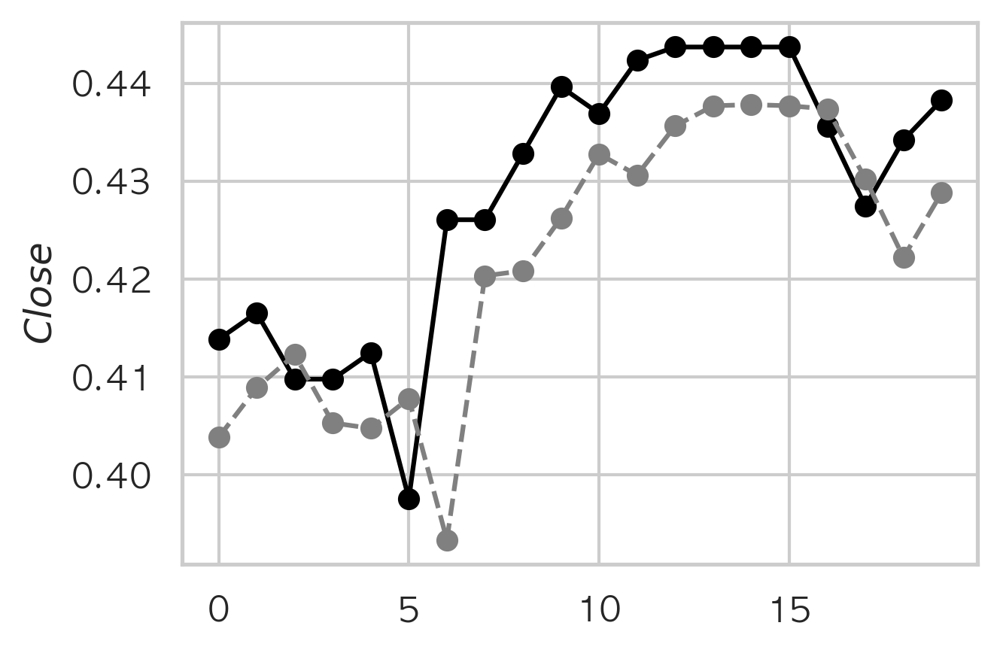

LSTM_RMSE: 0.010830776107373931
회사: TPC


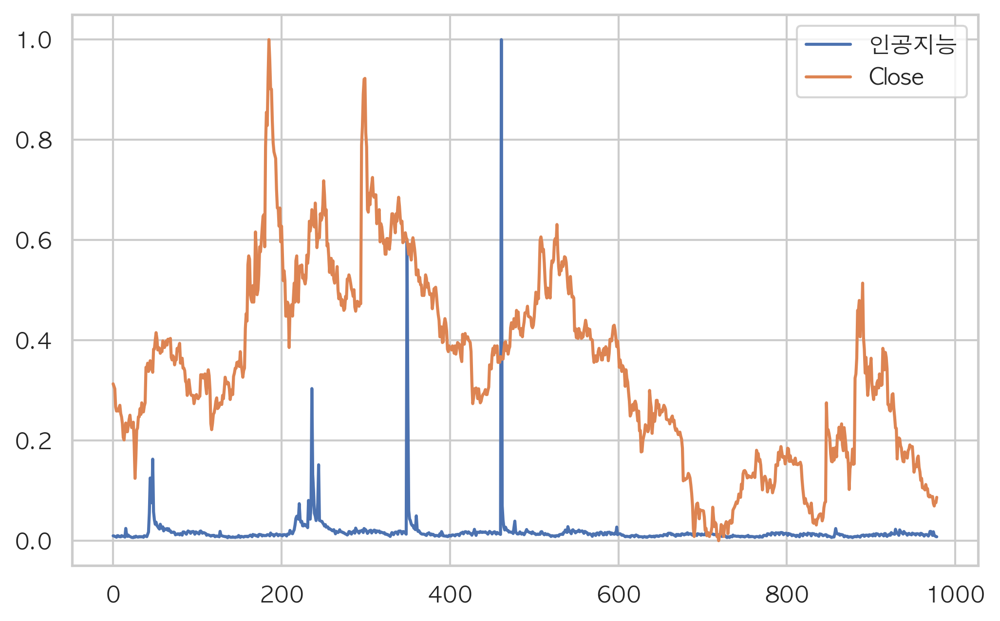

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.129947
Close  0.129947  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0012
Close_y  0.7648   1.0000
------------------------------
Test Statistic           -2.019481
p-value                   0.278097
# Lags                    6.000000
# Observations          952.000000
Critical Value (1%)      -3.437238
Critical Value (5%)      -2.864581
Critical Value (10%)     -2.568389
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.407186e+01
p-value                 2.930720e-26
# Lags                  5.000000e+00
# Observations          9.520000e+02
Critical Value (1%)    -3.437238e+00
Critical Value (5%)    -2.864581e+00
Critical Value (10%)   -2.568389e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.04306542415620997
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 8/100
763/763 [==================

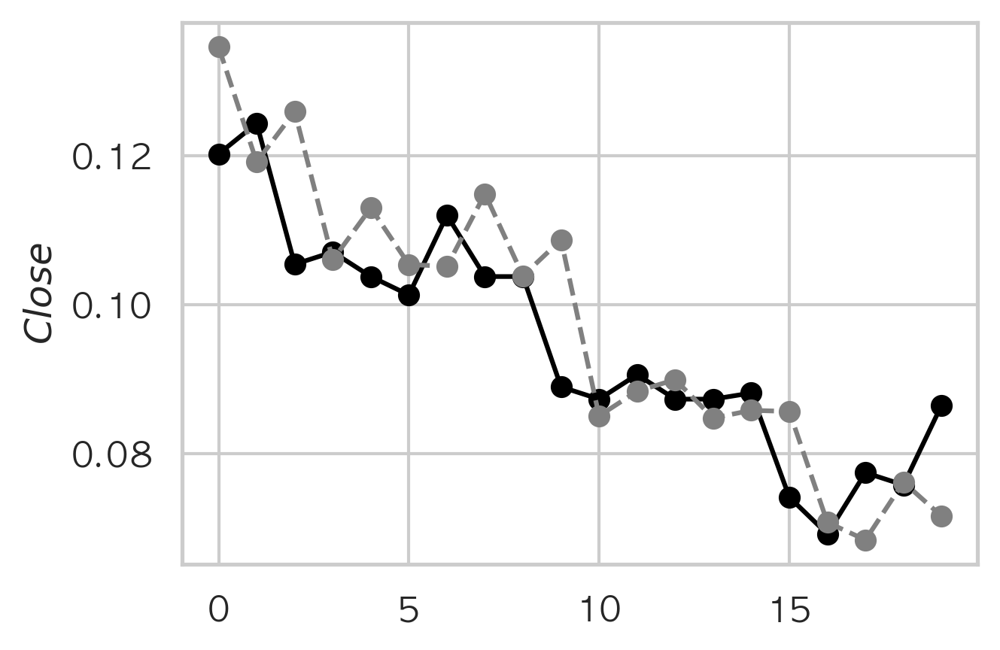

LSTM_RMSE: 0.009453761703079827
회사: 가온미디어


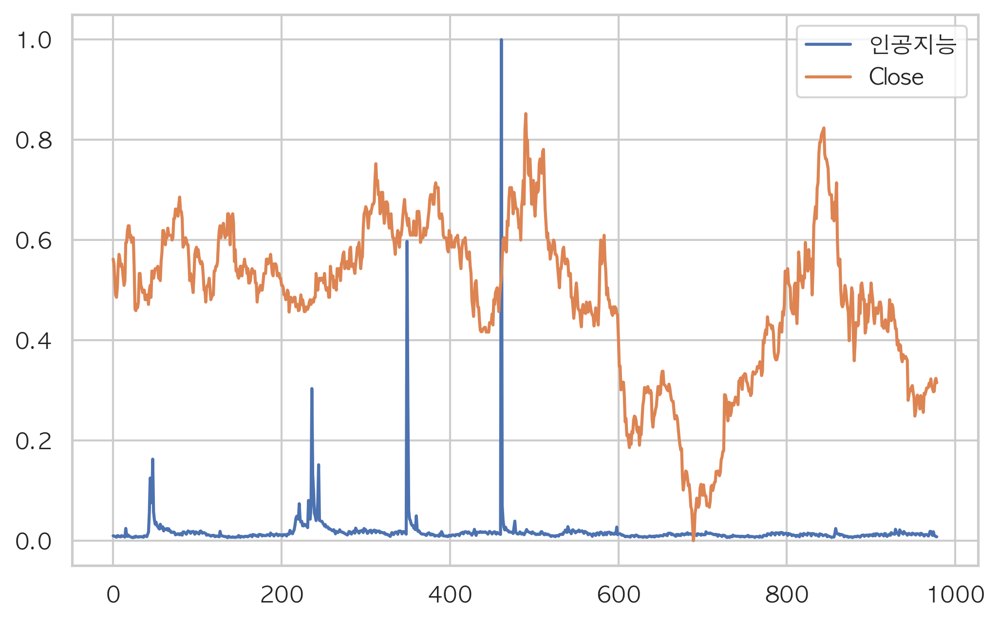

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.061927
Close  0.061927  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.1446
Close_y  0.0789   1.0000
------------------------------
Test Statistic           -2.073103
p-value                   0.255467
# Lags                    2.000000
# Observations          956.000000
Critical Value (1%)      -3.437209
Critical Value (5%)      -2.864568
Critical Value (10%)     -2.568382
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -23.022524
p-value                   0.000000
# Lags                    1.000000
# Observations          956.000000
Critical Value (1%)      -3.437209
Critical Value (5%)      -2.864568
Critical Value (10%)     -2.568382
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.04392800552164825
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 8.7229e-04 - mse: 8.7229e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 8.3830e-04 - mse: 8.3830e-04 - val_loss: 9.2670e-04 - val_mse: 9.2670e-04
Epoch 8/100
763

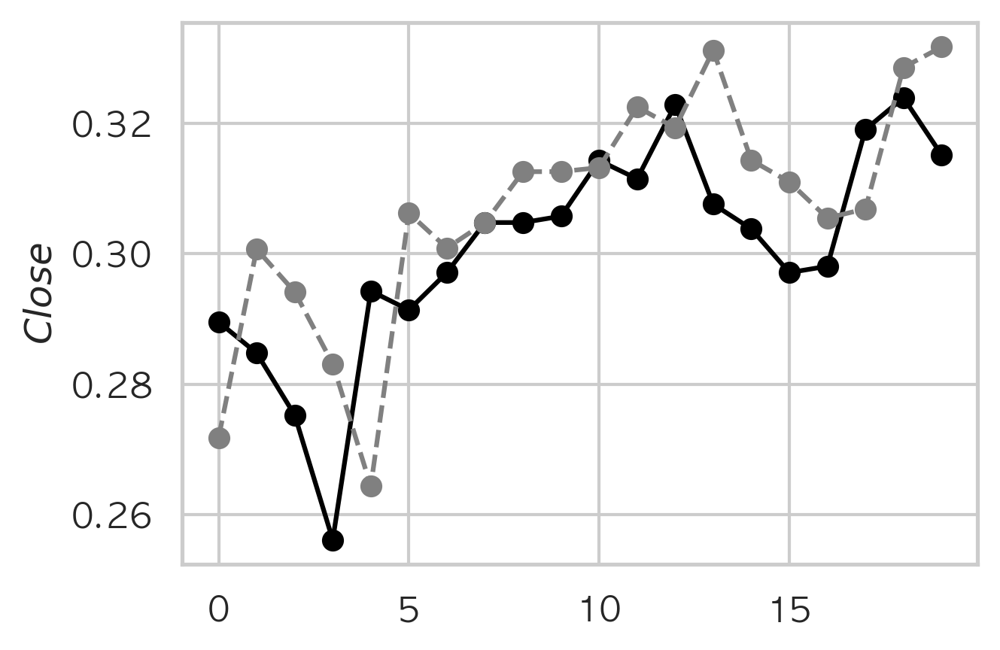

LSTM_RMSE: 0.014799280176850345
회사: 경남제약헬스케어


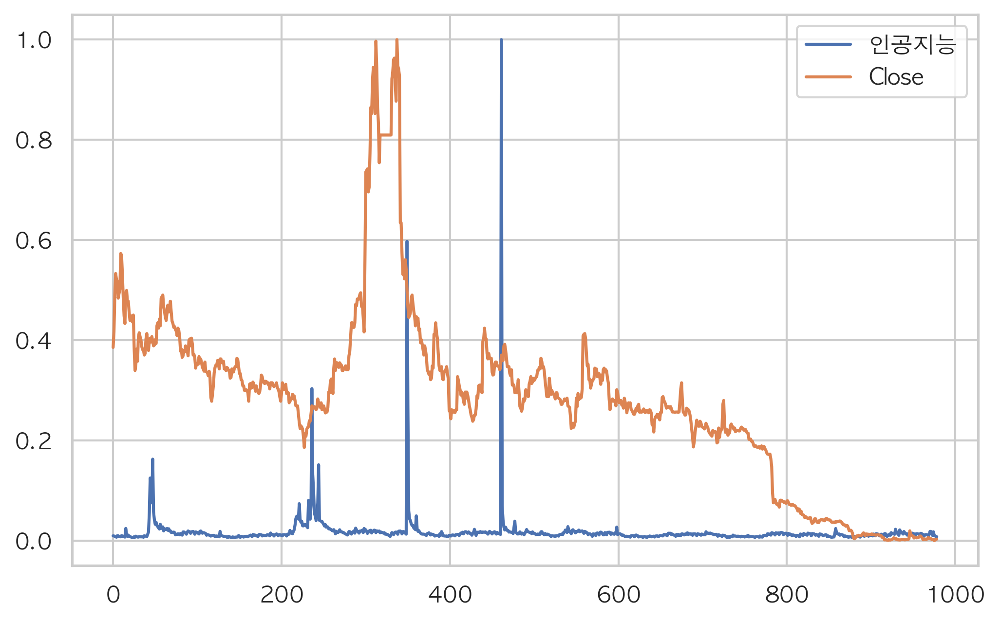

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.075302
Close  0.075302  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000      0.0
Close_y  0.2871      1.0
------------------------------
Test Statistic           -1.536475
p-value                   0.515397
# Lags                   15.000000
# Observations          943.000000
Critical Value (1%)      -3.437304
Critical Value (5%)      -2.864610
Critical Value (10%)     -2.568405
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -8.959139e+00
p-value                 8.315880e-15
# Lags                  1.400000e+01
# Observations          9.430000e+02
Critical Value (1%)    -3.437304e+00
Critical Value (5%)    -2.864610e+00
Critical Value (10%)   -2.568405e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.002759405089563579
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 9.8465e-04 - mse: 9.8465e-04 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 8/100
763/763 [=========

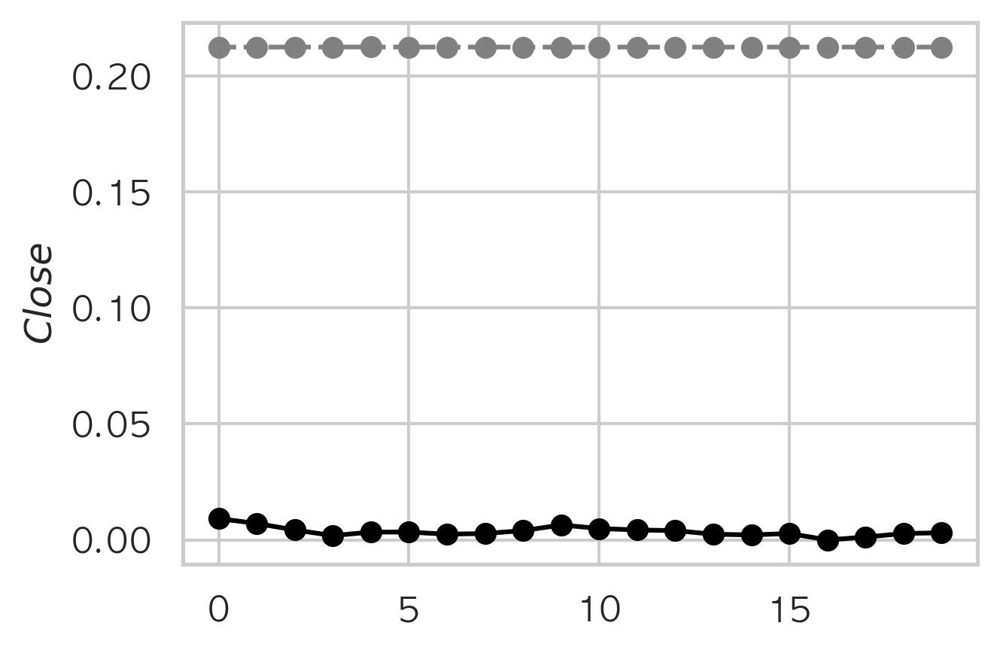

LSTM_RMSE: 0.20879886307483056
회사: 고영


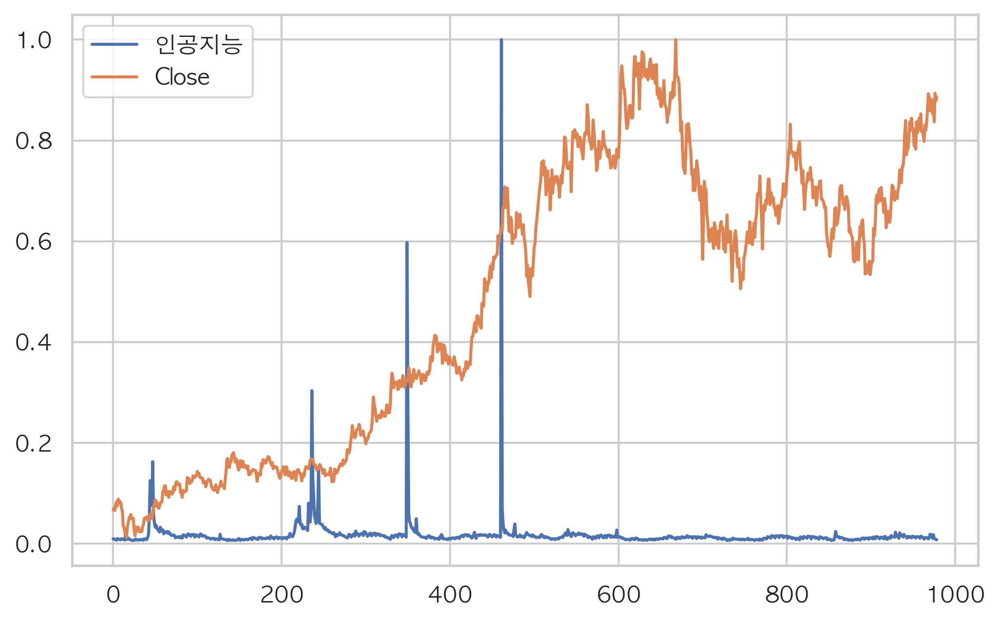

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.083142
Close -0.083142  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y    1.000   0.0325
Close_y   0.082   1.0000
------------------------------
Test Statistic           -1.116954
p-value                   0.708264
# Lags                    2.000000
# Observations          956.000000
Critical Value (1%)      -3.437209
Critical Value (5%)      -2.864568
Critical Value (10%)     -2.568382
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -24.890515
p-value                   0.000000
# Lags                    1.000000
# Observations          956.000000
Critical Value (1%)      -3.437209
Critical Value (5%)      -2.864568
Critical Value (10%)     -2.568382
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.03411413301111983
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 8.9714e-04 - val_mse: 8.9714e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 9.7571e-04 - val_mse: 9.7571e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 7.5223e-04 - val_mse: 7.5223e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 8.7634e-04 - mse: 8.7634e-04 - val_loss: 7.2079e-04 - val_mse: 7.2079e-04

763/763 [==============================] - 1s 2ms/step - loss: 6.1428e-04 - mse: 6.1428e-04 - val_loss: 8.1268e-04 - val_mse: 8.1268e-04
Epoch 57/100
20/20 [==============================] - 0s 759us/step - loss: 8.2552e-04 - mse: 8.2552e-04
loss :  0.0008255233988165855
mse :  0.0008255233988165855


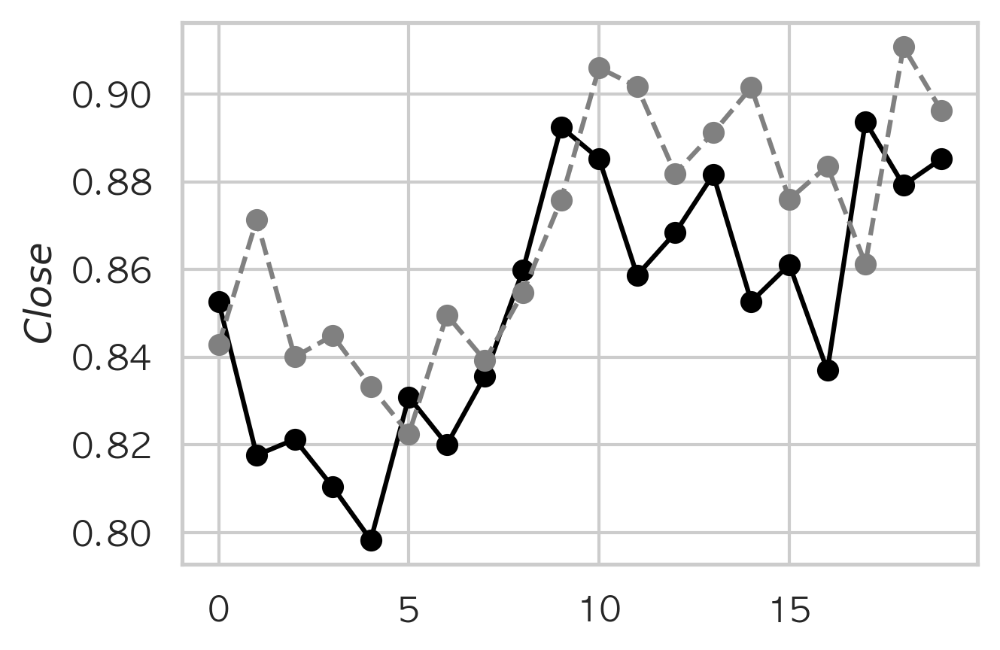

LSTM_RMSE: 0.028731934351415196
회사: 네패스


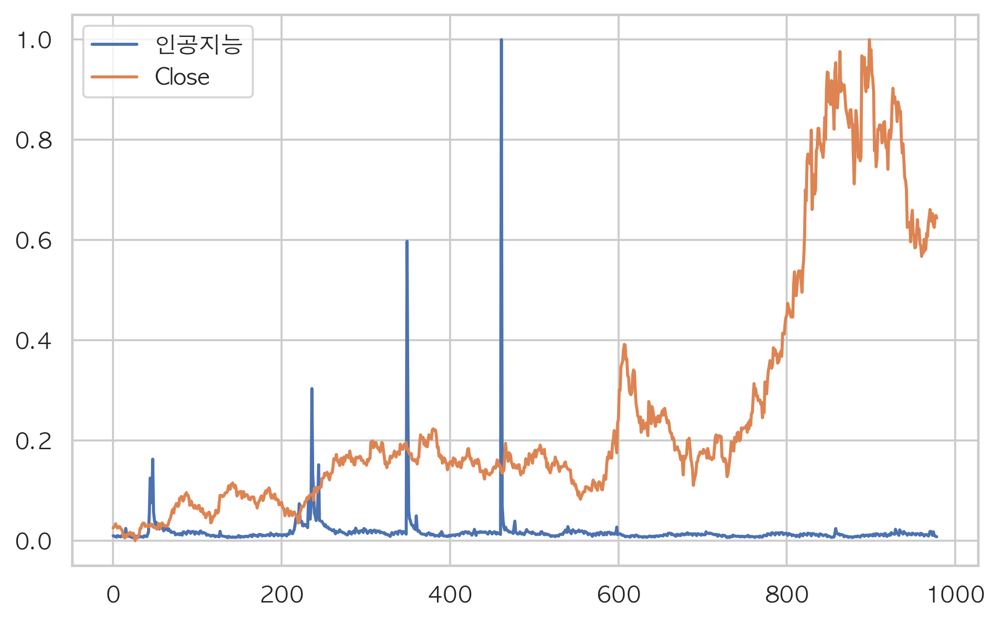

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.080791
Close -0.080791  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y    1.000   0.0491
Close_y   0.641   1.0000
------------------------------
Test Statistic           -0.640354
p-value                   0.861601
# Lags                   22.000000
# Observations          936.000000
Critical Value (1%)      -3.437356
Critical Value (5%)      -2.864633
Critical Value (10%)     -2.568417
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -6.541846e+00
p-value                 9.304595e-09
# Lags                  2.200000e+01
# Observations          9.350000e+02
Critical Value (1%)    -3.437363e+00
Critical Value (5%)    -2.864636e+00
Critical Value (10%)   -2.568419e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.03377691981604263
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 8.8960e-04 - mse: 8.8960e-04 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 3.8311e-04 - mse: 3.8311e-04 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 3.0277e-04 - mse: 3.0277e-04 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 2.6823e-04 - mse: 2.6823e-04 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 2.2350e-04 - mse: 2.2350e-04 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 2.1239e-04 - mse: 2.1239e-04 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 1.8108e-04 - mse: 1.8108e-04 - val_loss: 0.0089 -

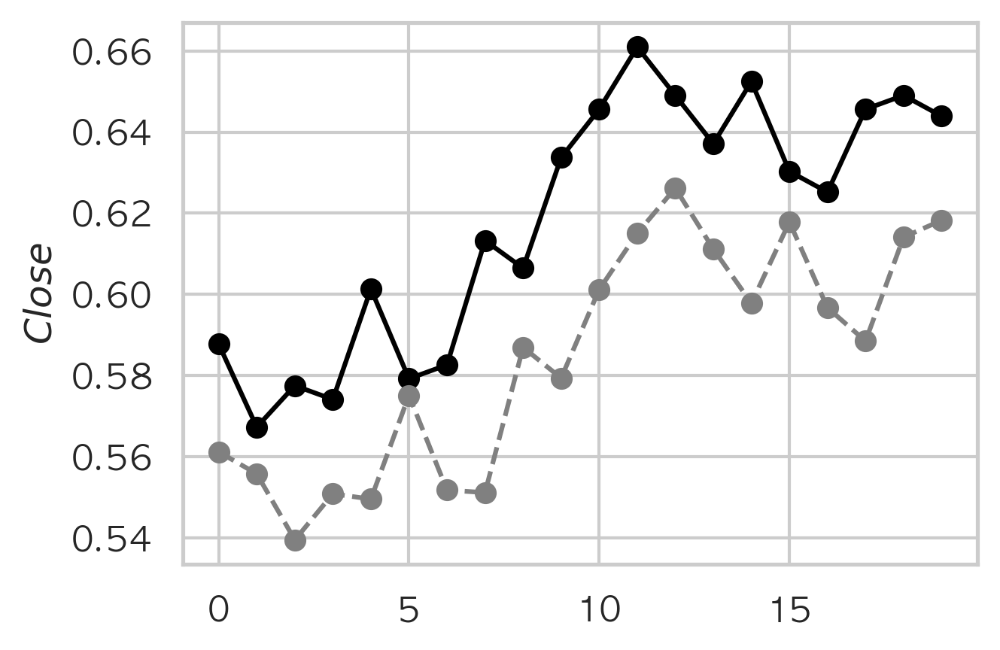

LSTM_RMSE: 0.03745793386065791
회사: 데이타솔루션


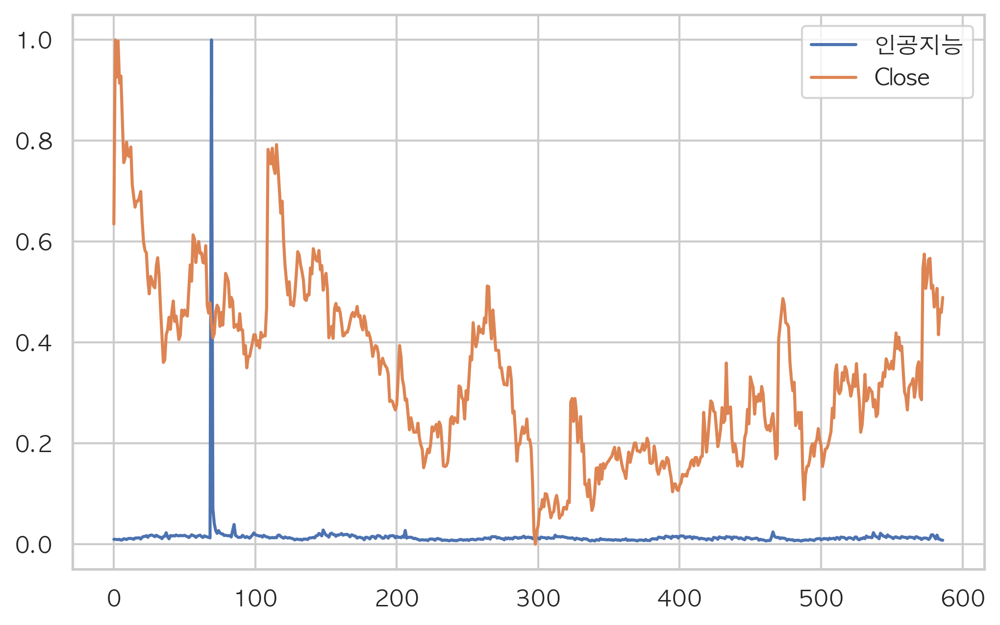

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.051086
Close  0.051086  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0156
Close_y  0.4699   1.0000
------------------------------
Test Statistic           -2.975795
p-value                   0.037218
# Lags                    0.000000
# Observations          566.000000
Critical Value (1%)      -3.441956
Critical Value (5%)      -2.866660
Critical Value (10%)     -2.569497
dtype: float64
 Series is Stationary
------------------------------
Test Statistic          -26.561800
p-value                   0.000000
# Lags                    0.000000
# Observations          565.000000
Critical Value (1%)      -3.441977
Critical Value (5%)      -2.866669
Critical Value (10%)     -2.569502
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.19593179735202598
Epoch 1/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0087 - mse: 0.0087 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 2/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 3/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 4/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 5/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 6/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 7/100
449/449 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 8/100
449/449 [==================

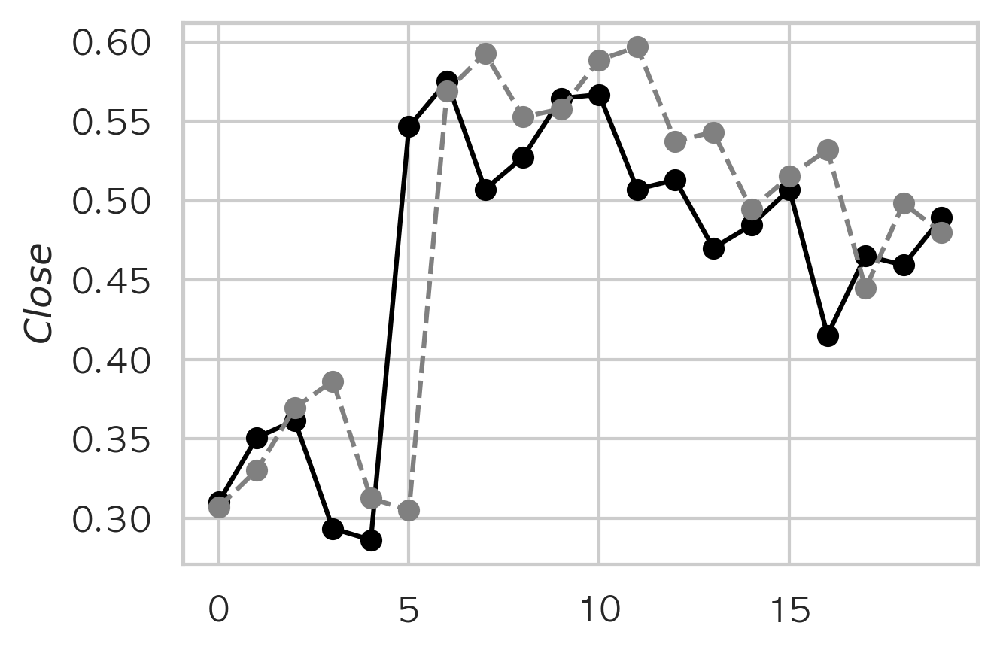

LSTM_RMSE: 0.07293387336676257
회사: 디지탈옵틱


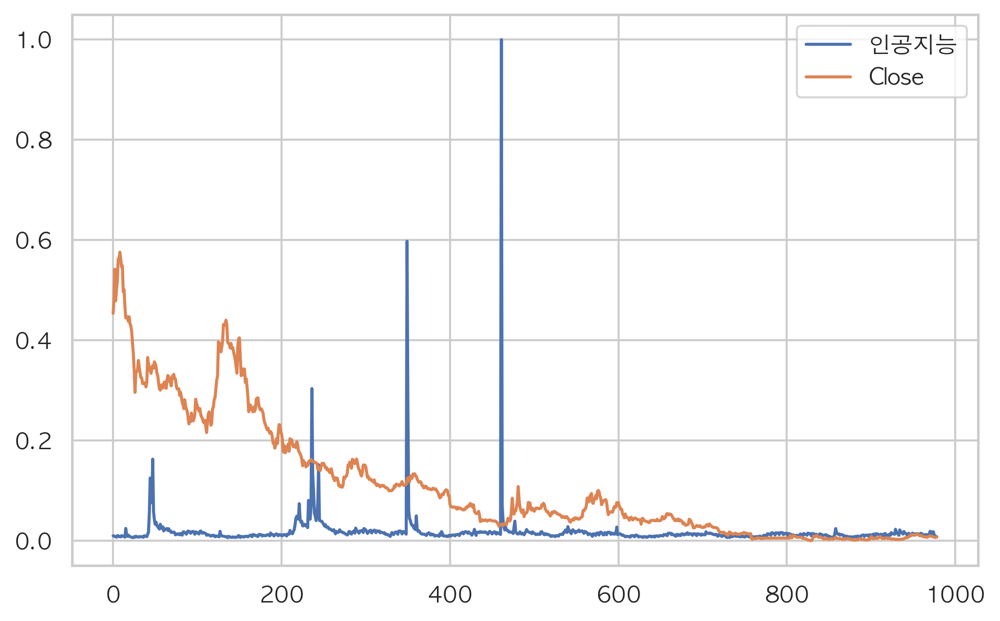

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.026942
Close  0.026942  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.5307
Close_y  0.0208   1.0000
------------------------------
Test Statistic           -2.658955
p-value                   0.081414
# Lags                   18.000000
# Observations          940.000000
Critical Value (1%)      -3.437326
Critical Value (5%)      -2.864620
Critical Value (10%)     -2.568410
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -8.159275e+00
p-value                 9.237473e-13
# Lags                  1.700000e+01
# Observations          9.400000e+02
Critical Value (1%)    -3.437326e+00
Critical Value (5%)    -2.864620e+00
Critical Value (10%)   -2.568410e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.00441042894352399
Epoch 1/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 6.7477e-05 - val_mse: 6.7477e-05
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 4.1677e-04 - mse: 4.1677e-04 - val_loss: 2.2050e-04 - val_mse: 2.2050e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 3.1740e-04 - mse: 3.1740e-04 - val_loss: 1.0718e-04 - val_mse: 1.0718e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 4.4174e-04 - mse: 4.4174e-04 - val_loss: 2.2294e-04 - val_mse: 2.2294e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 3.7764e-04 - mse: 3.7764e-04 - val_loss: 6.6688e-04 - val_mse: 6.6688e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 2.9534e-04 - mse: 2.9534e-04 - val_loss: 1.0066e-04 - val_mse: 1.0066e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 2.5208e-0

763/763 [==============================] - 1s 2ms/step - loss: 1.2184e-04 - mse: 1.2184e-04 - val_loss: 3.1961e-05 - val_mse: 3.1961e-05
Epoch 56/100
763/763 [==============================] - 1s 2ms/step - loss: 1.2334e-04 - mse: 1.2334e-04 - val_loss: 6.7717e-05 - val_mse: 6.7717e-05
Epoch 57/100
763/763 [==============================] - 1s 2ms/step - loss: 1.2368e-04 - mse: 1.2368e-04 - val_loss: 5.4158e-05 - val_mse: 5.4158e-05
Epoch 58/100
763/763 [==============================] - 1s 2ms/step - loss: 1.2325e-04 - mse: 1.2325e-04 - val_loss: 3.3907e-05 - val_mse: 3.3907e-05
Epoch 59/100
763/763 [==============================] - 1s 2ms/step - loss: 1.3892e-04 - mse: 1.3892e-04 - val_loss: 6.3748e-05 - val_mse: 6.3748e-05
Epoch 60/100
763/763 [==============================] - 1s 2ms/step - loss: 1.2295e-04 - mse: 1.2295e-04 - val_loss: 3.6947e-05 - val_mse: 3.6947e-05
Epoch 61/100
763/763 [==============================] - 1s 2ms/step - loss: 1.3227e-04 - mse: 1.3227e-04 - val_lo

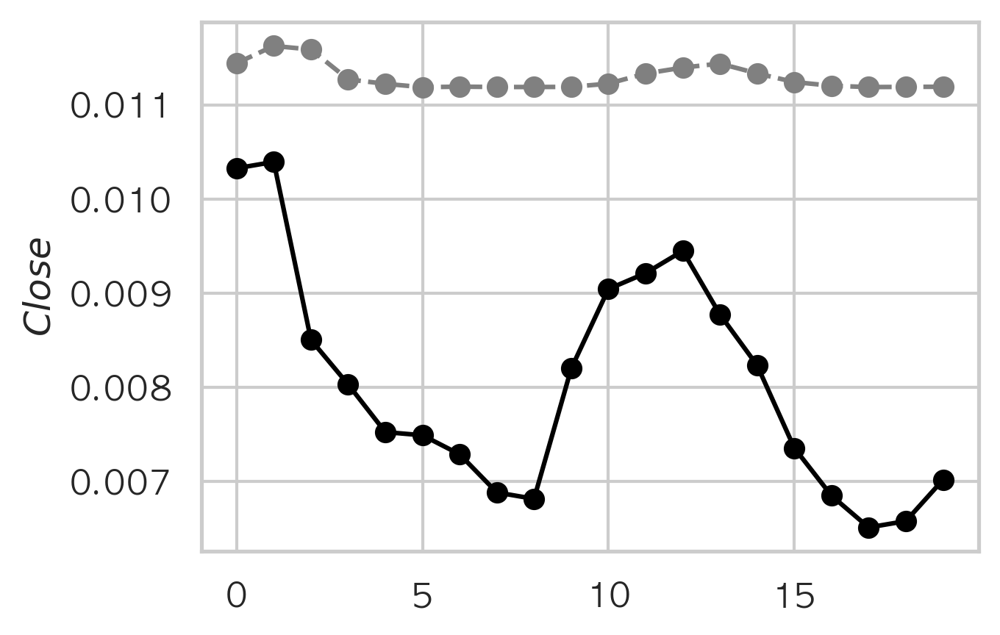

LSTM_RMSE: 0.00343670768418925
회사: 로보로보


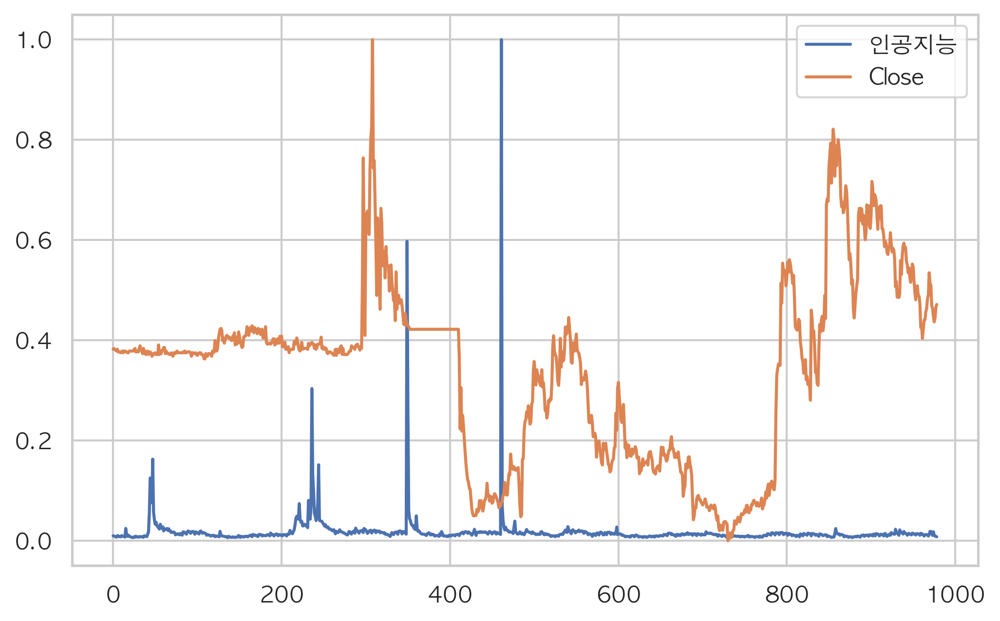

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.009399
Close -0.009399  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.8087
Close_y  0.9391   1.0000
------------------------------
Test Statistic           -2.265173
p-value                   0.183446
# Lags                   20.000000
# Observations          938.000000
Critical Value (1%)      -3.437341
Critical Value (5%)      -2.864626
Critical Value (10%)     -2.568413
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -7.314978e+00
p-value                 1.236064e-10
# Lags                  1.900000e+01
# Observations          9.380000e+02
Critical Value (1%)    -3.437341e+00
Critical Value (5%)    -2.864626e+00
Critical Value (10%)   -2.568413e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.03562808392575799
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 8/100
763/763 [==================

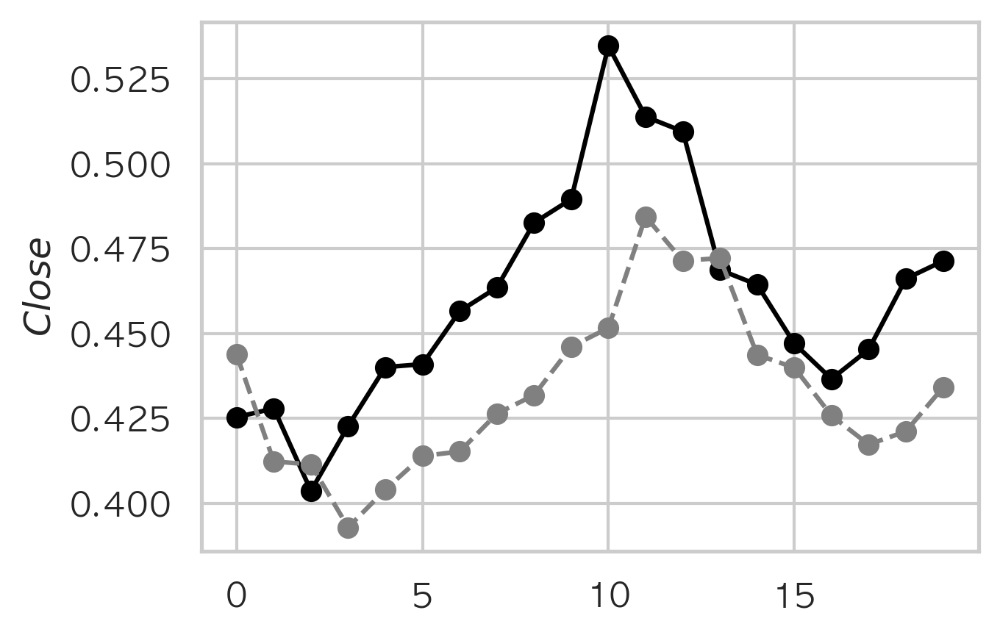

LSTM_RMSE: 0.03546096509432683
회사: 로보스타


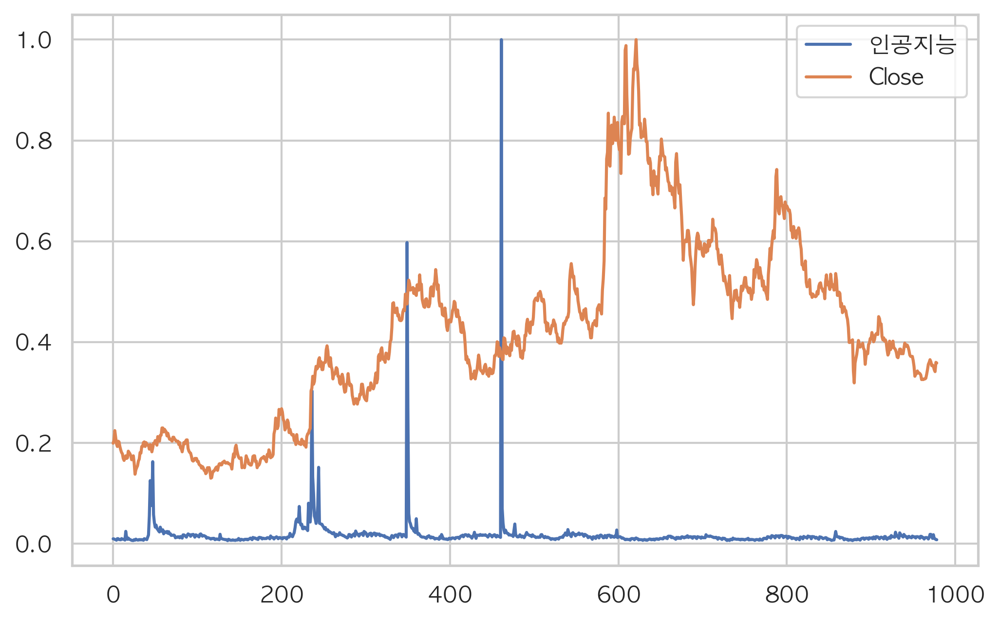

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.054336
Close -0.054336  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.1279
Close_y  0.1728   1.0000
------------------------------
Test Statistic           -1.970524
p-value                   0.299645
# Lags                   15.000000
# Observations          943.000000
Critical Value (1%)      -3.437304
Critical Value (5%)      -2.864610
Critical Value (10%)     -2.568405
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -7.266096e+00
p-value                 1.633567e-10
# Lags                  1.400000e+01
# Observations          9.430000e+02
Critical Value (1%)    -3.437304e+00
Critical Value (5%)    -2.864610e+00
Critical Value (10%)   -2.568405e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.01378608309007884
Epoch 1/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 6.7637e-04 - val_mse: 6.7637e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 5.6108e-04 - val_mse: 5.6108e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 5.4811e-04 - val_mse: 5.4811e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 9.2464e-04 - mse: 9.2464e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 7.8274e-04 - mse: 7.8274e-04 - val_loss: 3.2762e-04 - val_mse: 3.

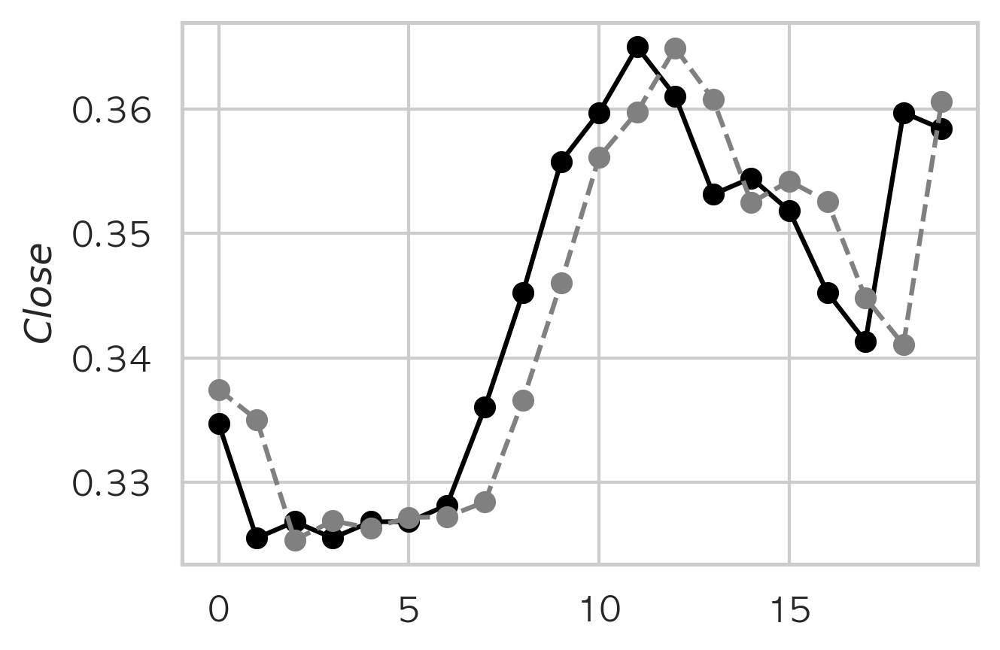

LSTM_RMSE: 0.006603262363030131
회사: 로보티즈


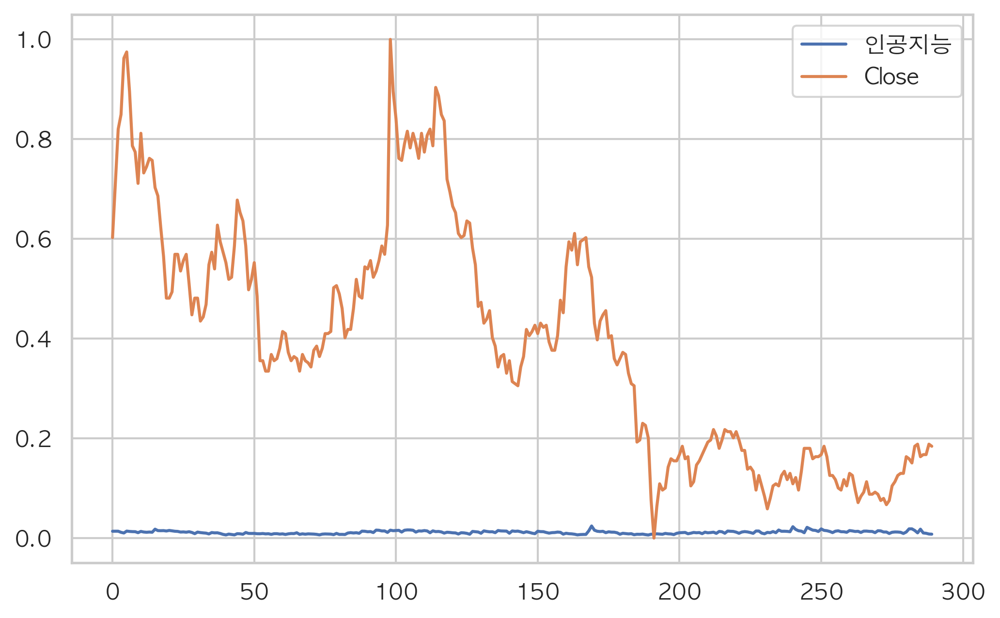

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.032491
Close  0.032491  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.5873
Close_y  0.3829   1.0000
------------------------------
Test Statistic           -1.451184
p-value                   0.557507
# Lags                    0.000000
# Observations          269.000000
Critical Value (1%)      -3.454896
Critical Value (5%)      -2.872345
Critical Value (10%)     -2.572528
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.529621e+01
p-value                 4.374787e-28
# Lags                  0.000000e+00
# Observations          2.680000e+02
Critical Value (1%)    -3.454988e+00
Critical Value (5%)    -2.872386e+00
Critical Value (10%)   -2.572549e+00
dtype: float64
 Series is Stationary
VAR_RMSE: 0.0928150621390574


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


Epoch 1/100
212/212 [==============================] - 1s 3ms/step - loss: 0.0172 - mse: 0.0172 - val_loss: 6.0473e-04 - val_mse: 6.0473e-04
Epoch 2/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 3/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 4/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 5/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 5.3011e-04 - val_mse: 5.3011e-04
Epoch 6/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 7/100
212/212 [==============================] - 0s 2ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 8/100
212/212 [==============================] 

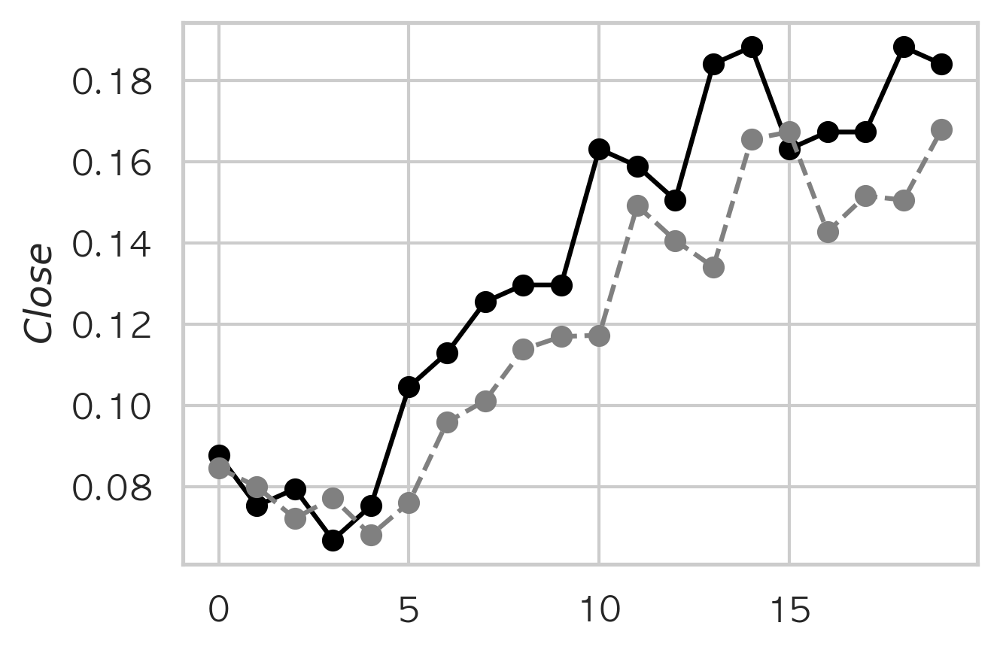

LSTM_RMSE: 0.022593224024845322
회사: 링크제니시스


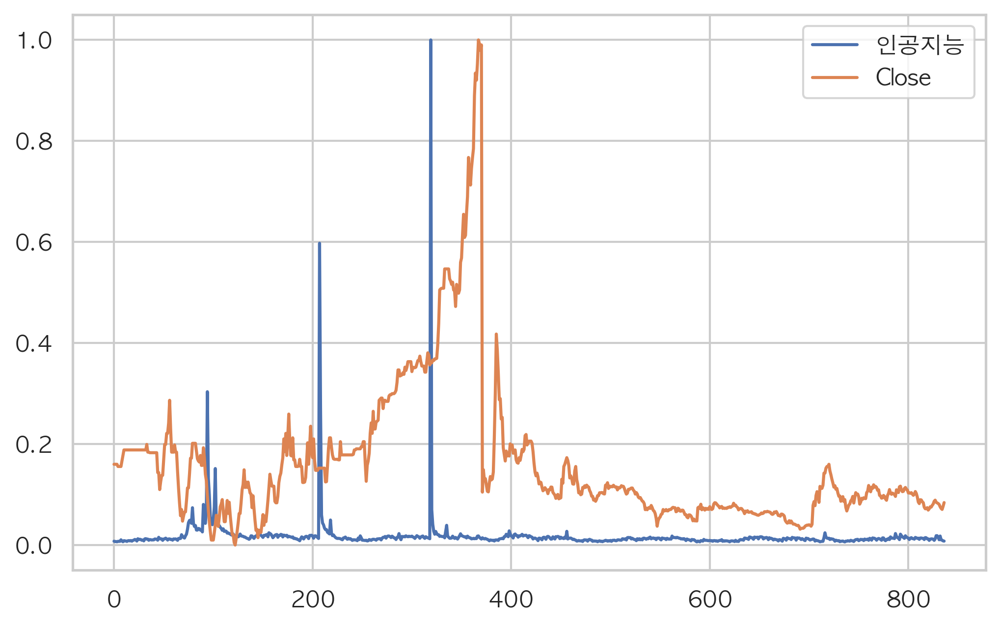

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.042568
Close  0.042568  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.3139
Close_y  0.4668   1.0000
------------------------------
Test Statistic           -2.196838
p-value                   0.207395
# Lags                   14.000000
# Observations          802.000000
Critical Value (1%)      -3.438530
Critical Value (5%)      -2.865151
Critical Value (10%)     -2.568693
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.124341e+01
p-value                 1.783846e-20
# Lags                  1.300000e+01
# Observations          8.020000e+02
Critical Value (1%)    -3.438530e+00
Critical Value (5%)    -2.865151e+00
Critical Value (10%)   -2.568693e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.005446570373361417
Epoch 1/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 2/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 2.7964e-04 - val_mse: 2.7964e-04
Epoch 3/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 2.1847e-04 - val_mse: 2.1847e-04
Epoch 4/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 1.0107e-04 - val_mse: 1.0107e-04
Epoch 5/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 1.4341e-04 - val_mse: 1.4341e-04
Epoch 6/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 2.2085e-04 - val_mse: 2.2085e-04
Epoch 7/100
649/649 [==============================] - 1s 2ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 9.5178e-05 - val_mse: 9

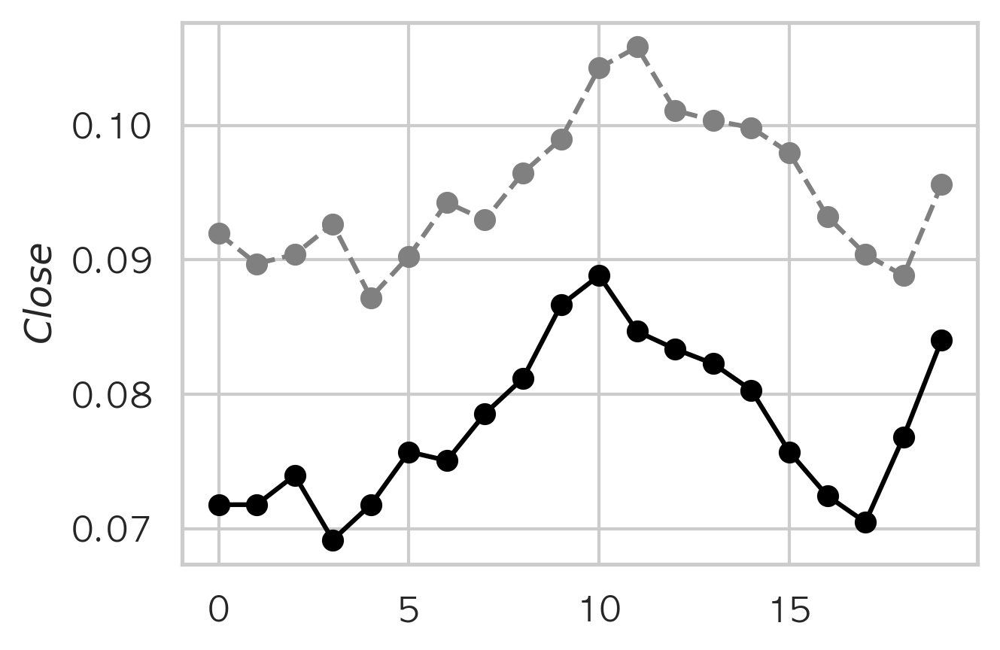

LSTM_RMSE: 0.01771551409864132
회사: 모비스


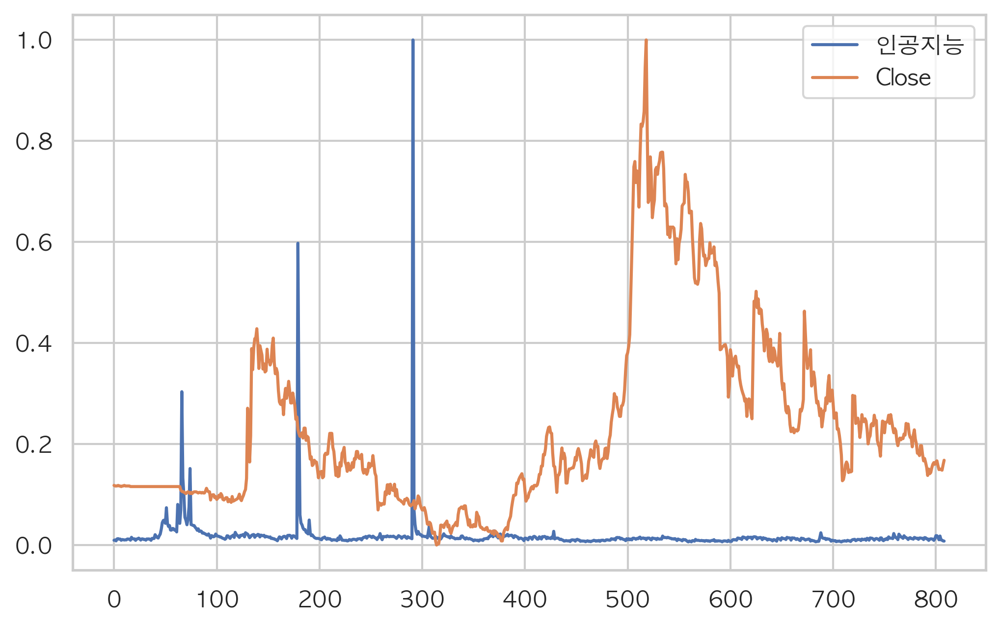

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.081751
Close -0.081751  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0657
Close_y  0.7531   1.0000
------------------------------
Test Statistic           -1.953952
p-value                   0.307121
# Lags                    7.000000
# Observations          781.000000
Critical Value (1%)      -3.438751
Critical Value (5%)      -2.865248
Critical Value (10%)     -2.568744
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.134277e+01
p-value                 1.044708e-20
# Lags                  6.000000e+00
# Observations          7.810000e+02
Critical Value (1%)    -3.438751e+00
Critical Value (5%)    -2.865248e+00
Critical Value (10%)   -2.568744e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.018043245784417527
Epoch 1/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 2/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 3/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 4/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 9.7004e-04 - val_mse: 9.7004e-04
Epoch 5/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 6/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 7/100
627/627 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 8/100
627/627 [=========

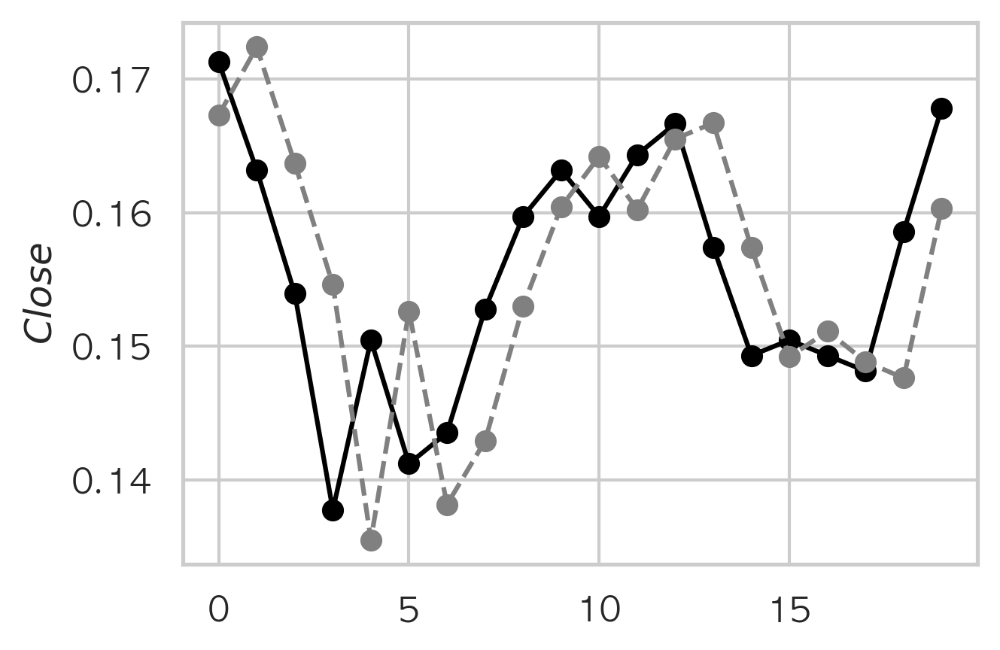

LSTM_RMSE: 0.008326021853329547
회사: 미래컴퍼니


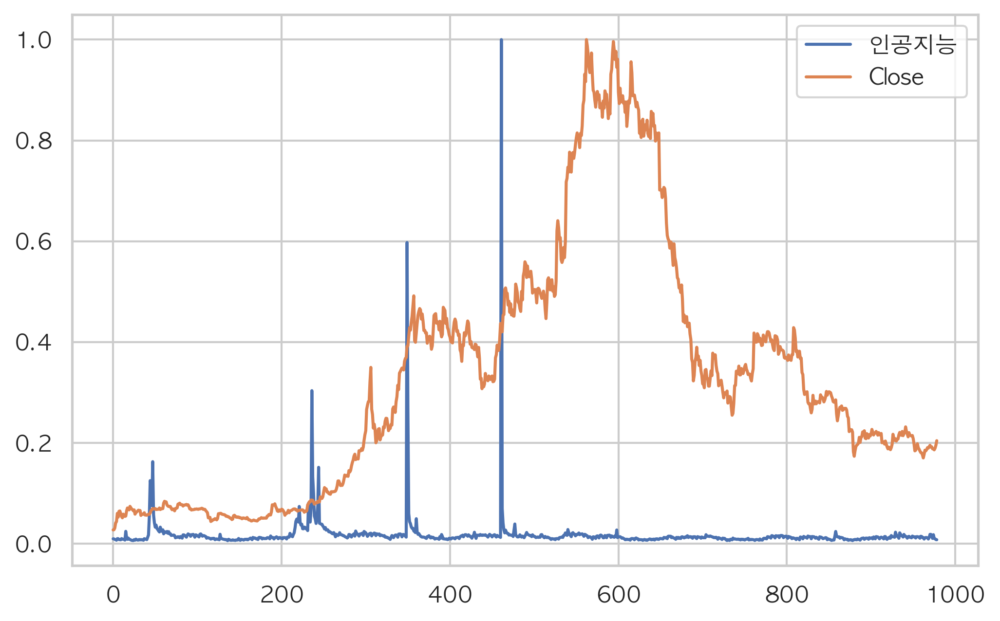

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.036352
Close -0.036352  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0655
Close_y  0.0053   1.0000
------------------------------
Test Statistic           -1.482323
p-value                   0.542237
# Lags                   22.000000
# Observations          936.000000
Critical Value (1%)      -3.437356
Critical Value (5%)      -2.864633
Critical Value (10%)     -2.568417
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic           -4.746031
p-value                   0.000069
# Lags                   22.000000
# Observations          935.000000
Critical Value (1%)      -3.437363
Critical Value (5%)      -2.864636
Critical Value (10%)     -2.568419
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.010008809083054565
Epoch 1/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 4.4422e-04 - val_mse: 4.4422e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 2.7752e-04 - val_mse: 2.7752e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 2.4449e-04 - val_mse: 2.4449e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 2.4674e-04 - val_mse: 2.4674e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 3.6652e-04 - val_mse: 3.6652e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 1.7089e-04 - val_mse: 1.7089e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 8.2077e-04 - mse: 8.2077e-04 - val_loss: 1.5892e

20/20 [==============================] - 0s 847us/step - loss: 2.0033e-04 - mse: 2.0033e-04
loss :  0.00020032799511682242
mse :  0.00020032799511682242


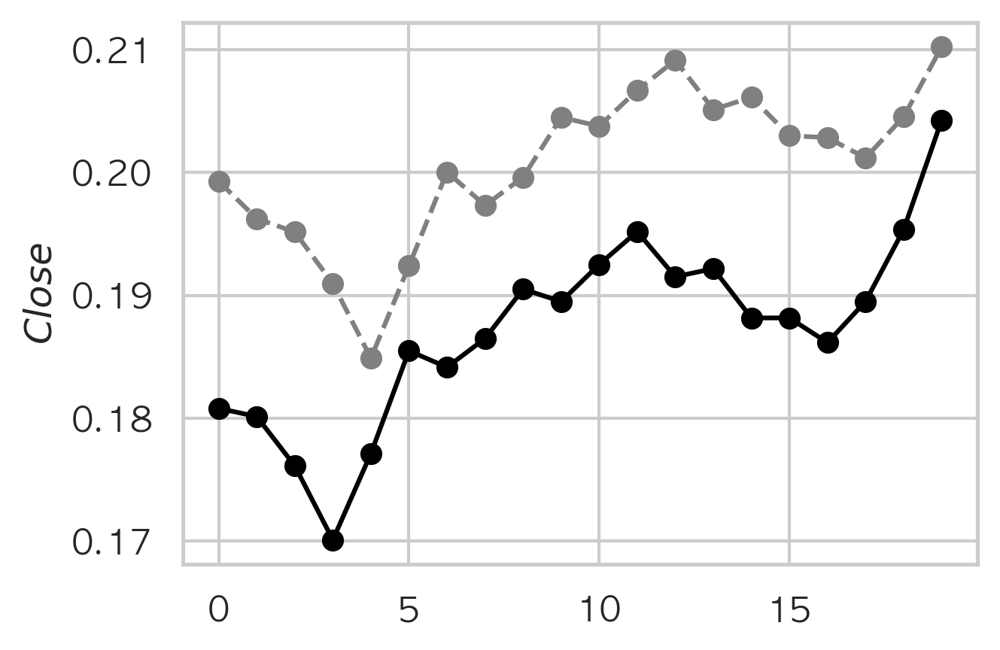

LSTM_RMSE: 0.01415372114924211
회사: 스맥


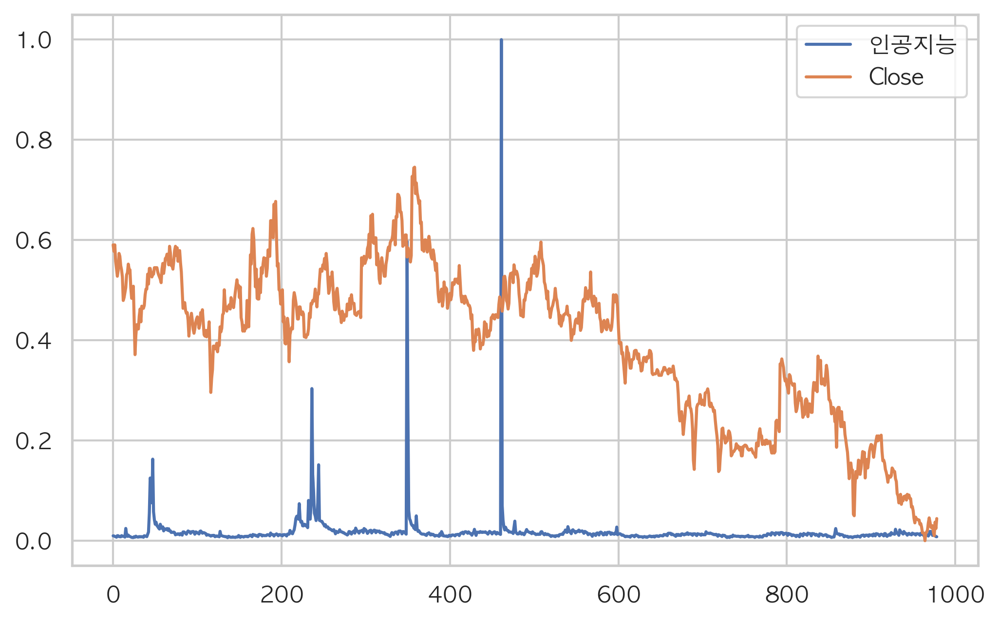

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.113234
Close  0.113234  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0037
Close_y  0.0754   1.0000
------------------------------
Test Statistic           -1.633505
p-value                   0.465657
# Lags                    1.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -32.670556
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.013270116561971513
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 9.6594e-04 - mse: 9.6594e-04 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 8.3907e-04 - mse: 8.3907e-04 - val_loss: 7.3350e-04 - val_mse: 7.3350e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 7.6197e-04 - mse: 7.6197e-04 - val_loss: 6.4741e-04 - val_mse: 6.4741e-0

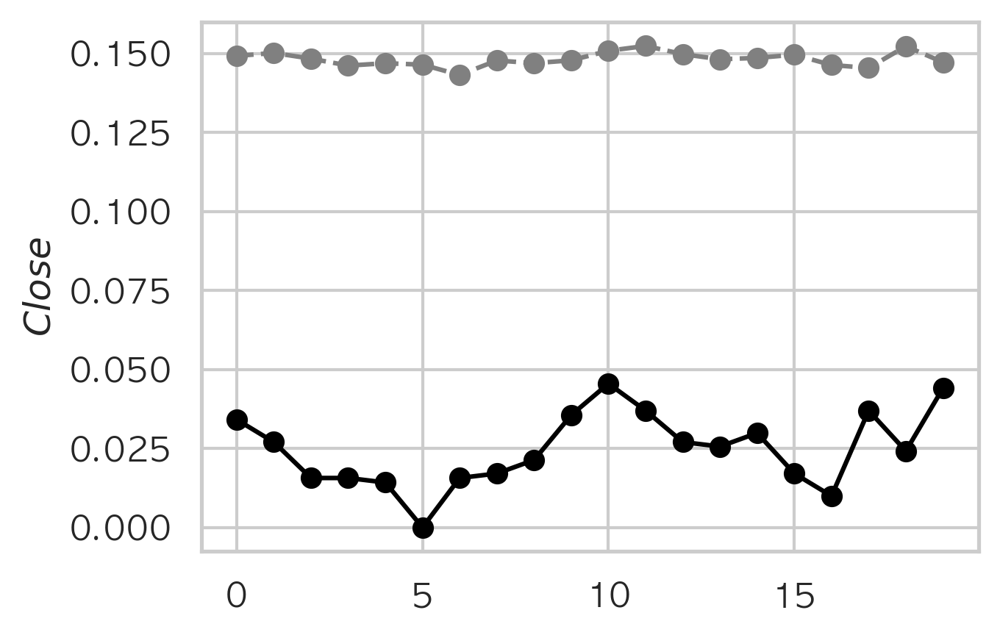

LSTM_RMSE: 0.1239572241820634
회사: 싸이맥스


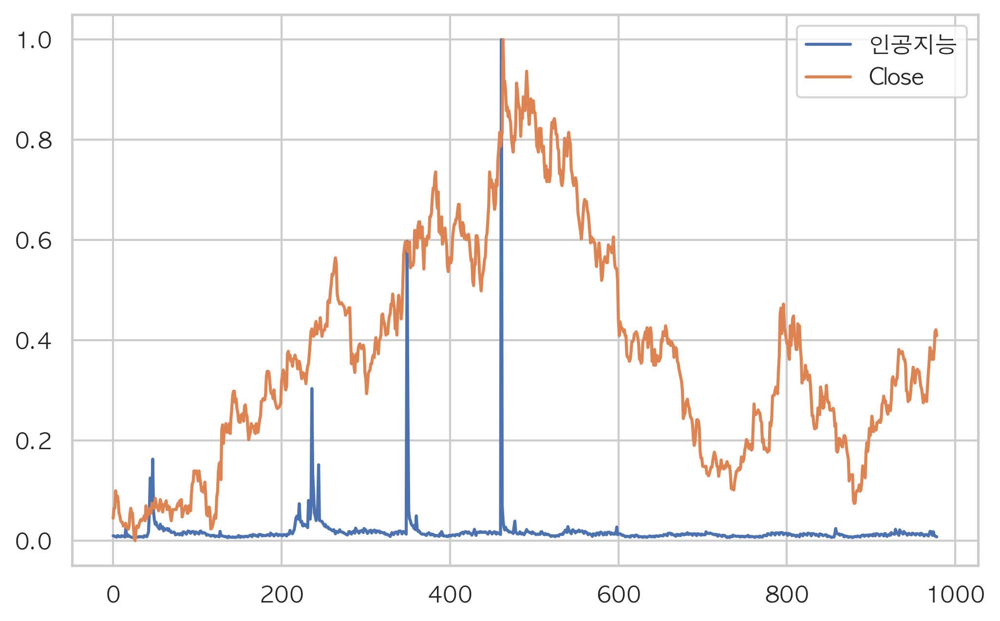

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.093766
Close  0.093766  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y      1.0   0.0003
Close_y     0.0   1.0000
------------------------------
Test Statistic           -1.820917
p-value                   0.370127
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -29.862699
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.049212901081095
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 9.6081e-04 - val_mse: 9.6081e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 4/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 9.1058e-04 - mse: 9.1058e-04 - val_loss: 5.5108e-04 - val_mse: 5.5108e-04
Epoch 8/100
763/7

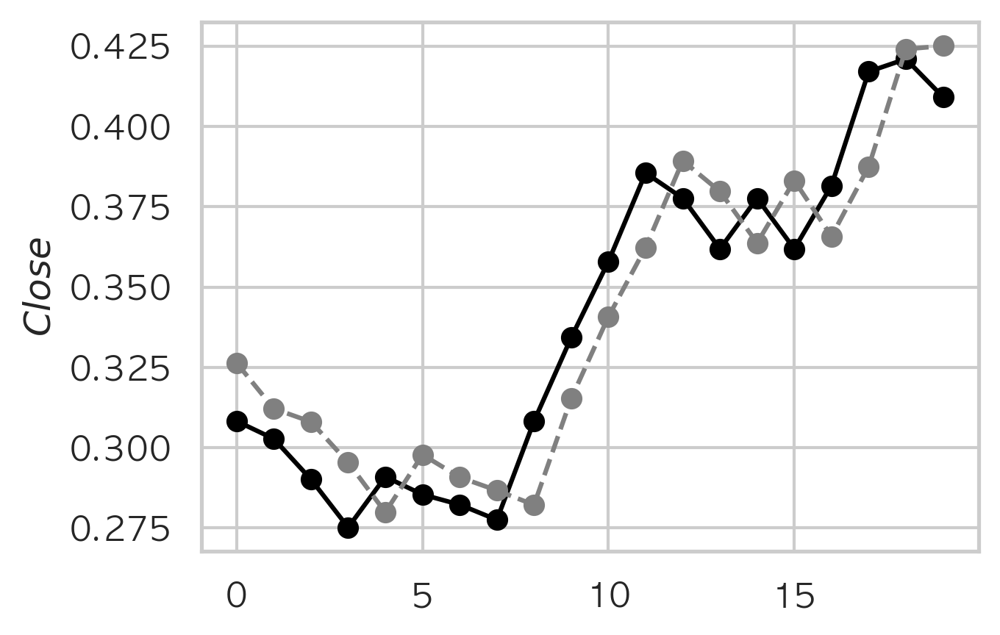

LSTM_RMSE: 0.017226249498841432
회사: 에스티큐브


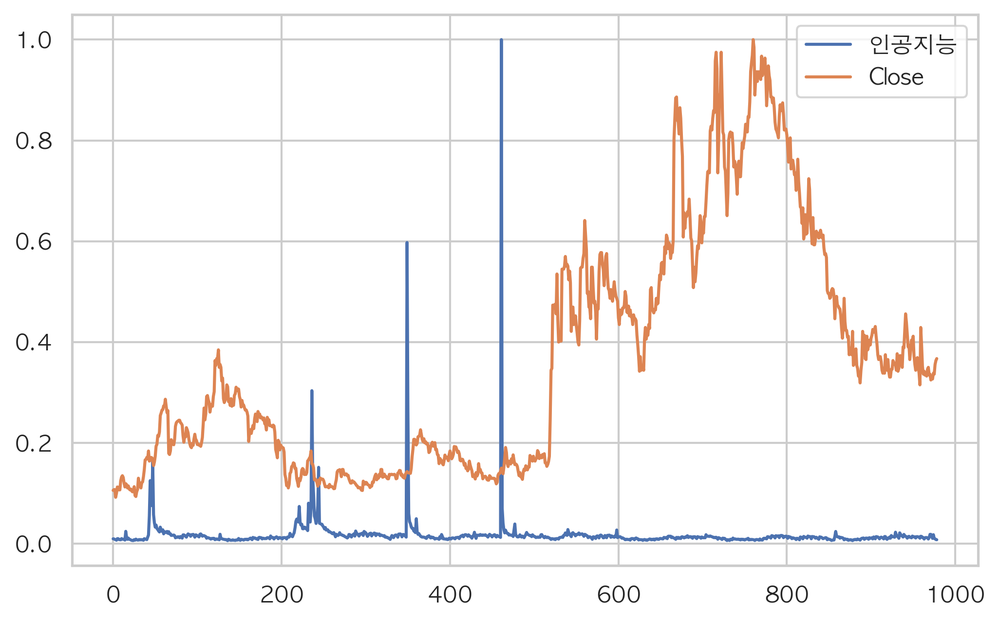

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.126498
Close -0.126498  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0014
Close_y  0.5396   1.0000
------------------------------
Test Statistic           -1.807772
p-value                   0.376610
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -30.488028
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.033269674657353206
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 2/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 3/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 6/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 6.8473e-04 - val_mse: 6.8473e-04
Epoch 8/100
763/763 [=========

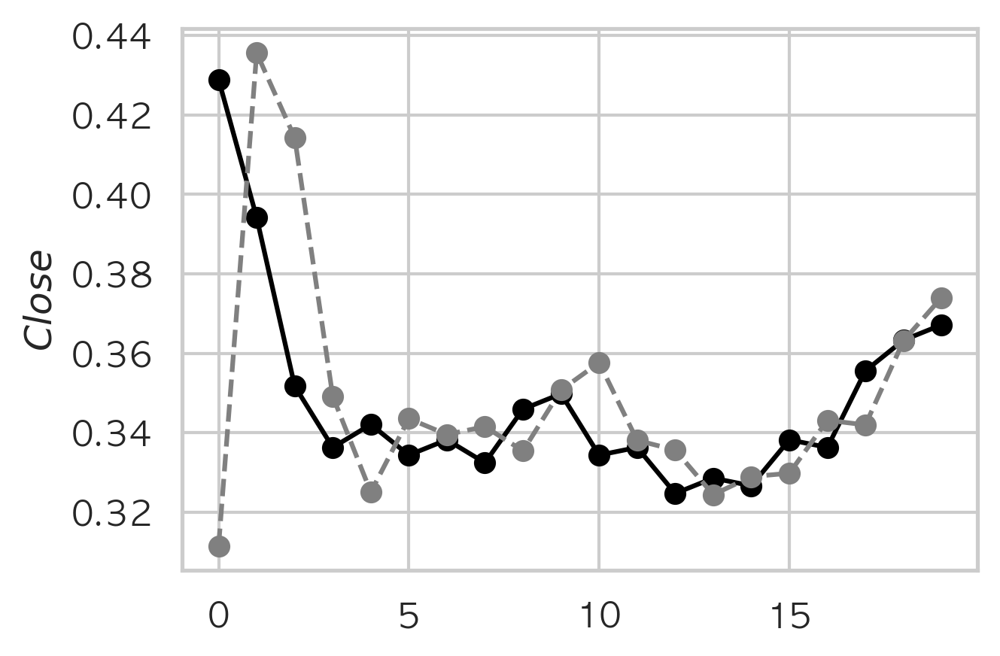

LSTM_RMSE: 0.03254610770298548
회사: 에이디칩스


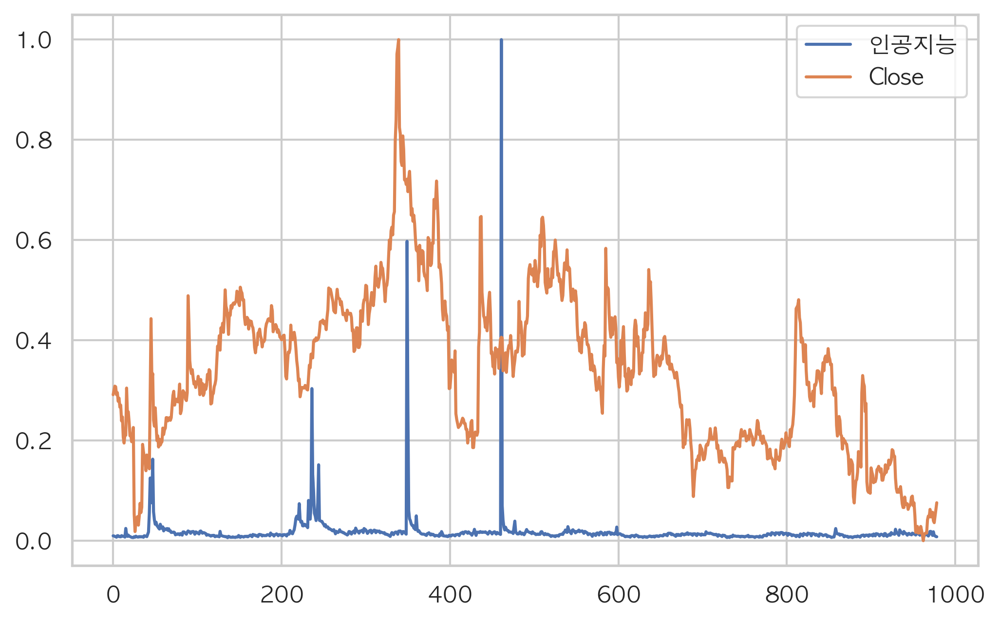

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.098574
Close  0.098574  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0199
Close_y  0.6068   1.0000
------------------------------
Test Statistic           -2.885374
p-value                   0.047075
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Stationary
------------------------------
Test Statistic         -1.493065e+01
p-value                 1.367941e-27
# Lags                  5.000000e+00
# Observations          9.520000e+02
Critical Value (1%)    -3.437238e+00
Critical Value (5%)    -2.864581e+00
Critical Value (10%)   -2.568389e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.023143512499512943
Epoch 1/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 8.4406e-04 - val_mse: 8.4406e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 9.5417e-04 - val_mse: 9.5417e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 8.9004e-04 - val_mse: 8.9004e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 9.8722e-04 - val_mse: 9.8722e-04
Epoch 

763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 60/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 7.8703e-04 - val_mse: 7.8703e-04
Epoch 61/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 7.2183e-04 - val_mse: 7.2183e-04
Epoch 62/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 7.0681e-04 - val_mse: 7.0681e-04
Epoch 63/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 7.2046e-04 - val_mse: 7.2046e-04
Epoch 64/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 65/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 66/100
763/763 [=====================

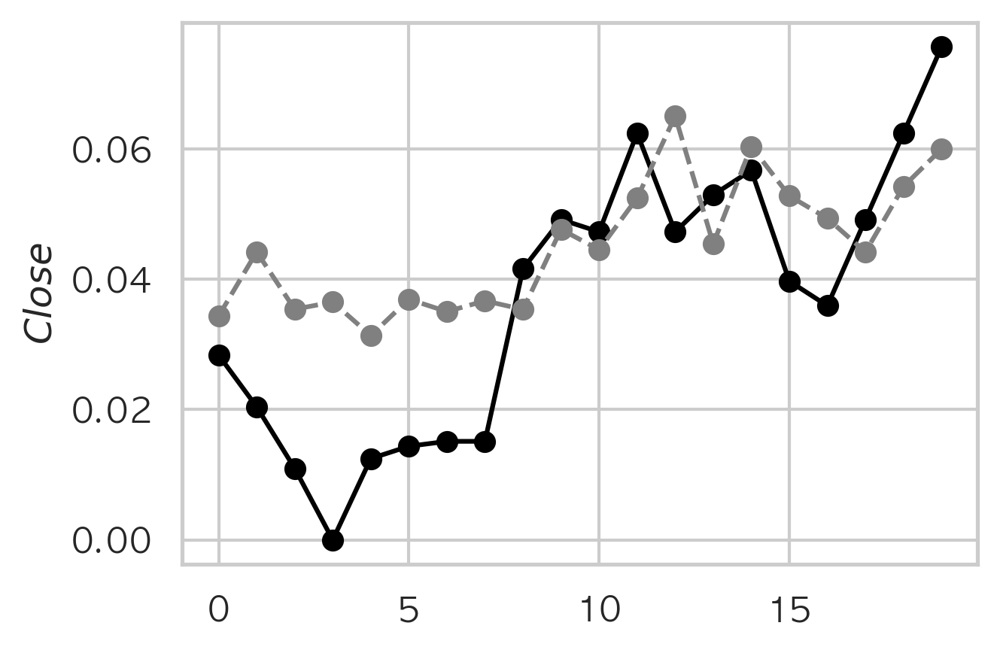

LSTM_RMSE: 0.01655590613034488
회사: 오픈베이스


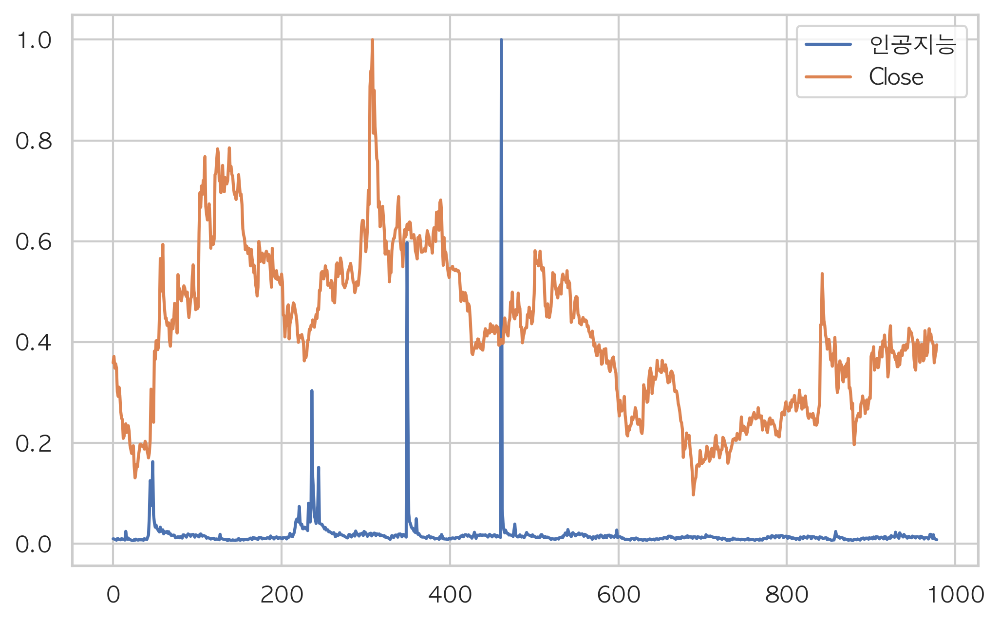

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.054732
Close  0.054732  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.2427
Close_y  0.3667   1.0000
------------------------------
Test Statistic           -2.550223
p-value                   0.103728
# Lags                    2.000000
# Observations          956.000000
Critical Value (1%)      -3.437209
Critical Value (5%)      -2.864568
Critical Value (10%)     -2.568382
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -32.848978
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.03331486480676668
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 2/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 8.1765e-04 - val_mse: 8.1765e-04
Epoch 5/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 7.8763e-04 - val_mse: 7.8763e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 7.1675e-04 - val_mse: 7.1675e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 6.1509e-04 - val_mse: 6.1509e-04
Epoch 8

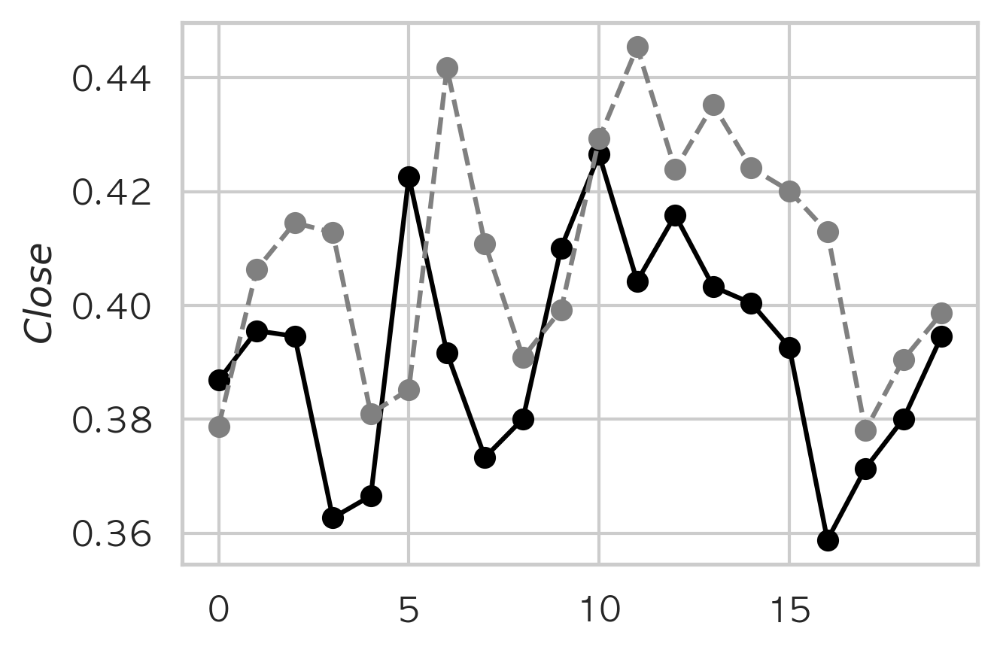

LSTM_RMSE: 0.02832889197710524
회사: 우리기술


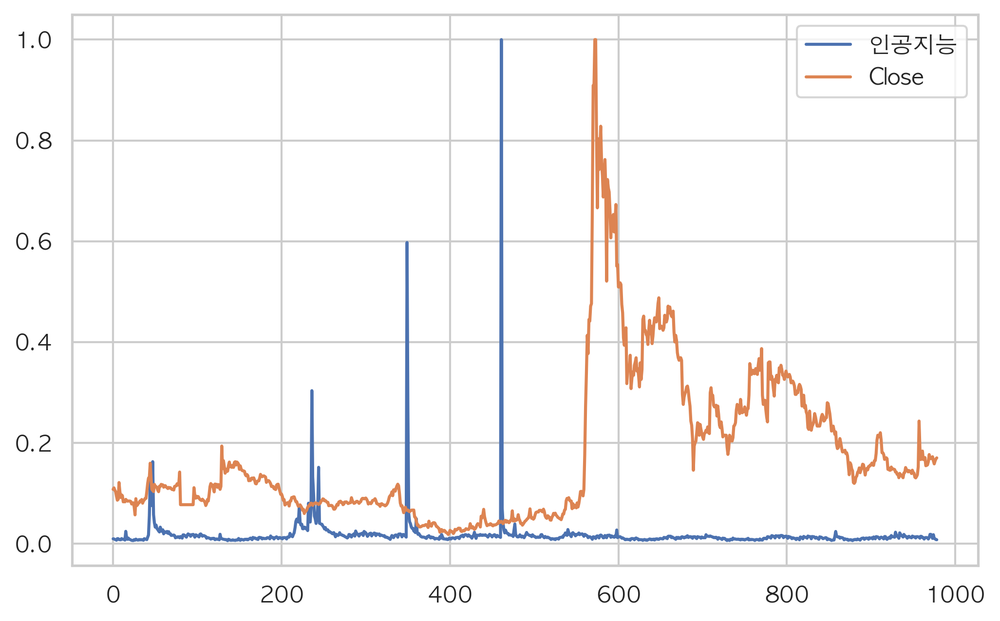

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.096234
Close -0.096234  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0164
Close_y  0.6257   1.0000
------------------------------
Test Statistic           -2.685378
p-value                   0.076603
# Lags                   22.000000
# Observations          936.000000
Critical Value (1%)      -3.437356
Critical Value (5%)      -2.864633
Critical Value (10%)     -2.568417
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -6.824528e+00
p-value                 1.963231e-09
# Lags                  2.200000e+01
# Observations          9.350000e+02
Critical Value (1%)    -3.437363e+00
Critical Value (5%)    -2.864636e+00
Critical Value (10%)   -2.568419e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.033937966505197814
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 4.3818e-04 - val_mse: 4.3818e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 6.8016e-04 - val_mse: 6.8016e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 9.1724e-04 - val_mse: 9.1724e-04
Epoch 6/100
763/763 [==============================] - 2s 3ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 3.4293e-04 - val_mse: 3.4293e-04
Epoch 7/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 

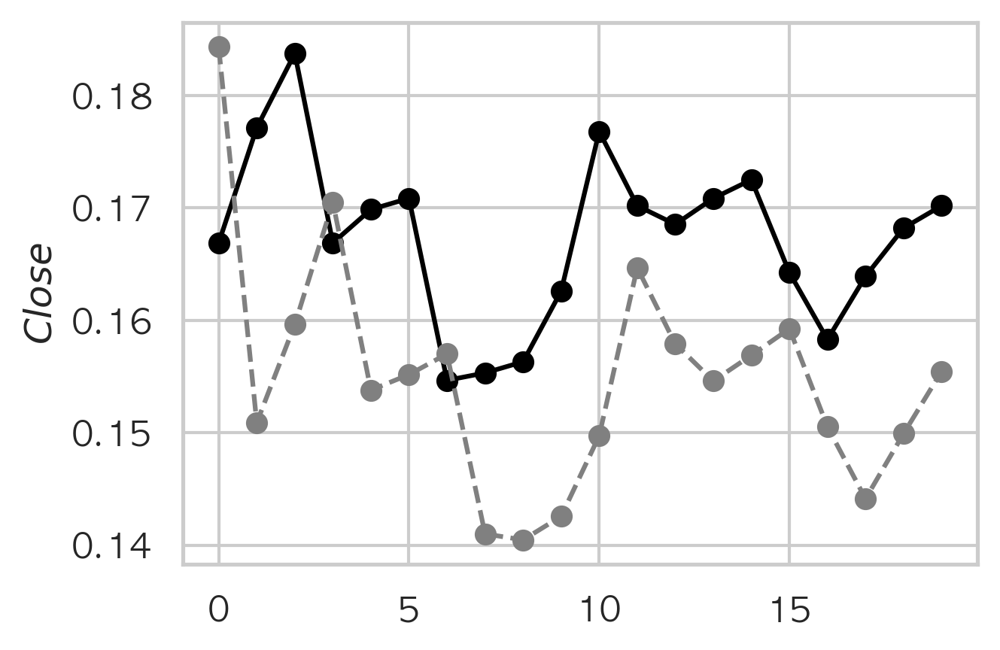

LSTM_RMSE: 0.0163810722587415
회사: 위세아이텍


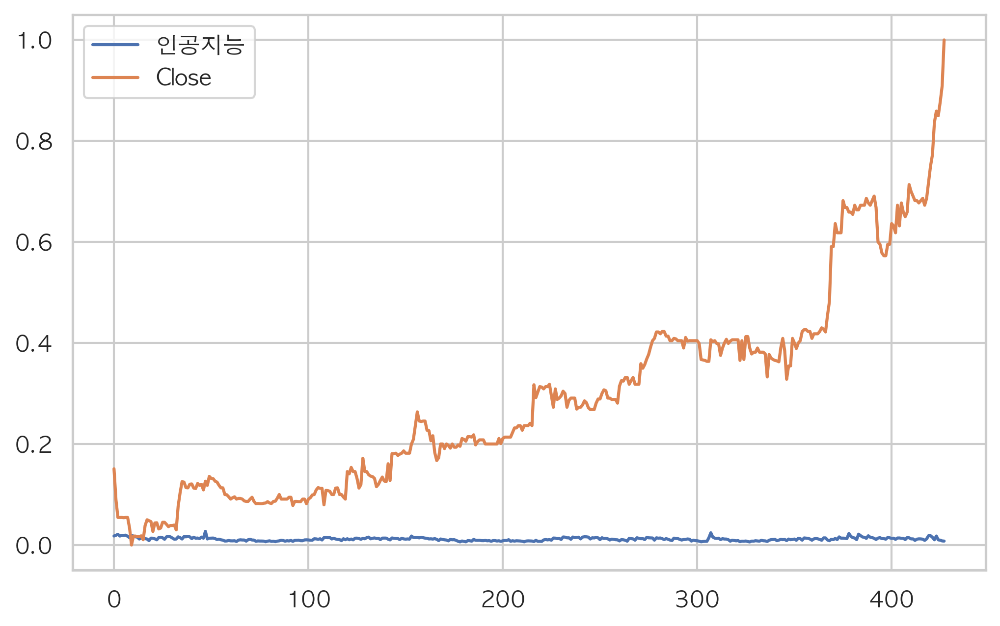

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.088649
Close  0.088649  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.2343
Close_y  0.2465   1.0000
------------------------------
Test Statistic            0.043043
p-value                   0.961950
# Lags                    2.000000
# Observations          405.000000
Critical Value (1%)      -3.446600
Critical Value (5%)      -2.868703
Critical Value (10%)     -2.570586
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.434099e+01
p-value                 1.060133e-26
# Lags                  1.000000e+00
# Observations          4.050000e+02
Critical Value (1%)    -3.446600e+00
Critical Value (5%)    -2.868703e+00
Critical Value (10%)   -2.570586e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.12678555818026796
Epoch 1/100
322/322 [==============================] - 1s 3ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 2/100
322/322 [==============================] - 1s 2ms/step - loss: 4.2964e-04 - mse: 4.2964e-04 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 3/100
322/322 [==============================] - 1s 2ms/step - loss: 4.3100e-04 - mse: 4.3100e-04 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 4/100
322/322 [==============================] - 1s 2ms/step - loss: 4.8029e-04 - mse: 4.8029e-04 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 5/100
322/322 [==============================] - 1s 2ms/step - loss: 4.6707e-04 - mse: 4.6707e-04 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 6/100
322/322 [==============================] - 1s 2ms/step - loss: 3.6921e-04 - mse: 3.6921e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 7/100
322/322 [==============================] - 1s 2ms/step - loss: 4.5685e-04 - mse: 4.5685e-04 - val_loss: 0.0012 - val_mse

322/322 [==============================] - 1s 2ms/step - loss: 2.8899e-04 - mse: 2.8899e-04 - val_loss: 6.7212e-04 - val_mse: 6.7212e-04
Epoch 57/100
322/322 [==============================] - 1s 2ms/step - loss: 3.3633e-04 - mse: 3.3633e-04 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 58/100
322/322 [==============================] - 1s 2ms/step - loss: 2.5768e-04 - mse: 2.5768e-04 - val_loss: 7.4793e-04 - val_mse: 7.4793e-04
Epoch 59/100
322/322 [==============================] - 1s 2ms/step - loss: 2.5761e-04 - mse: 2.5761e-04 - val_loss: 6.5931e-04 - val_mse: 6.5931e-04
Epoch 60/100
322/322 [==============================] - 1s 2ms/step - loss: 2.7877e-04 - mse: 2.7877e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 61/100
322/322 [==============================] - 1s 2ms/step - loss: 2.7700e-04 - mse: 2.7700e-04 - val_loss: 6.6771e-04 - val_mse: 6.6771e-04
Epoch 62/100
322/322 [==============================] - 1s 2ms/step - loss: 2.4550e-04 - mse: 2.4550e-04 - val_loss: 6.9563e-04 -

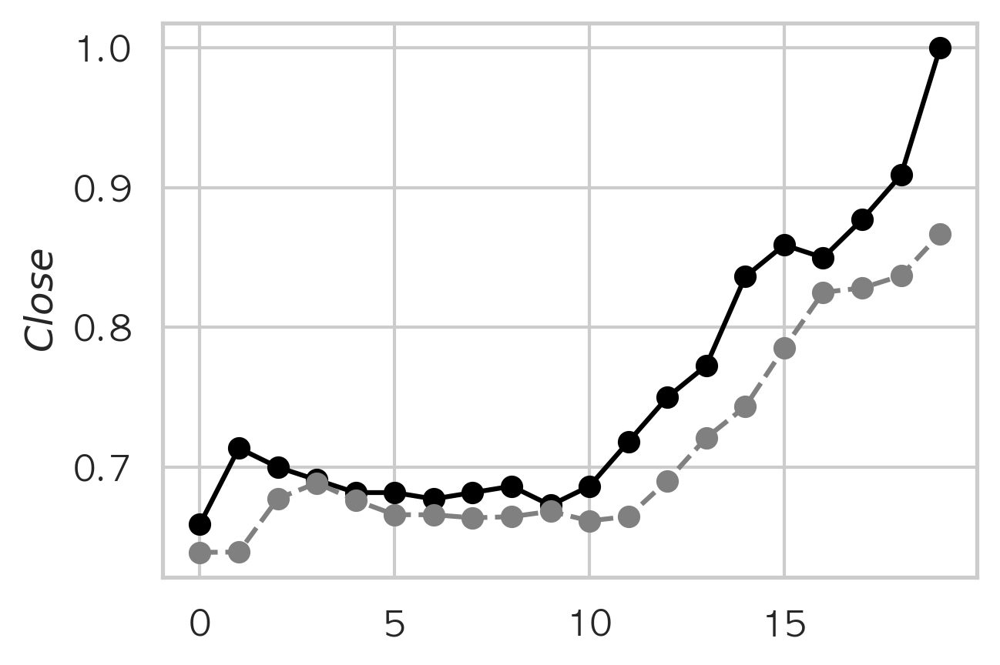

LSTM_RMSE: 0.05355574322021324
회사: 유진로봇


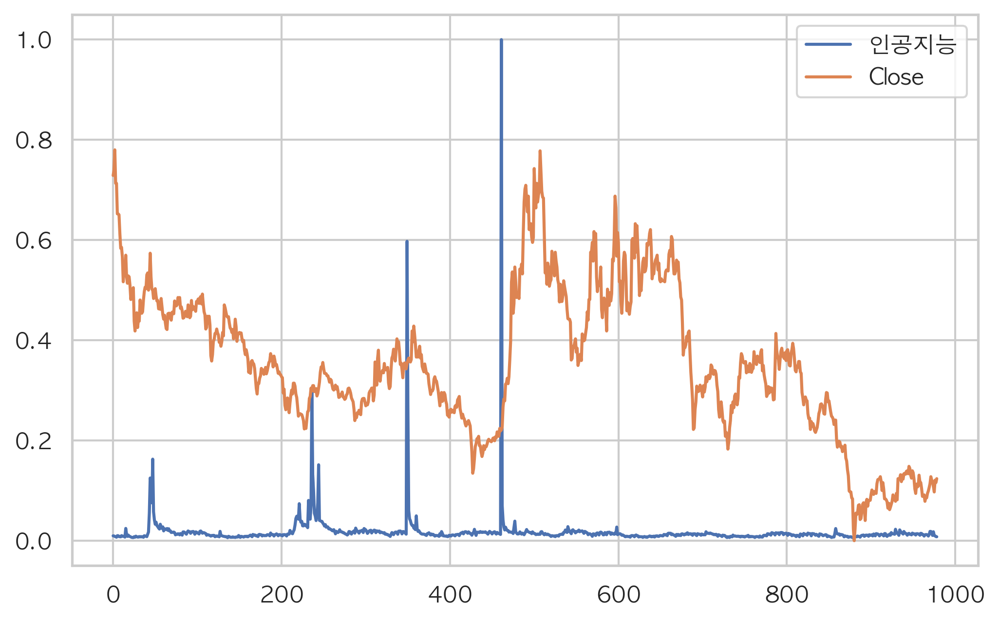

Pearson correlation 결과:
          인공지능    Close
인공지능   1.00000 -0.02347
Close -0.02347  1.00000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.5001
Close_y  0.0005   1.0000
------------------------------
Test Statistic           -2.215195
p-value                   0.200777
# Lags                   15.000000
# Observations          943.000000
Critical Value (1%)      -3.437304
Critical Value (5%)      -2.864610
Critical Value (10%)     -2.568405
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -8.009218e+00
p-value                 2.224649e-12
# Lags                  1.400000e+01
# Observations          9.430000e+02
Critical Value (1%)    -3.437304e+00
Critical Value (5%)    -2.864610e+00
Critical Value (10%)   -2.568405e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.01714039670347745
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 8.2280e-04 - val_mse: 8.2280e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 9.9086e-04 - mse: 9.9086e-04 - val_loss: 5.6844e-04 - val_mse: 5.6844e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 9.8790e-04 - mse: 9.8790e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 8.6780e-04 - mse: 8.6780e-04 - val_loss: 0.0017 - val_mse: 0.0017

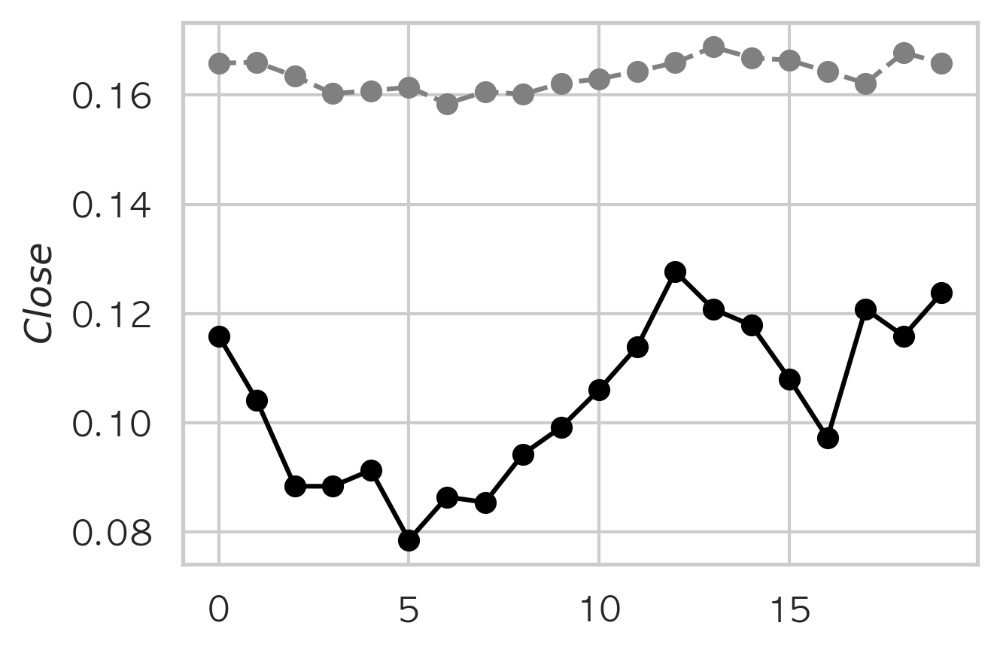

LSTM_RMSE: 0.060804700915235516
회사: 인포마크


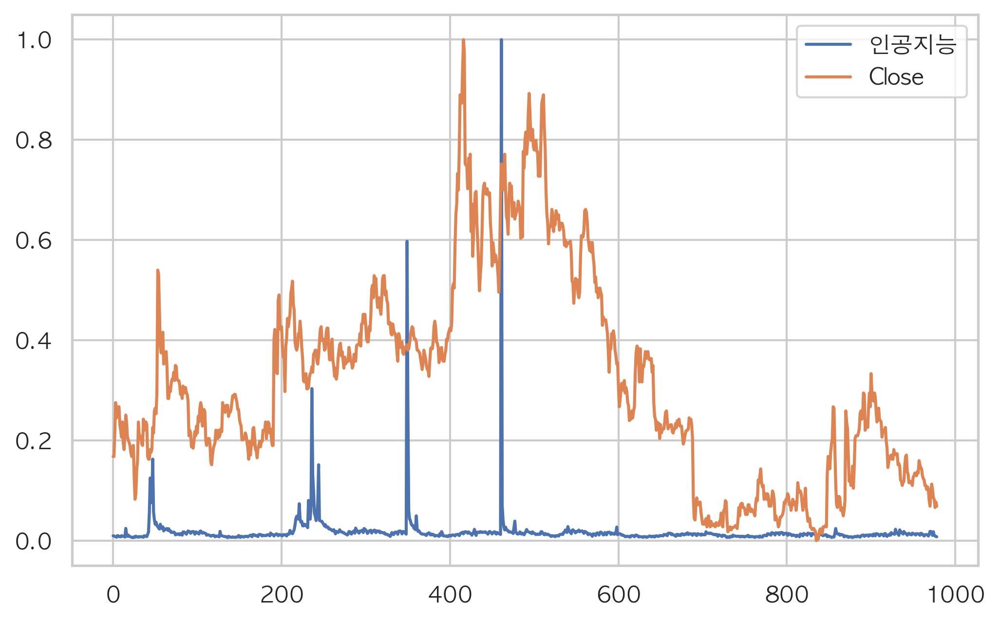

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.108302
Close  0.108302  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0053
Close_y  0.0511   1.0000
------------------------------
Test Statistic           -1.700329
p-value                   0.430943
# Lags                   18.000000
# Observations          940.000000
Critical Value (1%)      -3.437326
Critical Value (5%)      -2.864620
Critical Value (10%)     -2.568410
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -7.840235e+00
p-value                 5.964088e-12
# Lags                  1.700000e+01
# Observations          9.400000e+02
Critical Value (1%)    -3.437326e+00
Critical Value (5%)    -2.864620e+00
Critical Value (10%)   -2.568410e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.046990119782071293
Epoch 1/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0069 - mse: 0.0069 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 3/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 4/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 5/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 8.8635e-04 - val_mse: 8.8635e-04
Epoch 7/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 8.1199e-04 - val_mse: 8.1199e-04
Epoch 8/100
763/763 [=

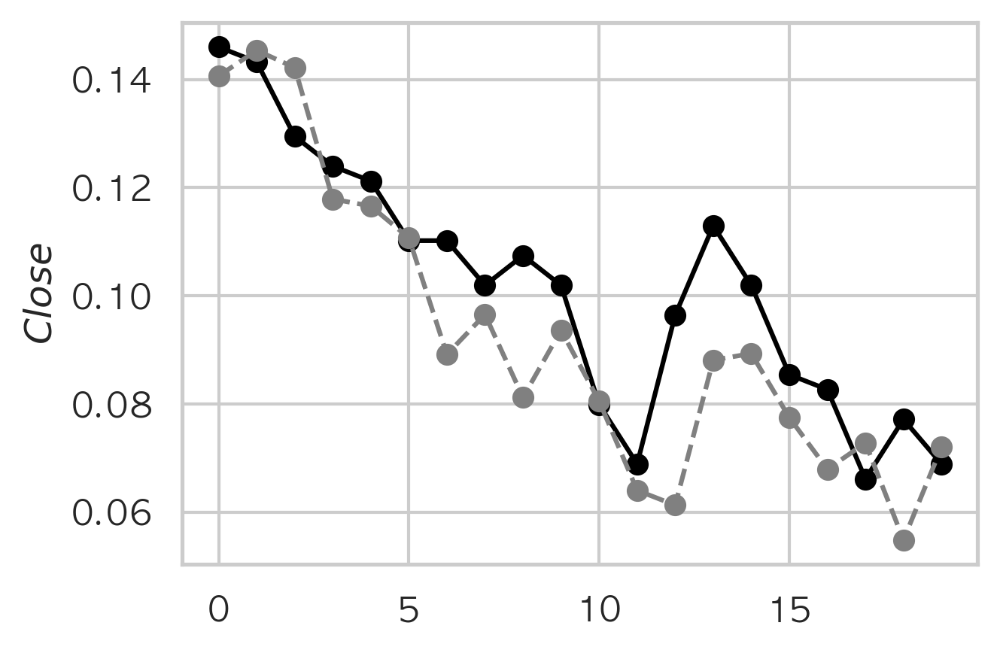

LSTM_RMSE: 0.014754369382256423
회사: 줌인터넷


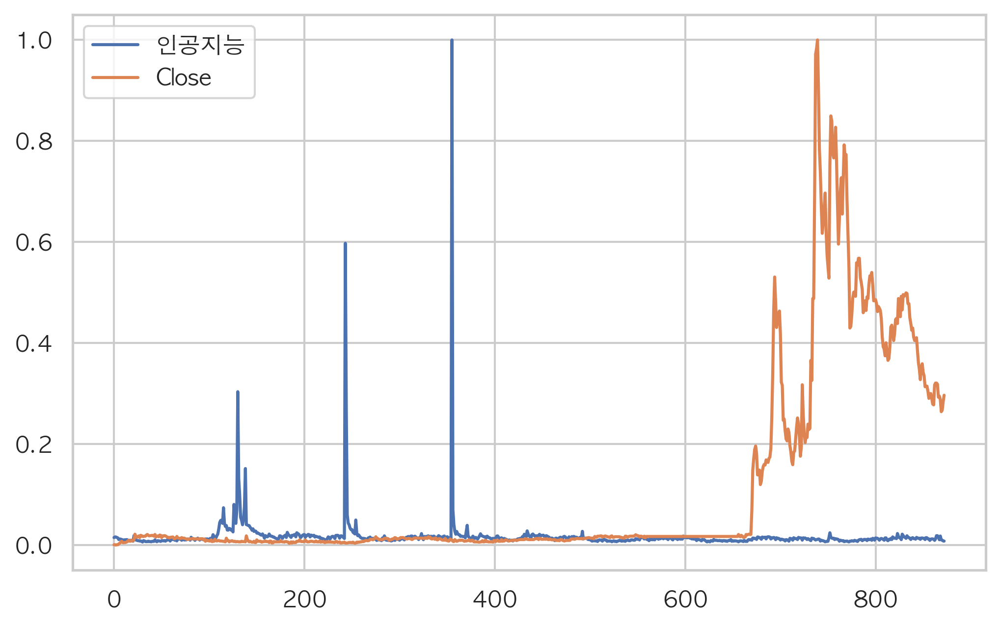

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000 -0.067326
Close -0.067326  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.1061
Close_y  0.9665   1.0000
------------------------------
Test Statistic           -1.454081
p-value                   0.556092
# Lags                   14.000000
# Observations          838.000000
Critical Value (1%)      -3.438177
Critical Value (5%)      -2.864995
Critical Value (10%)     -2.568610
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -8.653010e+00
p-value                 5.055557e-14
# Lags                  1.300000e+01
# Observations          8.380000e+02
Critical Value (1%)    -3.438177e+00
Critical Value (5%)    -2.864995e+00
Critical Value (10%)   -2.568610e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.05072259583145901
Epoch 1/100
678/678 [==============================] - 2s 3ms/step - loss: 1.9573e-04 - mse: 1.9573e-04 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 2/100
678/678 [==============================] - 1s 2ms/step - loss: 1.2588e-04 - mse: 1.2588e-04 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 3/100
678/678 [==============================] - 1s 2ms/step - loss: 1.1373e-04 - mse: 1.1373e-04 - val_loss: 0.0457 - val_mse: 0.0457
Epoch 4/100
678/678 [==============================] - 1s 2ms/step - loss: 6.9860e-05 - mse: 6.9860e-05 - val_loss: 0.0367 - val_mse: 0.0367
Epoch 5/100
678/678 [==============================] - 2s 2ms/step - loss: 8.2215e-05 - mse: 8.2215e-05 - val_loss: 0.0465 - val_mse: 0.0465
Epoch 6/100
678/678 [==============================] - 2s 2ms/step - loss: 5.5496e-05 - mse: 5.5496e-05 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 7/100
678/678 [==============================] - 2s 2ms/step - loss: 7.8361e-05 - mse: 7.8361e-05 - val_loss: 0.0616 -

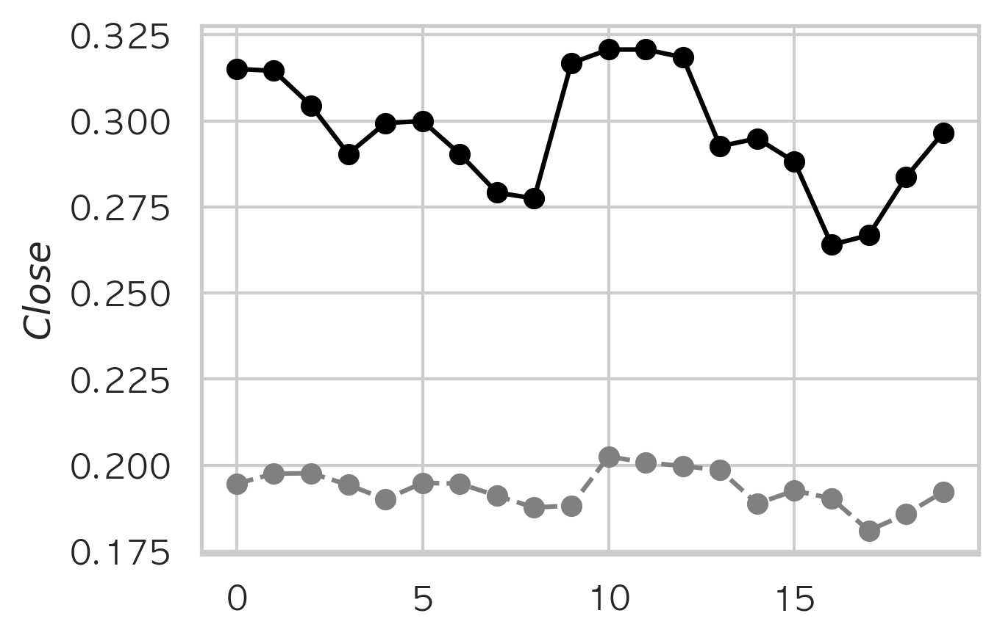

LSTM_RMSE: 0.10444209746061067
회사: 코너스톤네트웍스


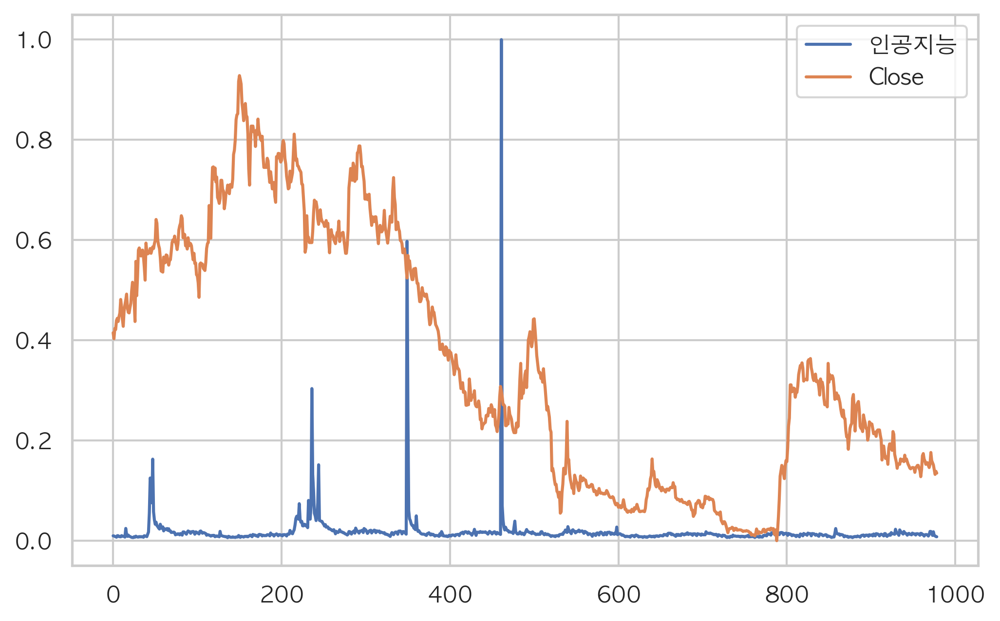

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.089652
Close  0.089652  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0226
Close_y  0.3158   1.0000
------------------------------
Test Statistic           -1.015337
p-value                   0.747630
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -30.396749
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.019423071823971766
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0056 - mse: 0.0056 - val_loss: 8.6003e-04 - val_mse: 8.6003e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 7.1290e-04 - val_mse: 7.1290e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 5.7056e-04 - val_mse: 5.7056e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 4.5665e-04 - val_mse: 4.5665e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 8.6743e-04 - mse: 8.6743e-04 - val_loss: 5.7372e-04 - val_mse: 5.7372e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 9.2525e-04 - mse: 9.2525e-04 - val_loss: 6.5776e

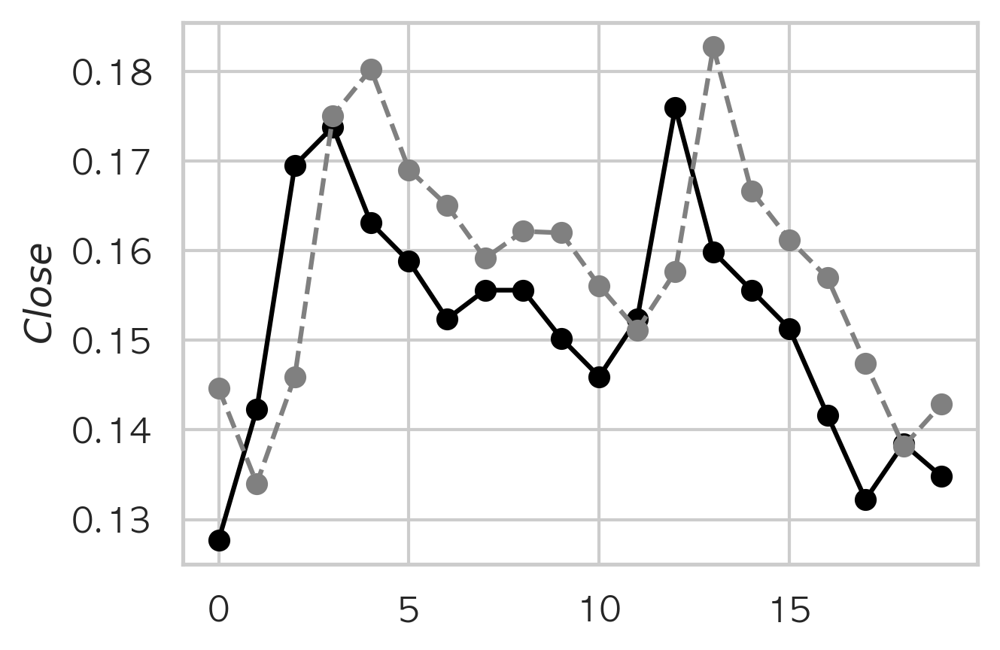

LSTM_RMSE: 0.012994944277549754
회사: 큐렉소


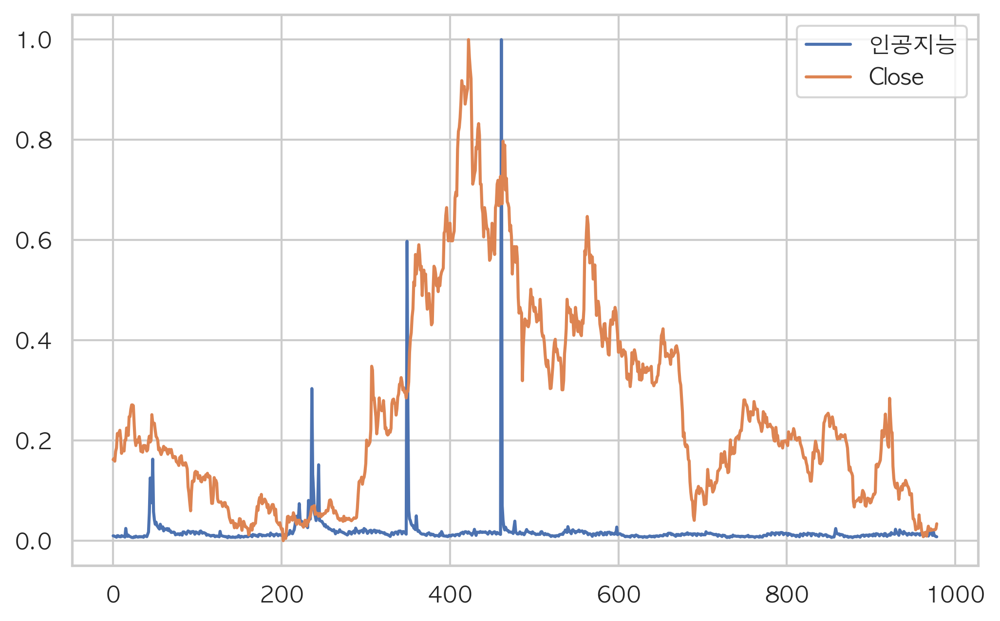

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.038123
Close  0.038123  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y      1.0   0.0001
Close_y     0.0   1.0000
------------------------------
Test Statistic           -1.643065
p-value                   0.460660
# Lags                    1.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -28.835842
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.008888276773369126
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0058 - mse: 0.0058 - val_loss: 6.7668e-04 - val_mse: 6.7668e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 4.6601e-04 - val_mse: 4.6601e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 6.2874e-04 - val_mse: 6.2874e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 3.7308e-04 - val_mse: 3.7308e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 6.2539e-04 - val_mse: 6.2539e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 2.9828e-04 - val_mse: 2.9828e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 9.5692e-04 - mse: 9.5692e-04 - val_loss: 2.9456e

763/763 [==============================] - 1s 2ms/step - loss: 6.2716e-04 - mse: 6.2716e-04 - val_loss: 2.5199e-04 - val_mse: 2.5199e-04
Epoch 56/100
763/763 [==============================] - 1s 2ms/step - loss: 7.3472e-04 - mse: 7.3472e-04 - val_loss: 2.9489e-04 - val_mse: 2.9489e-04
Epoch 57/100
763/763 [==============================] - 1s 2ms/step - loss: 6.4916e-04 - mse: 6.4916e-04 - val_loss: 3.4148e-04 - val_mse: 3.4148e-04
Epoch 58/100
763/763 [==============================] - 1s 2ms/step - loss: 6.8956e-04 - mse: 6.8956e-04 - val_loss: 3.3763e-04 - val_mse: 3.3763e-04
Epoch 59/100
763/763 [==============================] - 1s 2ms/step - loss: 7.6277e-04 - mse: 7.6277e-04 - val_loss: 4.2008e-04 - val_mse: 4.2008e-04
Epoch 60/100
763/763 [==============================] - 1s 2ms/step - loss: 6.5491e-04 - mse: 6.5491e-04 - val_loss: 2.6920e-04 - val_mse: 2.6920e-04
Epoch 61/100
763/763 [==============================] - 1s 2ms/step - loss: 7.0995e-04 - mse: 7.0995e-04 - val_lo

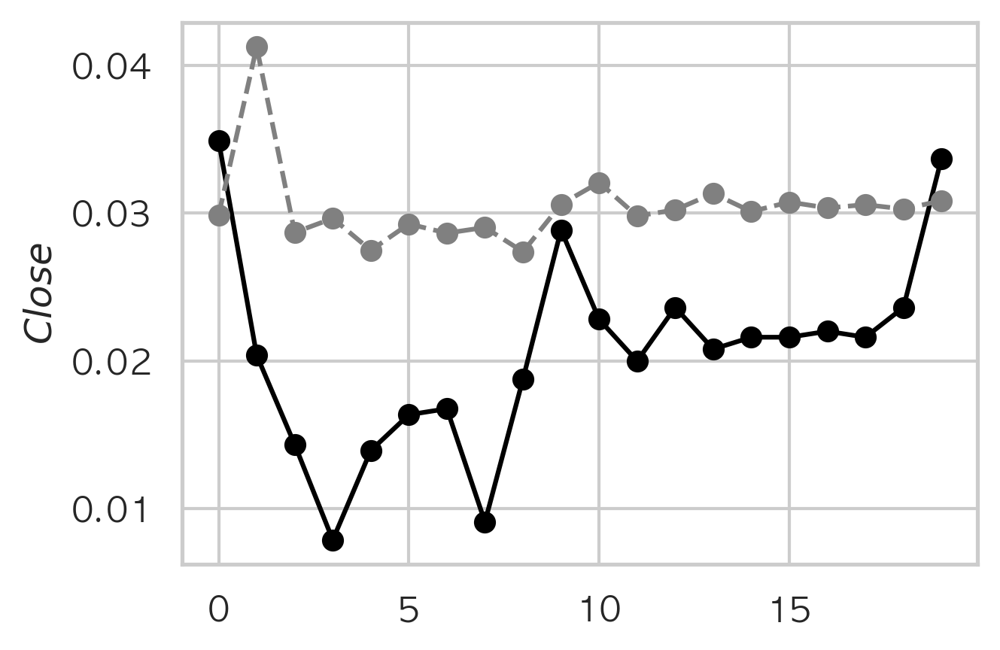

LSTM_RMSE: 0.011829547208776508
회사: 퍼스텍


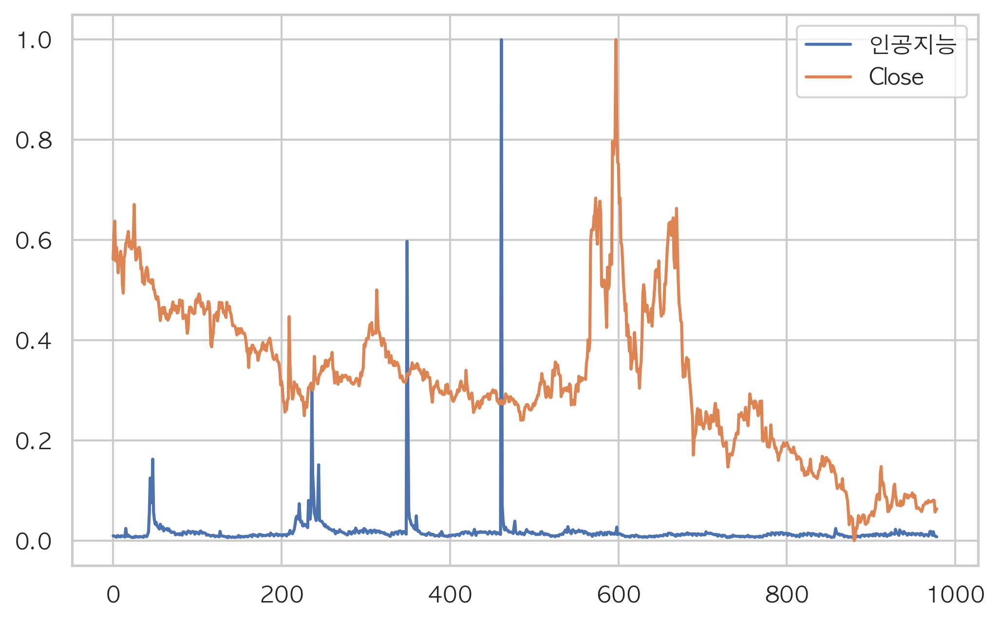

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.017075
Close  0.017075  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y     1.00   0.7144
Close_y    0.92   1.0000
------------------------------
Test Statistic           -1.918717
p-value                   0.323308
# Lags                   13.000000
# Observations          945.000000
Critical Value (1%)      -3.437289
Critical Value (5%)      -2.864603
Critical Value (10%)     -2.568401
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.053077e+01
p-value                 9.164226e-19
# Lags                  1.200000e+01
# Observations          9.450000e+02
Critical Value (1%)    -3.437289e+00
Critical Value (5%)    -2.864603e+00
Critical Value (10%)   -2.568401e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.01347334080264177
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 9.9727e-04 - val_mse: 9.9727e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 9.3696e-04 - mse: 9.3696e-04 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 8/100
763/763 [==

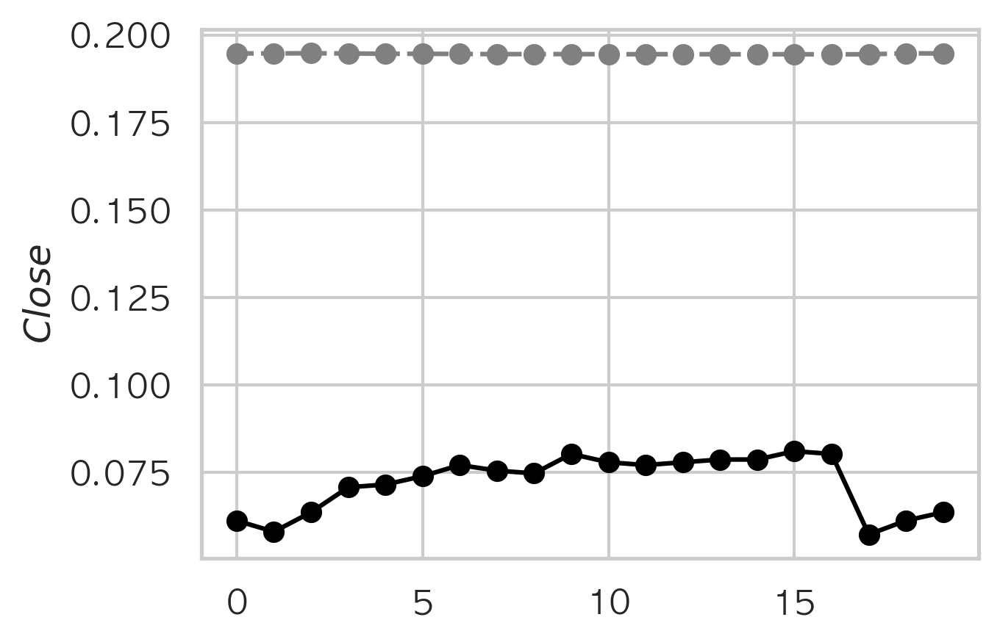

LSTM_RMSE: 0.12291518727746231
회사: 한국전자인증


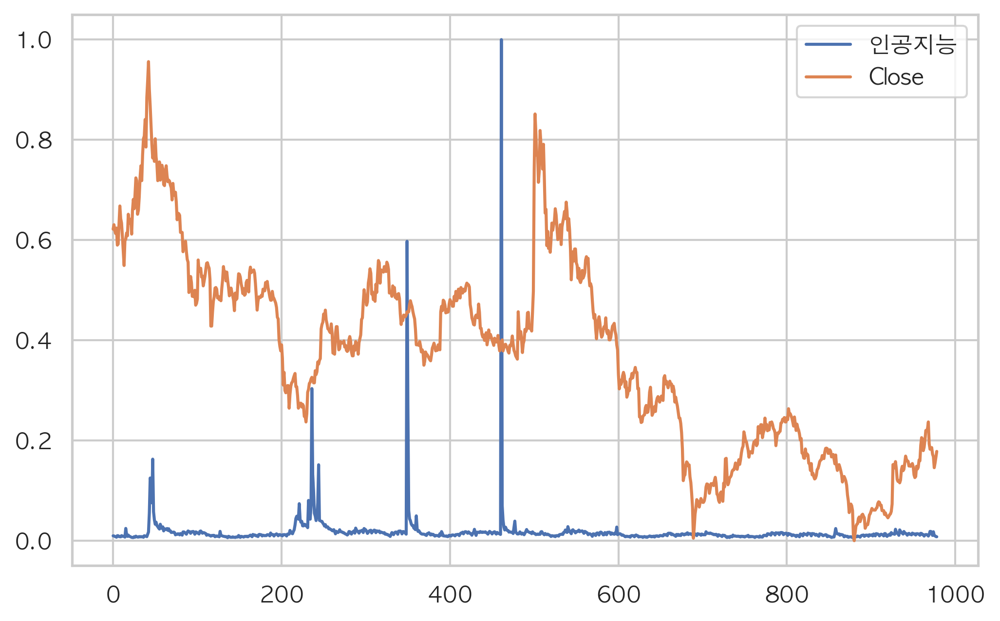

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.064921
Close  0.064921  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y     1.00   0.0991
Close_y    0.41   1.0000
------------------------------
Test Statistic           -1.744662
p-value                   0.408260
# Lags                    7.000000
# Observations          951.000000
Critical Value (1%)      -3.437245
Critical Value (5%)      -2.864584
Critical Value (10%)     -2.568391
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic         -1.176783e+01
p-value                 1.108094e-21
# Lags                  6.000000e+00
# Observations          9.510000e+02
Critical Value (1%)    -3.437245e+00
Critical Value (5%)    -2.864584e+00
Critical Value (10%)   -2.568391e+00
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.044235637755171926
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0069 - mse: 0.0069 - val_loss: 6.0197e-04 - val_mse: 6.0197e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 5.0185e-04 - val_mse: 5.0185e-04
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 4.1061e-04 - val_mse: 4.1061e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 3.6125e-04 - val_mse: 3.6125e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 4.4671e-04 - val_mse: 4.4671e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 9.9467e-04 - mse: 9.9467e-04 - val_loss: 3.6058e-04 - val_mse: 3.6058e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 8.9677e-04 - mse: 8.9677e-04 - val_loss:

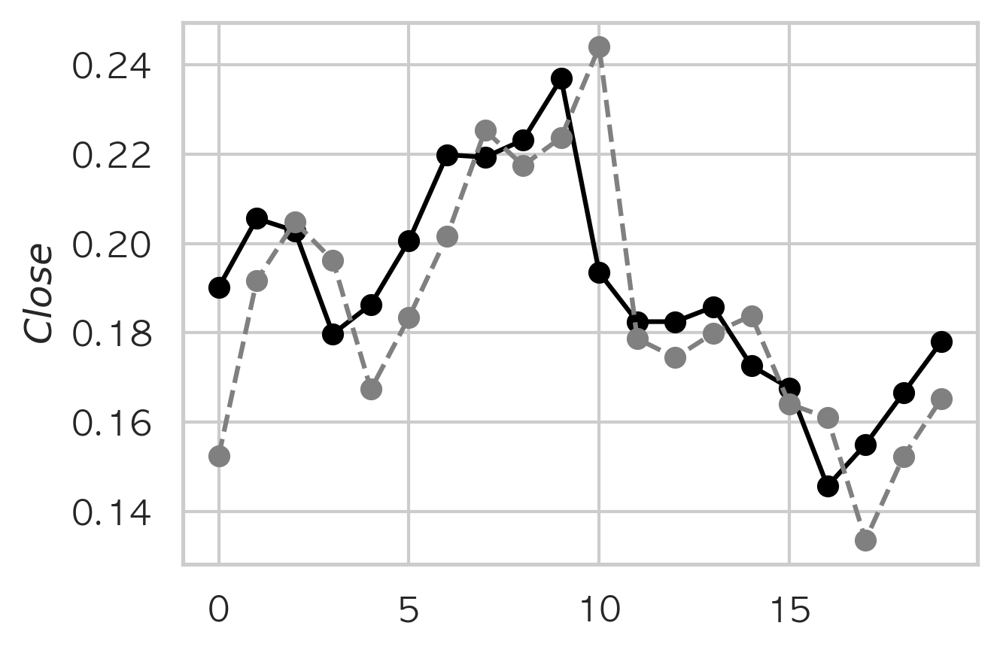

LSTM_RMSE: 0.018690505433161614
회사: 한화에어로스페이스


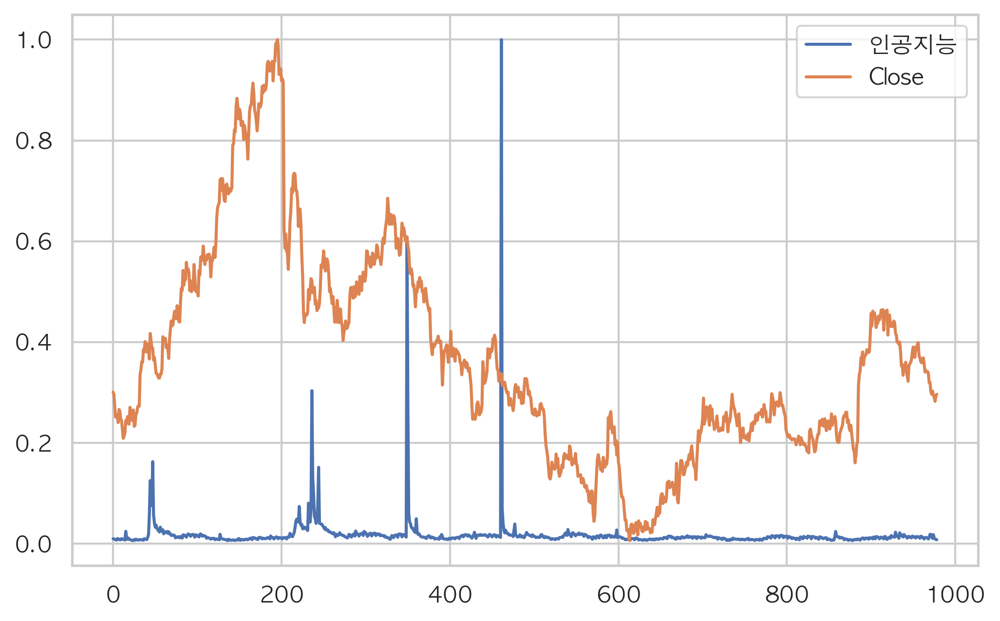

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.066164
Close  0.066164  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000    0.097
Close_y  0.0472    1.000
------------------------------
Test Statistic           -1.585463
p-value                   0.490892
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -30.320171
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.053649750764661455
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 4.8367e-04 - val_mse: 4.8367e-04
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 4.6227e-04 - val_mse: 4.6227e-04
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 3.9639e-04 - val_mse: 3.9639e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 4.2821e-04 - val_mse: 4.2821e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 4.4554e-04 - val_mse: 4.4554e-0

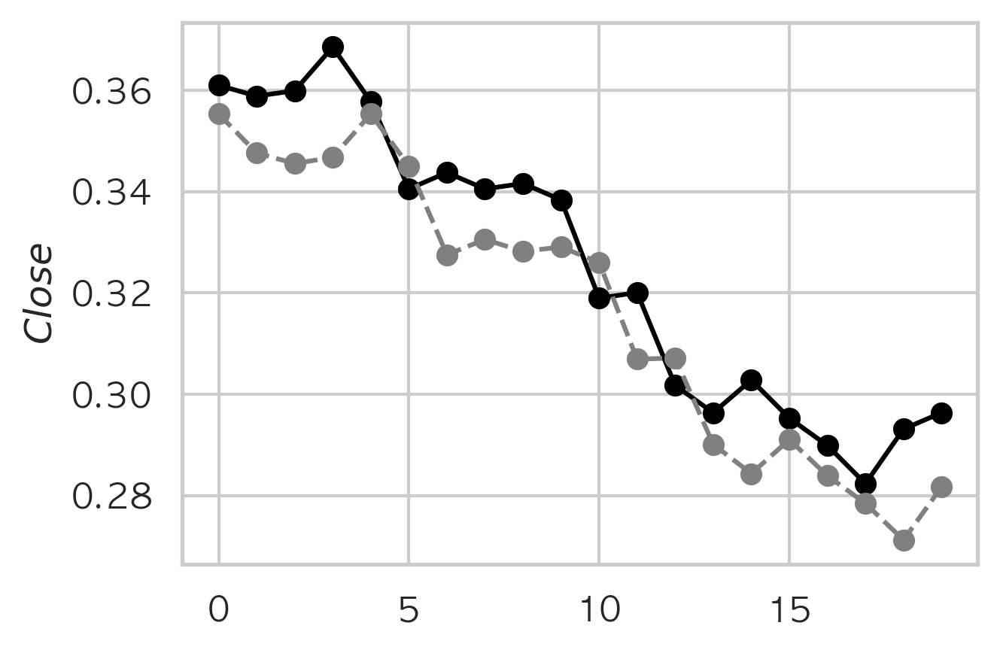

LSTM_RMSE: 0.012020467132593906
회사: 휴림로봇


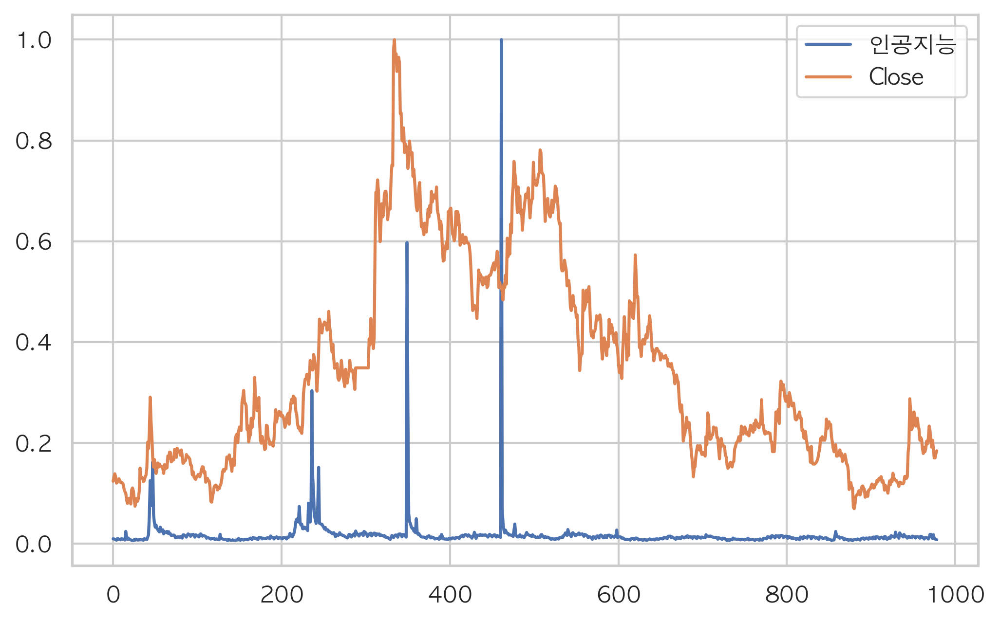

Pearson correlation 결과:
           인공지능     Close
인공지능   1.000000  0.096537
Close  0.096537  1.000000
------------------------------
granger causality test결과:
- 복합키워드_일별_네이버의 
         인공지능_x  Close_x
인공지능_y   1.0000   0.0001
Close_y  0.0001   1.0000
------------------------------
Test Statistic           -1.876949
p-value                   0.342981
# Lags                    0.000000
# Observations          958.000000
Critical Value (1%)      -3.437194
Critical Value (5%)      -2.864562
Critical Value (10%)     -2.568379
dtype: float64
 Series is Non-Stationary
------------------------------
Test Statistic          -30.288243
p-value                   0.000000
# Lags                    0.000000
# Observations          957.000000
Critical Value (1%)      -3.437202
Critical Value (5%)      -2.864565
Critical Value (10%)     -2.568381
dtype: float64
 Series is Stationary


/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/qingxuan/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


VAR_RMSE: 0.025881162725507733
Epoch 1/100
763/763 [==============================] - 2s 2ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 4.5831e-04 - val_mse: 4.5831e-04
Epoch 2/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 3/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 4/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 5/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 3.5470e-04 - val_mse: 3.5470e-04
Epoch 6/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 3.0963e-04 - val_mse: 3.0963e-04
Epoch 7/100
763/763 [==============================] - 1s 2ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 2.6651e-04 - val_mse: 2.6651e-04
Epoch 

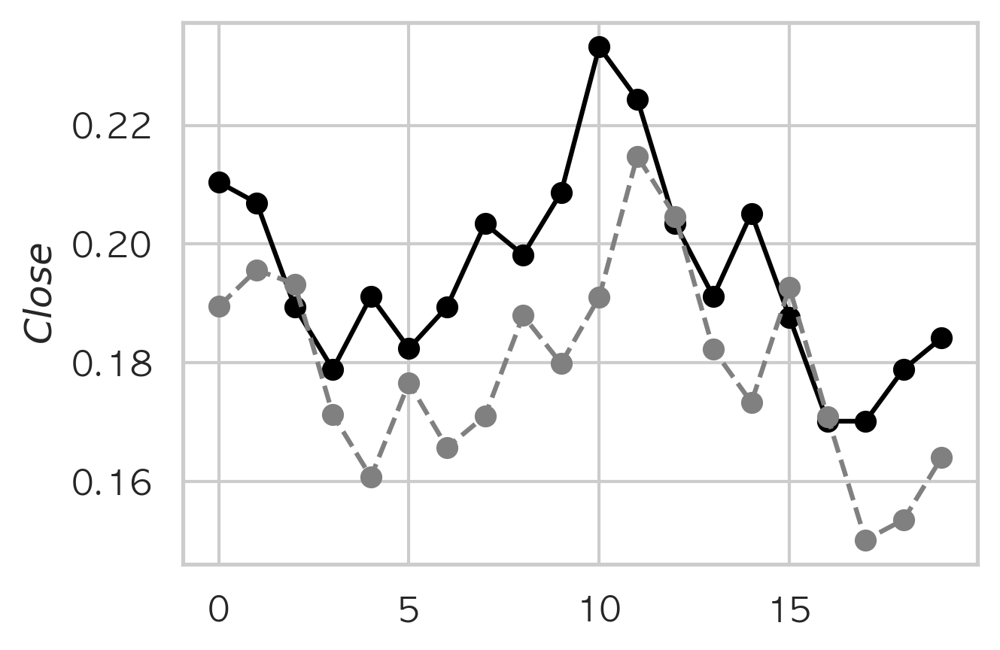

LSTM_RMSE: 0.020708570456949713


In [158]:
# 폴더에 있는 모든 주식데이터 파일를 불어오기

path = r'./주가 데이터/일별/지능형로봇_인공지능(AI)'
file = sorted(glob.glob(os.path.join(path, "*.csv")))
aic_p = []

# 주식데이터 처리

for i in range(len(file)):
    n = file[i]
    f = pd.read_csv(n)
    for x in range(0,len(f['Date'])):
        f['Date'][x] = f['Date'][x][:10]
    f = f.dropna(axis=0, how='any')[['Date','Close']]
    f_scale = scaleColumns(f,['Close'])
    
    
    # 회사명 출력
    begin=n.rfind('/')
    end=n.rfind('_')
    print("회사:",n[begin+1:end])
    
    
    # 복합키워드_일별_네이버
    df_complex = pd.merge(ai_keyword_complex,f,on="Date", how="inner")
    b = df_complex[["인공지능","Close"]]
    ax = df_complex.plot()
    plt.show()
   

    # Pearson Correlation
    print('Pearson correlation 결과:')
    corr = b.corr(method='pearson')
    print(corr)
    print("------------------------------")
    
    
    # Granger Causality test
    print("granger causality test결과:")
    print("- 복합키워드_일별_네이버의 ")
    maxlag=20
    test = 'ssr-chi2test'
    print(grangers_causality_matrix(b, variables = b.columns))
    print("------------------------------")
    
    
    # Split data
    complex_train = b.iloc[:-20, :]
    complex_test = b.iloc[-20:, :]
    
    
    # apply adf test on the series
    adf_test(complex_train["Close"])
    print("------------------------------")
    
    # 1st difference
    df_differenced = complex_train.diff(1).dropna()

    # stationarity test again with differenced data
    adf_test(df_differenced["Close"])
    
    # AIC
    from statsmodels.tsa.vector_ar.var_model import VAR
    model = VAR(df_differenced)
    aic_list = []
    for i in range(1,50):
        result = model.fit(i)
        aic_list.append(result.aic)
    lag_order = aic_list.index(min(aic_list))+1
    
    # model fitting

    from statsmodels.tsa.vector_ar.var_model import VAR
    model = VAR(df_differenced)
    results = model.fit(maxlags=lag_order, ic='aic') 
    
    # predict
    forecast_input = df_differenced.values[-lag_order:]
    nobs = 20
    fc = results.forecast(y=forecast_input, steps=nobs)
    df_forecast = pd.DataFrame(fc, index=b.index[-nobs:], columns=b.columns + '_1d')       
    
    # 
    df_results = invert_transformation(complex_train, df_forecast)
    df_results = df_results.loc[:, ['인공지능_forecast', 'Close_forecast']]
    from sklearn import metrics
    y = b[-20:].values[:,1]
    y_hat = df_results.values[:,1]
    MSE = metrics.mean_squared_error(y, y_hat)
    RMSE = metrics.mean_squared_error(y, y_hat)**0.5
    
    print('VAR_RMSE:',RMSE)
    print('====================================================')
    
    # LSTM
    
    # 데이터 처리
    b_array = b.values
    x, y = split_xy5(b_array, 5, 1) 
    x_train = x[:-20]
    x_test = x[-20:]
    y_train = y[:-20]
    y_test = y[-20:]
    
    # 모델구성
    model = Sequential()
    model.add(LSTM(64, input_shape=(5, 2)))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(32, activation='relu'))
    
    model.add(Dense(1))
    
    model.compile(loss='mse', optimizer='adam', metrics=['mse'])
    
    from keras.callbacks import EarlyStopping
    early_stopping = EarlyStopping(patience=20)
    model.fit(x_train, y_train, validation_split=0.2, verbose=1,
              batch_size=1, epochs=100, callbacks=[early_stopping])
    
    loss, mse = model.evaluate(x_test, y_test, batch_size=1)
    print('loss : ', loss)
    print('mse : ', mse)
    
    y_pred = model.predict(x_test)
     
    

    plt.figure(figsize=(10,7))
    plt.subplot(2,2,2)
    plt.plot(range(len(y_test)),y_test,'o-',c='black')
    plt.plot(range(len(y_test)),y_pred,'o--',c='gray')
    plt.ylabel("$"+ b.columns[1]+"$")
    plt.show()    
    # 모델 성능 테스트
    MSE = metrics.mean_squared_error(y_test, y_pred)
    RMSE = metrics.mean_squared_error(y_test, y_pred)**0.5
    print('LSTM_RMSE:',RMSE)
    
        
    #df_sigle_google = pd.merge(ai_keyword_sigle_google,f[['Date','Close']],on="Date", how="inner")
    #df_sigle_naver = pd.merge(ai_keyword_sigle_naver,f[['Date','Close']],on="Date", how="inner")
    
    
    
    
    
    
    
    
    
    # granger causality tests 결과 출력
    #print("1.복합키워드_일별_네이버의 granger causality test결과:")
    #print(grangercausalitytests(df_complex[['인공지능', 'Close']], maxlag=2))
    #print("2.단일키워드_일별_구글의 granger causality test결과:")
    #print(grangercausalitytests(df_sigle_google[['인공지능', 'Close']], maxlag=2))
    #print("3.단일키워드_일별_네이버의 granger causality test결과:")
    #print(grangercausalitytests(df_sigle_naver[['인공지능', 'Close']], maxlag=2))
    
    
    ##VAR
    #complex_train = df_complex.iloc[:-20,:]
    #b = complex_train[['인공지능','Close']]
    #c = df_complex[['인공지능','Close']]
#
    ## 차분하지 않은 데이터의 p값이 0.05이하 아니라서 1차 차분 진행
    #subdata_diff1 = b.iloc[1:,:].values - b.iloc[:-1,:].values
    #for i in range(2):
    #    pvalue = stat.adfuller(subdata_diff1[:,i], 1)[1]
    #rows, cols = subdata_diff1.shape
    #aicList = []
    #lmList = []
#
    #
    #for p in range(1,11):
    #    baseData = None
    #    for i in range(p,rows):
    #        tmp_list = list(subdata_diff1[i,:]) + list(subdata_diff1[i-p:i].flatten())
    #        if baseData is None:
    #            baseData = [tmp_list]
    #        else:
    #            baseData = np.r_[baseData, [tmp_list]]
    #    X = np.c_[[1]*baseData.shape[0],baseData[:,cols:]]
    #    Y = baseData[:,0:cols]
    #    coefMatrix = np.matmul(np.matmul(np.linalg.inv(np.matmul(X.T,X)),X.T),Y)
    #    aic = np.log(np.linalg.det(np.cov(Y - np.matmul(X,coefMatrix),rowvar=False))) + 2*(coefMatrix.shape[0]-1)**2*p/baseData.shape[0]
    #     
    #    aicList.append(aic)
    #    lmList.append(coefMatrix)
    #
    #print(pd.DataFrame({"P":range(1,11),"AIC":aicList}))
    #
    #p = np.argmin(aicList)+1
    #print(p)
    #n = rows
    #preddf = None
    #for i in range(20):
    #    predData = list(subdata_diff1[n+i-p:n+i].flatten())
    #    a = [1]+predData
    #    predVals = a @ lmList[p-1]
    #    # 역 차분 계산하고 예측값을 구출
    #    predVals= c.iloc[n+i,:].values[:4]+predVals
    #    if preddf is None:
    #         preddf = [predVals]
    #    else:
    #        preddf = np.r_[preddf, [predVals]]
    #    # subdata_diff1에 새로운 기록 추가
    #    subdata_diff1 = np.r_[subdata_diff1, [c.iloc[n+i+1,:].values[:4] -c.iloc[n+i,:].values[:4]]]
    #
    #plt.figure(figsize=(10,7))
    #for i in range(2):
    #    plt.subplot(2,2,i+1)
    #    plt.plot(range(20),c.iloc[-20:c.shape[0],i].values,'o-',c='black')
    #    plt.plot(range(20),preddf[:,i],'o--',c='gray')
    #    plt.ylabel("$"+ c.columns[i]+"$")
    #plt.show()
    #v = 100*(1 - np.sum(np.abs(preddf - c.iloc[-20:c.shape[0],:2]).values)/np.sum(c.iloc[-20:c.shape[0],:2].values))
    #print("Evaluation on test data: accuracy = %0.2f%% \n" % v)\

    
    

## 클라우드컴퓨팅

In [477]:
# 폴더에 있는 모든 주식데이터 파일를 불어오기

path = r'./주가 데이터/일별/클라우드컴퓨팅'
file = sorted(glob.glob(os.path.join(path, "*.csv")))


# 주식데이터 처리

for i in range(len(file)):
    n = file[i]
    f = pd.read_csv(n)
    for x in range(0,len(f['Date'])):
        f['Date'][x] = f['Date'][x][:10]
    f = f.dropna(axis=0, how='any')[['Date','Close']]
    f_scale = scaleColumns(f,['Close'])
    df_complex = pd.merge(cloud_keyword_complex,f,on="Date", how="inner")
    df_sigle_google = pd.merge(cloud_keyword_sigle_google,f[['Date','Close']],on="Date", how="inner")
    df_sigle_naver = pd.merge(cloud_keyword_sigle_naver,f[['Date','Close']],on="Date", how="inner")
    # 회사명 출력
    begin=n.rfind('/')
    end=n.rfind('.')   
    print("회사:",n[begin+1:end])
    # granger causality tests 결과 출력
    print("1.복합키워드_일별_네이버의 granger causality test결과:")
    print(grangercausalitytests(df_complex[['클라우드 컴퓨팅', 'Close']], maxlag=2))
    print("2.단일키워드_일별_구글의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_google[['클라우드컴퓨팅', 'Close']], maxlag=2))
    print("3.단일키워드_일별_네이버의 granger causality test결과:")
    print(grangercausalitytests(df_sigle_naver[['클라우드 컴퓨팅', 'Close']], maxlag=2))

회사: DB
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0874  , p=0.2973  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=1.0907  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0901  , p=0.2964  , df=1
parameter F test:         F=1.0874  , p=0.2973  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2333  , p=0.2918  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=2.4794  , p=0.2895  , df=2
likelihood ratio test: chi2=2.4762  , p=0.2899  , df=2
parameter F test:         F=1.2333  , p=0.2918  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (1.0873635180626715, 0.2973145880979271, 975.0, 1), 'ssr_chi2test': (1.0907092519644026, 0.296314114997154, 1), 'lrtest': (1.0901014999644758, 0.29644872085511165, 1), 'params_ftest': (1.087363518062903, 0.29731458809790207, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab47832d0>,

회사: SGA
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.2819 , p=0.0000  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=17.3351 , p=0.0000  , df=1
likelihood ratio test: chi2=17.1832 , p=0.0000  , df=1
parameter F test:         F=17.2819 , p=0.0000  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.2047  , p=0.0008  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=14.4835 , p=0.0007  , df=2
likelihood ratio test: chi2=14.3772 , p=0.0008  , df=2
parameter F test:         F=7.2047  , p=0.0008  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (17.28189530571406, 3.505850140175314e-05, 975.0, 1), 'ssr_chi2test': (17.33507036819318, 3.1335026960758405e-05, 1), 'lrtest': (17.183229753092746, 3.394195433820362e-05, 1), 'params_ftest': (17.281895305713814, 3.505850140175924e-05, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7f

회사: SK
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.3411 , p=0.0008  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=11.3760 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3103 , p=0.0008  , df=1
parameter F test:         F=11.3411 , p=0.0008  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0502  , p=0.1293  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=4.1215  , p=0.1274  , df=2
likelihood ratio test: chi2=4.1128  , p=0.1279  , df=2
parameter F test:         F=2.0502  , p=0.1293  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (11.341065394590382, 0.0007877659073647397, 975.0, 1), 'ssr_chi2test': (11.37596098041989, 0.0007440072288107545, 1), 'lrtest': (11.310307798665235, 0.0007707799404846822, 1), 'params_ftest': (11.341065394590625, 0.000787765907364653, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faa

회사: 가비아
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5241 , p=0.0001  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=15.5719 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4492 , p=0.0001  , df=1
parameter F test:         F=15.5241 , p=0.0001  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1069  , p=0.0167  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=8.2561  , p=0.0161  , df=2
likelihood ratio test: chi2=8.2214  , p=0.0164  , df=2
parameter F test:         F=4.1069  , p=0.0167  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (15.524086659448562, 8.72691547393125e-05, 975.0, 1), 'ssr_chi2test': (15.571853079939174, 7.942823654881081e-05, 1), 'lrtest': (15.449184846977914, 8.475349032850609e-05, 1), 'params_ftest': (15.524086659448404, 8.726915473932274e-05, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7f

회사: 다우기술
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9780  , p=0.0847  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=2.9871  , p=0.0839  , df=1
likelihood ratio test: chi2=2.9826  , p=0.0842  , df=1
parameter F test:         F=2.9780  , p=0.0847  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0370  , p=0.3549  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=2.0846  , p=0.3526  , df=2
likelihood ratio test: chi2=2.0824  , p=0.3530  , df=2
parameter F test:         F=1.0370  , p=0.3549  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (2.9779511584246, 0.08472289415368364, 975.0, 1), 'ssr_chi2test': (2.9871140850659064, 0.08392962196404409, 1), 'lrtest': (2.9825615680347255, 0.08416597009079514, 1), 'params_ftest': (2.9779511584244283, 0.0847228941536956, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab454a610

회사: 모바일리더
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.2636 , p=0.0001  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=16.3137 , p=0.0001  , df=1
likelihood ratio test: chi2=16.1791 , p=0.0001  , df=1
parameter F test:         F=16.2636 , p=0.0001  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6593  , p=0.0261  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=7.3562  , p=0.0253  , df=2
likelihood ratio test: chi2=7.3287  , p=0.0256  , df=2
parameter F test:         F=3.6593  , p=0.0261  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (16.263637583788814, 5.9414405133876924e-05, 975.0, 1), 'ssr_chi2test': (16.313679545585085, 5.367507425398808e-05, 1), 'lrtest': (16.17911250646557, 5.7626038544545106e-05, 1), 'params_ftest': (16.263637583789173, 5.9414405133866366e-05, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at

회사: 안랩
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2383  , p=0.6255  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=0.2391  , p=0.6249  , df=1
likelihood ratio test: chi2=0.2390  , p=0.6249  , df=1
parameter F test:         F=0.2383  , p=0.6255  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1088  , p=0.8969  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=0.2187  , p=0.8964  , df=2
likelihood ratio test: chi2=0.2187  , p=0.8964  , df=2
parameter F test:         F=0.1088  , p=0.8969  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (0.23833418072371995, 0.6255216246572399, 975.0, 1), 'ssr_chi2test': (0.2390675166644083, 0.6248804159600431, 1), 'lrtest': (0.23903830195831688, 0.6249015681282364, 1), 'params_ftest': (0.23833418072380158, 0.6255216246572399, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4778d5

회사: 엔텔스
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4747  , p=0.2249  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=1.4793  , p=0.2239  , df=1
likelihood ratio test: chi2=1.4781  , p=0.2241  , df=1
parameter F test:         F=1.4747  , p=0.2249  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7020  , p=0.4959  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=1.4111  , p=0.4938  , df=2
likelihood ratio test: chi2=1.4101  , p=0.4941  , df=2
parameter F test:         F=0.7020  , p=0.4959  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (1.4747163255817592, 0.22489707435348438, 975.0, 1), 'ssr_chi2test': (1.4792539142758567, 0.22389129082253667, 1), 'lrtest': (1.4781363334104753, 0.2240663380181987, 1), 'params_ftest': (1.4747163255818245, 0.2248970743534414, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab2935cd

회사: 인프라웨어
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2770  , p=0.2587  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=1.2809  , p=0.2577  , df=1
likelihood ratio test: chi2=1.2800  , p=0.2579  , df=1
parameter F test:         F=1.2770  , p=0.2587  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9725  , p=0.3785  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=1.9550  , p=0.3762  , df=2
likelihood ratio test: chi2=1.9531  , p=0.3766  , df=2
parameter F test:         F=0.9725  , p=0.3785  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (1.276950302303661, 0.25874476040376637, 975.0, 1), 'ssr_chi2test': (1.2808793801569032, 0.2577355934560207, 1), 'lrtest': (1.2800413326667694, 0.2578913503246494, 1), 'params_ftest': (1.2769503023036926, 0.25874476040376637, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4786d

회사: 케이사인
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2363  , p=0.0223  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=5.2524  , p=0.0219  , df=1
likelihood ratio test: chi2=5.2384  , p=0.0221  , df=1
parameter F test:         F=5.2363  , p=0.0223  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4780  , p=0.2286  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=2.9712  , p=0.2264  , df=2
likelihood ratio test: chi2=2.9667  , p=0.2269  , df=2
parameter F test:         F=1.4780  , p=0.2286  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (5.236306067392163, 0.022333443462846422, 975.0, 1), 'ssr_chi2test': (5.252417778368754, 0.021916298269031995, 1), 'lrtest': (5.238363834845586, 0.022094043736381724, 1), 'params_ftest': (5.236306067392079, 0.02233344346284776, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7faab4757

회사: 코맥스
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=102.9621, p=0.0000  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=103.2789, p=0.0000  , df=1
likelihood ratio test: chi2=98.1815 , p=0.0000  , df=1
parameter F test:         F=102.9621, p=0.0000  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=25.9594 , p=0.0000  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=52.1859 , p=0.0000  , df=2
likelihood ratio test: chi2=50.8399 , p=0.0000  , df=2
parameter F test:         F=25.9594 , p=0.0000  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (102.96208536402861, 4.557514898974461e-23, 975.0, 1), 'ssr_chi2test': (103.2788917805333, 2.9113877442908272e-24, 1), 'lrtest': (98.18152618748445, 3.8173467941934514e-23, 1), 'params_ftest': (102.96208536402922, 4.557514898973101e-23, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x7

회사: 포스코 ICT
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=51.0706 , p=0.0000  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=51.2277 , p=0.0000  , df=1
likelihood ratio test: chi2=49.9311 , p=0.0000  , df=1
parameter F test:         F=51.0706 , p=0.0000  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.4210 , p=0.0000  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=24.9698 , p=0.0000  , df=2
likelihood ratio test: chi2=24.6560 , p=0.0000  , df=2
parameter F test:         F=12.4210 , p=0.0000  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (51.070561021853706, 1.7441090282158435e-12, 975.0, 1), 'ssr_chi2test': (51.227701209613265, 8.2249741992107e-13, 1), 'lrtest': (49.93113013743641, 1.592381197651454e-12, 1), 'params_ftest': (51.07056102185392, 1.7441090282156266e-12, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0

회사: 한글과컴퓨터
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.6057 , p=0.0000  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=22.6753 , p=0.0000  , df=1
likelihood ratio test: chi2=22.4164 , p=0.0000  , df=1
parameter F test:         F=22.6057 , p=0.0000  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.6898  , p=0.0013  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=13.4483 , p=0.0012  , df=2
likelihood ratio test: chi2=13.3566 , p=0.0013  , df=2
parameter F test:         F=6.6898  , p=0.0013  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (22.60572783942672, 2.288501323142841e-06, 975.0, 1), 'ssr_chi2test': (22.675283925086493, 1.9181940988938786e-06, 1), 'lrtest': (22.41641034145232, 2.194905993509078e-06, 1), 'params_ftest': (22.605727839427136, 2.288501323142349e-06, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0

회사: 효성ITX
1.복합키워드_일별_네이버의 granger causality test결과:

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8331 , p=0.0006  , df_denom=975, df_num=1
ssr based chi2 test:   chi2=11.8695 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7981 , p=0.0006  , df=1
parameter F test:         F=11.8331 , p=0.0006  , df_denom=975, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0262  , p=0.0490  , df_denom=972, df_num=2
ssr based chi2 test:   chi2=6.0836  , p=0.0477  , df=2
likelihood ratio test: chi2=6.0647  , p=0.0482  , df=2
parameter F test:         F=3.0262  , p=0.0490  , df_denom=972, df_num=2
{1: ({'ssr_ftest': (11.833097629454326, 0.0006065253447138616, 975.0, 1), 'ssr_chi2test': (11.869507160621879, 0.0005706051021176996, 1), 'lrtest': (11.798057481069009, 0.0005929255484337032, 1), 'params_ftest': (11.833097629454702, 0.0006065253447137103, 975.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0

# Test